![innomatics](https://dme2wmiz2suov.cloudfront.net/Institution(149)/Logo/573326-innomatics_research_labs_logo.png)

<h1 style="text-align:center;font-size:30px;" > Quora Question Pairs </h1>

## 1. Description

<p>Quora is a place to gain and share knowledge—about anything. It’s a platform to ask questions and connect with people who contribute unique insights and quality answers. This empowers people to learn from each other and to better understand the world.</p>
<p>
Over 100 million people visit Quora every month, so it's no surprise that many people ask similarly worded questions. Multiple questions with the same intent can cause seekers to spend more time finding the best answer to their question, and make writers feel they need to answer multiple versions of the same question. Quora values canonical questions because they provide a better experience to active seekers and writers, and offer more value to both of these groups in the long term.
</p>

1. The cost of a mis-classification can be very high.
2. You would want a probability of a pair of questions to be duplicates so that you can choose any threshold of choice.
3. No strict latency concerns.
4. Interpretability is partially important.

## 2. Real world and Constraints

__ Problem Statement __
- Identify which questions asked on Quora are duplicates of questions that have already been asked. 
- This could be useful to instantly provide answers to questions that have already been answered. 
- We are tasked with predicting whether a pair of questions are duplicates or not.

## 3. Data 

 ### 3.1 Data Overview

- Data will be in a file Train.csv <br>
- Train.csv contains 5 columns : qid1, qid2, question1, question2, is_duplicate <br>
- Size of Train.csv - 60MB <br>
- Number of rows in Train.csv = 404,290

### 3.2 Example Data point

"id","qid1","qid2","question1","question2","is_duplicate""0",

"1","2","What is the step by step guide to invest in share market in india?","What is the step by step guide to invest in share market?","0"

"1","3","4","What is the story of Kohinoor (Koh-i-Noor) Diamond?","What would happen if the Indian government stole the Kohinoor (Koh-i-Noor) diamond back?","0"

"7","15","16","How can I be a good geologist?","What should I do to be a great geologist?","1"

"11","23","24","How do I read and find my YouTube comments?","How can I see all my Youtube comments?","1"

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# 4. Exploratory Data Analysis

## 4.1 importing the neccesssary dependencies 

In [4]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from subprocess import check_output
from bs4 import BeautifulSoup
%matplotlib inline
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls
import os
import gc

import warnings
warnings.filterwarnings("ignore")

## 4.2 Loading the Data

In [ ]:
Data = pd.read_csv("/content/train.csv")

print("Number of data points:",Data.shape[0])

Number of data points: 404290


In [ ]:
Data.head()

,id,qid1,qid2,question1,question2,is_duplicate
0,0,1,2,What is the step by step guide to invest in sh...,What is the step by step guide to invest in sh...,0
1,1,3,4,What is the story of Kohinoor (Koh-i-Noor) Dia...,What would happen if the Indian government sto...,0
2,2,5,6,How can I increase the speed of my internet co...,How can Internet speed be increased by hacking...,0
3,3,7,8,Why am I mentally very lonely? How can I solve...,Find the remainder when [math]23^{24}[/math] i...,0
4,4,9,10,"Which one dissolve in water quikly sugar, salt...",Which fish would survive in salt water?,0


In [ ]:
Data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 404290 entries, 0 to 404289
Data columns (total 6 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   id            404290 non-null  int64 
 1   qid1          404290 non-null  int64 
 2   qid2          404290 non-null  int64 
 3   question1     404289 non-null  object
 4   question2     404288 non-null  object
 5   is_duplicate  404290 non-null  int64 
dtypes: int64(4), object(2)
memory usage: 18.5+ MB


We are given a minimal number of data fields here, consisting of:

- id:  Looks like a simple rowID
- qid{1, 2}:  The unique ID of each question in the pair
- question{1, 2}:  The actual textual contents of the questions.
- is_duplicate:  The label that we are trying to predict - whether the two questions are duplicates of each other.

### 4.2.1 Distribution of data points among output classes
- Number of duplicate(similar) and non-duplicate(non similar) questions

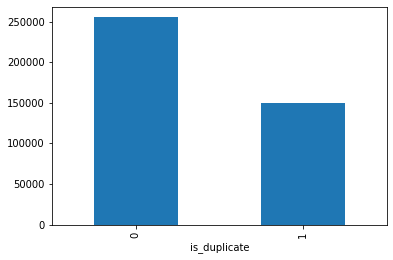

In [ ]:
Data.groupby("is_duplicate")['id'].count().plot.bar()

In [ ]:
Data['is_duplicate'].value_counts()

0    255027
1    149263
Name: is_duplicate, dtype: int64

It has been observed that our target class has an imbalance. So, we’ll try to downsample the data so that the minority class matches with the majority class.

In [ ]:
from sklearn.utils import resample
#create two different dataframe of majority and minority class 
df_majority = Data[(Data['is_duplicate']==0)] 
df_minority = Data[(Data['is_duplicate']==1)] 
# down sample majority class
df_majority_downsampled = resample(df_majority, 
                                 replace=True,    # sample with replacement
                                 n_samples= 149263, # to match minority class
                                 random_state=42)  # reproducible results
# Combine majority class with upsampled minority class
df_downsampled = pd.concat([df_majority_downsampled, df_minority])

In [ ]:
print('~> Total number of question pairs for training:\n   {}'.format(len(df_downsampled)))

~> Total number of question pairs for training:
   298526


In [ ]:
print('~> Question pairs are not Similar (is_duplicate = 0):\n   {}%'.format(100 - round(df_downsampled['is_duplicate'].mean()*100, 2)))
print('\n~> Question pairs are Similar (is_duplicate = 1):\n   {}%'.format(round(df_downsampled['is_duplicate'].mean()*100, 2)))

~> Question pairs are not Similar (is_duplicate = 0):
   50.0%

~> Question pairs are Similar (is_duplicate = 1):
   50.0%


### 4.2.2 Number of unique questions

In [ ]:
qids = pd.Series(df_downsampled['qid1'].tolist() + df_downsampled['qid2'].tolist())
unique_qs = len(np.unique(qids))
qs_morethan_onetime = np.sum(qids.value_counts() > 1)
print ('Total number of  Unique Questions are: {}\n'.format(unique_qs))
#print len(np.unique(qids))

print ('Number of unique questions that appear more than one time: {} ({}%)\n'.format(qs_morethan_onetime,qs_morethan_onetime/unique_qs*100))

print ('Max number of times a single question is repeated: {}\n'.format(max(qids.value_counts()))) 

q_vals=qids.value_counts()

q_vals=q_vals.values

Total number of  Unique Questions are: 336984

Number of unique questions that appear more than one time: 114276 (33.91140232177195%)

Max number of times a single question is repeated: 107



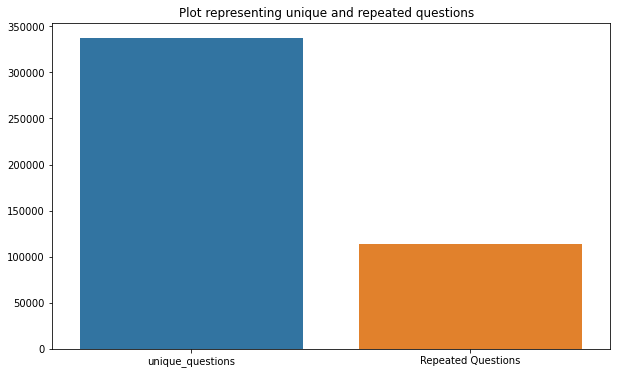

In [ ]:
x = ["unique_questions" , "Repeated Questions"]
y =  [unique_qs , qs_morethan_onetime]

plt.figure(figsize=(10, 6))
plt.title ("Plot representing unique and repeated questions  ")
sns.barplot(x,y)
plt.show()

### 4.2.3 Checking for Duplicates

In [ ]:
#checking whether there are any repeated pair of questions

pair_duplicates = df_downsampled[['qid1','qid2','is_duplicate']].groupby(['qid1','qid2']).count().reset_index()

print ("Number of duplicate questions",(pair_duplicates).shape[0] - df_downsampled.shape[0])

Number of duplicate questions -36062


### 4.2.4 Checking for NULL values

In [ ]:
#Checking whether there are any rows with null values
nan_rows = df_downsampled[df_downsampled.isnull().any(1)]
print (nan_rows)

            id    qid1    qid2                         question1 question2  \
201841  201841  303951  174364  How can I create an Android app?       NaN   

        is_duplicate  
201841             0  


- There are two rows with null values in question2

In [ ]:
# Filling the null values with ' '
Data = df_downsampled.fillna('')
nan_rows = Data[Data.isnull().any(1)]
print (nan_rows)

Empty DataFrame
Columns: [id, qid1, qid2, question1, question2, is_duplicate]
Index: []


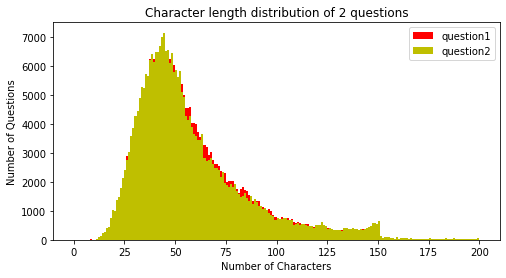

In [ ]:
#plotting the character length distribution for question1 and question2 
from matplotlib import pyplot as plt
plt.figure(figsize = (8,4))
plt.hist(Data["question1"].apply(len), bins = 200, range = [0,200], color = "r")
plt.hist(Data["question2"].apply(len), bins = 200, range = [0,200], color = "y")
plt.title("Character length distribution of 2 questions")
plt.xlabel("Number of Characters")
plt.ylabel("Number of Questions")
plt.legend(["question1", "question2"])

In terms of number of characters, the distributions for both problems are almost the same

In [ ]:
#finding the absolute length difference between question1 and question2
question1_length = Data["question1"].apply(len)
question2_length = Data["question2"].apply(len)
difference_length = np.abs(question1_length-question2_length)

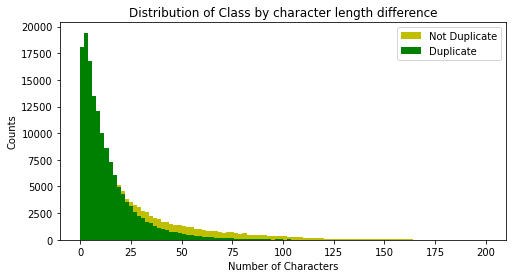

In [ ]:
#plotting the absolute length difference based on the class variable values of 0 and 1
plt.figure(figsize = (8,4))
plt.hist(difference_length[Data["is_duplicate"]==0], bins = 100, color = "y", range = [0,200])
plt.hist(difference_length[Data["is_duplicate"]==1], bins = 100, color = "g", range = [0,200])
plt.title("Distribution of Class by character length difference")
plt.xlabel("Number of Characters")
plt.ylabel("Counts")
plt.legend(["Not Duplicate", "Duplicate"])

For duplicate class the character difference is less

## 5. Text Preprocessing

- Preprocessing:
    - Removing html tags 
    - Removing Punctuations
    - Performing stemming
    - Removing Stopwords
    - Expanding contractions etc.

In [ ]:
import re
import nltk
from nltk.corpus import stopwords

##### what are stop words ?

''''you', 'something', 'anyhow', 'would', 'not', 'first', 'now', 'without', 'which', 'may', 'regarding', '’d', 'back', 'nevertheless', 'how', 'should', 'bottom', 'by', 'twelve', 'least', 'but', '‘d', 'thence', 'i', 'hers', 'are', 'therein', 'same', 'indeed', 'others', 'whither', 'your', '’ll', 'either', 'last', 'therefore', 'do', 'whence', 'we', 'top', 'beforehand', 'though', 'across', 'everyone', 'only', 'full', 'fifteen', 'hereby', 'since', 'while', 're', 'beside', 'quite', 'her', 'is', 'their', 'meanwhile', 'neither', 'various', 'everywhere', "'d", 'made', 'nowhere', 'name', 'of', 'done', 'ever', 'onto', 'off', 'its', 'most', 'twenty', 'next', 'after', 'does', 'whether', 'say', 'please', 'at', 'sometimes', "n't", 'hereafter', 'here', 'until', 'itself', 'latterly', 'well', 'became', 'under', 'behind', 'the', 'me', 'must', 'give', 'former', 'using', 'or', 'otherwise', 'noone', '‘s', 'yours', 'everything', 'wherein', 'even', 'take', 'put', 'ourselves', 'themselves', 'him', 'beyond', 'whose', 'another', 'with', 'every', 'whom', 'somewhere', 'forty', 'via', '’ve', 'get', "'s", '‘re', 'any', 'due', 'really', '’re', 'towards', 'it', 'whereupon', 'none', 'anyway', 'very', 'among', 'before', 'sixty', 'eleven', 'seeming', 'why', 'whereby', 'whenever', 'per', 'ours', 'namely', 'they', "'m", 'along', 'somehow', 'yourself', 'many', 'empty', 'who', 'becoming', 'hence', 'them', 'n’t', 'between', 'a', 'be', 'further', 'against', 'else', 'when', 'has', 'will', 'anyone', 'was', 'several', 'there', 'three', 'formerly', 'one', 'my', 'were', 'side', 'cannot', 'becomes', "'ll", 'make', 'such', 'never', 'amount', 'enough', 'just', 'our', 'those', 'besides', '’s', 'being', 'part', 'except', 'someone', 'often', 'seems', '‘ve', 'latter', "'ve", 'afterwards', 'both', 'during', 'unless', 'together', 'n‘t', 'show', 'keep', 'too', 'each', 'into', 'been', 'an', 'us', 'whereafter', 'to', 'in', 'nor', '‘ll', 'so', "'re", 'down', 'six', 'toward', 'five', 'doing', 'out', 'herein', 'thereupon', 'whole', 'anything', 'can', 'because', 'over', 'however', 'seem', 'serious', 'go', 'am', 'then', 'myself', 'within', 'four', 'his', 'nobody', 'sometime', 'yet', 'front', 'become', 'himself', 'wherever', 'upon', 'nothing', 'few', 'hundred', 'move', '‘m', 'what', 'as', 'below', 'elsewhere', 'mostly', 'anywhere', 'up', 'that', 'amongst', 'this', 'around', 'she', 'always', 'thereafter', 'nine', 'ca', 'already', 'herself', 'some', 'much', 'if', 'two', 'these', 'had', 'ten', 'whatever', 'also', 'through', 'thus', 'yourselves', 'see', 'he', 'throughout', 'for', 'moreover', '’m', 'seemed', 'again', 'might', 'all', 'on', 'almost', 'have', 'less', 'fifty', 'eight', 'could', 'used', 'thereby', 'perhaps', 'above', 'whereas', 'and', 'about', 'although', 'still', 'mine', 'from', 'than', 'rather', 'once', 'third', 'call', 'alone', 'did', 'more', 'thru', 'whoever', 'where', 'hereupon', 'other', 'own', 'no'''

In [ ]:
# To get the results in 4 decemal points
SAFE_DIV = 0.0001 

#text processing
def preprocess(x):
    x = str(x).lower()  # Lowering all text to covert all of them to there base form
    
    # Replacing commonly use words or numbers like 1,000 to 1k and 1,000,000 to 1m and currency symbol to there respective names and many other symbols to there name
    
    x = x.replace(",000,000", "m").replace(",000", "k").replace("′", "'").replace("’", "'")\
                           .replace("won't", "will not").replace("cannot", "can not").replace("can't", "can not")\
                           .replace("n't", " not").replace("what's", "what is").replace("it's", "it is")\
                           .replace("'ve", " have").replace("i'm", "i am").replace("'re", " are")\
                           .replace("he's", "he is").replace("she's", "she is").replace("'s", " is")\
                           .replace("%", " percent ").replace("₹", " rupee ").replace("$", " dollar ")\
                           .replace("€", " euro ").replace("'ll", " will").replace("@","at")
    
    # Renaming 1000 to 1k and 1000000 to 1m (the onces which may not be seperated with commans)
    x = re.sub(r"([0-9]+)000000", r"\1m", x)
    x = re.sub(r"([0-9]+)000", r"\1k", x)
    
    
    #Remove any special character like [= , ' ; "" ']
    
    pattern = re.compile('\W')
    
    if type(x) == type(''):
        x = re.sub(pattern, ' ', x)

    # Removing HTML tags
    x = BeautifulSoup(x)
    x = x.get_text()
    
    # tokenize into words
    x = x.split()
    
    # remove stop words                
    x = [t for t in x if t not in stopwords.words("english")]          
    
    return x

- Function to Compute and get the features : With 2 parameters of Question 1 and Question 2

### 5.1 Pre-processing our Questions data

In [ ]:
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [ ]:
# applying prepocess
Data["question1"] = Data["question1"].apply(preprocess)
Data["question2"] = Data["question2"].apply(preprocess)

In [ ]:
Data.head()

,id,qid1,qid2,question1,question2,is_duplicate
194169,194169,294286,294287,"[like, stacie, jaxxx]","[whether, disproving, null, hypothesis, import...",0
233887,233887,344240,274630,"[front, end, web, developer, india, always, wa...","[front, end, developer, use, linux, instead, w...",0
210098,210098,176829,314554,"[record, whatsapp, call]","[video, calling, whatsapp, started]",0
165182,165182,256546,256547,"[working, human, resources, 9, years, total, 1...","[best, country, pursue, ms, mis, completed, b,...",0
190813,190813,289989,289990,"[friend, keeps, starting, businesses, sell, pr...","[things, keep, mind, starting, product, based,...",0


In [ ]:
def listToString(s):
   
    # initialize an empty string
    str1 = " "
   
    # return string 
    return (str1.join(s))

In [ ]:
Data["question1"] = Data["question1"].apply(listToString)
Data["question2"] = Data["question2"].apply(listToString)

In [ ]:
Data

,id,qid1,qid2,question1,question2,is_duplicate
194169,194169,294286,294287,like stacie jaxxx,whether disproving null hypothesis important q...,0
233887,233887,344240,274630,front end web developer india always wanted wo...,front end developer use linux instead windows ...,0
210098,210098,176829,314554,record whatsapp call,video calling whatsapp started,0
165182,165182,256546,256547,working human resources 9 years total 13 years...,best country pursue ms mis completed b tech al...,0
190813,190813,289989,289990,friend keeps starting businesses sell products...,things keep mind starting product based busine...,0
...,...,...,...,...,...,...
404280,404280,537922,537923,outfit ideas wear frat party,outfit ideas wear frat themed party,1
404281,404281,99131,81495,manaphy childish pokémon ranger temple sea,manaphy annoying pokemon ranger temple sea,1
404282,404282,1931,16773,long distance relationship work,long distance relationships maintained,1
404284,404284,537926,537927,jainism say homosexuality,jainism say gays homosexuality,1


In [ ]:
### Saving the file with these changes as new file

In [ ]:
 Data.to_csv("df_fe_with_preprocessing_train.csv", index=False)

In [ ]:
df =pd.read_csv("df_fe_with_preprocessing_train.csv")
df.head()

,id,qid1,qid2,question1,question2,is_duplicate
0,194169,294286,294287,like stacie jaxxx,whether disproving null hypothesis important q...,0
1,233887,344240,274630,front end web developer india always wanted wo...,front end developer use linux instead windows ...,0
2,210098,176829,314554,record whatsapp call,video calling whatsapp started,0
3,165182,256546,256547,working human resources 9 years total 13 years...,best country pursue ms mis completed b tech al...,0
4,190813,289989,289990,friend keeps starting businesses sell products...,things keep mind starting product based busine...,0


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 298526 entries, 0 to 298525
Data columns (total 6 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   id            298526 non-null  int64 
 1   qid1          298526 non-null  int64 
 2   qid2          298526 non-null  int64 
 3   question1     298494 non-null  object
 4   question2     298479 non-null  object
 5   is_duplicate  298526 non-null  int64 
dtypes: int64(4), object(2)
memory usage: 13.7+ MB


### 4.3 Basic Feature Extraction (before cleaning)

Let us now construct a few features like:
 - ____freq_qid1____ = Frequency of qid1's
 - ____freq_qid2____ = Frequency of qid2's 
 - ____q1len____ = Length of q1
 - ____q2len____ = Length of q2
 - ____q1_n_words____ = Number of words in Question 1
 - ____q2_n_words____ = Number of words in Question 2
 - ____word_Common____ = (Number of common unique words in Question 1 and Question 2)
 - ____word_Total____ =(Total num of words in Question 1 + Total num of words in Question 2)
 - ____word_share____ = (word_common)/(word_Total)
 - ____freq_q1+freq_q2____ = sum total of frequency of qid1 and qid2 
 - ____freq_q1-freq_q2____ = absolute difference of frequency of qid1 and qid2

In [ ]:
## count the number of times each question in question1 and  question2 has repeated
df['freq_qid1'] = df.groupby('qid1')['qid1'].transform('count') 
df['freq_qid2'] = df.groupby('qid2')['qid2'].transform('count')
## Finding the length of question1 and question2

df['q1len'] = df['question1'].str.len()
df['q2len'] = df['question2'].str.len()

## counting the number of words in question1 and question2
df['q1_n_words'] = df['question1'].apply(lambda row: len(str(row).split(" ")))
df['q2_n_words'] = df['question2'].apply(lambda row: len(str(row).split(" ")))

## 
def normalized_word_Common(row):
    w1 = set(map(lambda word: str(word).lower().strip(), str(row['question1']).split(" ")))
    w2 = set(map(lambda word: str(word).lower().strip(), str(row['question2']).split(" ")))    
    return 1.0 * len(w1 & w2)
df['word_Common'] = df.apply(normalized_word_Common, axis=1)

def normalized_word_Total(row):
    w1 = set(map(lambda word: str(word).lower().strip(), str(row['question1']).split(" ")))
    w2 = set(map(lambda word: str(word).lower().strip(), str(row['question2']).split(" ")))    
    return 1.0 * (len(w1) + len(w2))
df['word_Total'] = df.apply(normalized_word_Total, axis=1)

def normalized_word_share(row):
    w1 = set(map(lambda word: str(word).lower().strip(), str(row['question1']).split(" ")))
    w2 = set(map(lambda word: str(word).lower().strip(), str(row['question2']).split(" ")))    
    return 1.0 * len(w1 & w2)/(len(w1) + len(w2))
df['word_share'] = df.apply(normalized_word_share, axis=1)

df['freq_q1+q2'] = df['freq_qid1']+df['freq_qid2']
df['freq_q1-q2'] = abs(df['freq_qid1']-df['freq_qid2'])


df.head()

,id,qid1,qid2,question1,question2,is_duplicate,freq_qid1,freq_qid2,q1len,q2len,q1_n_words,q2_n_words,word_Common,word_Total,word_share,freq_q1+q2,freq_q1-q2
0,194169,294286,294287,like stacie jaxxx,whether disproving null hypothesis important q...,0,1,1,17.0,68.0,3,7,0.0,10.0,0.000000,2,0
1,233887,344240,274630,front end web developer india always wanted wo...,front end developer use linux instead windows ...,0,2,5,87.0,77.0,15,13,3.0,25.0,0.120000,7,3
2,210098,176829,314554,record whatsapp call,video calling whatsapp started,0,1,1,20.0,30.0,3,4,1.0,7.0,0.142857,2,0
3,165182,256546,256547,working human resources 9 years total 13 years...,best country pursue ms mis completed b tech al...,0,1,1,94.0,72.0,15,13,3.0,27.0,0.111111,2,0
4,190813,289989,289990,friend keeps starting businesses sell products...,things keep mind starting product based busine...,0,3,3,92.0,66.0,13,9,3.0,22.0,0.136364,6,0


### 4.3.1 Analysis of some of the extracted features

- Here are some questions have only one single words.

In [ ]:
print ("Minimum length of the questions in question1 : " , min(df['q1_n_words']))

print ("Minimum length of the questions in question2 : " , min(df['q2_n_words']))

print ("Number of Questions with minimum length [question1] :", df[df['q1_n_words']== 1].shape[0])
print ("Number of Questions with minimum length [question2] :", df[df['q2_n_words']== 1].shape[0])

Minimum length of the questions in question1 :  1
Minimum length of the questions in question2 :  1
Number of Questions with minimum length [question1] : 2679
Number of Questions with minimum length [question2] : 3127


#### 4.3.1.1 Feature: word_share

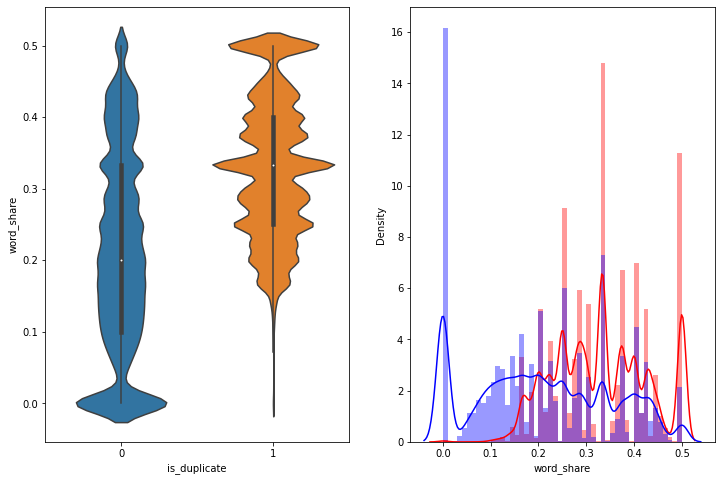

In [ ]:
plt.figure(figsize=(12, 8))

plt.subplot(1,2,1)
sns.violinplot(x = 'is_duplicate', y = 'word_share', data = df[0:])

plt.subplot(1,2,2)
sns.distplot(df[df['is_duplicate'] == 1.0]['word_share'][0:] , label = "1", color = 'red')
sns.distplot(df[df['is_duplicate'] == 0.0]['word_share'][0:] , label = "0" , color = 'blue' )
plt.show()

#### 4.3.1.2 Feature: word_Common

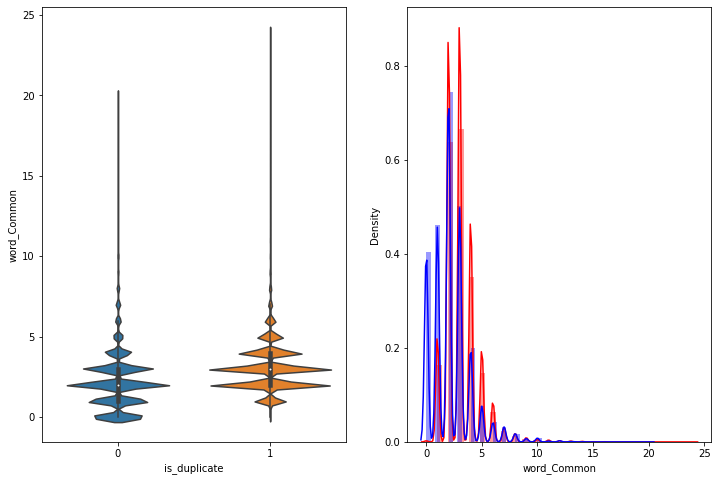

In [ ]:
plt.figure(figsize=(12, 8))

plt.subplot(1,2,1)
sns.violinplot(x = 'is_duplicate', y = 'word_Common', data = df[0:])

plt.subplot(1,2,2)
sns.distplot(df[df['is_duplicate'] == 1.0]['word_Common'][0:] , label = "1", color = 'red')
sns.distplot(df[df['is_duplicate'] == 0.0]['word_Common'][0:] , label = "0" , color = 'blue' )
plt.show()

The distributions of the word_Common feature in similar and non-similar questions are highly overlapping

### Applying the tokenization, Stemming and lemmitization on cleaned question1 and question2 after removing the stop words and cleaning the data

In [ ]:
import re
import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem.porter import PorterStemmer
from nltk.stem import WordNetLemmatizer
## initialise the inbuilt Stemmer
stemmer = PorterStemmer()
# # We can also use Lemmatizer instead of Stemmer
lemmatizer = WordNetLemmatizer()
import nltk
nltk.download('wordnet')
import nltk
nltk.download('omw-1.4')
import nltk
nltk.download('averaged_perceptron_tagger')


[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.


True

In [ ]:
### applying all three
token_words = []
clean_text_stem = []
len_stem = []
clean_text_lemm = []
len_lemm = []
pos_tag = []

def text_preprocess(row):
    #tokenization of the questions
    token = str(row).split()
    token_words.append(token)
    # stemming the questions
    stem = [stemmer.stem(word) for word in token]
    clean_text_stem.append(" ".join(stem))
    len_stem.append(len(stem))
    # lemmitization
    lemm = [lemmatizer.lemmatize(word) for word in token]
    clean_text_lemm.append(' '.join(lemm))
    len_lemm.append(len(lemm))
    # applying parts of speech 
    pos = [nltk.pos_tag([word]) for word in lemm]
    pos_tag.append(pos)

In [ ]:
df['question1'].apply(lambda x: text_preprocess(x))

0         None
1         None
2         None
3         None
4         None
          ... 
298521    None
298522    None
298523    None
298524    None
298525    None
Name: question1, Length: 298526, dtype: object

In [ ]:
df['ques1_token'] = token_words

In [ ]:
df['ques1_stem'] = clean_text_stem

In [ ]:
df['ques1_stem_len'] = len_stem

In [ ]:
df['ques1_lemm'] = clean_text_lemm

In [ ]:
df['ques1_lemm_len'] = len_lemm

In [ ]:
df['ques1_pos'] = pos_tag

In [ ]:
df

,id,qid1,qid2,question1,question2,is_duplicate,freq_qid1,freq_qid2,q1len,q2len,...,word_Total,word_share,freq_q1+q2,freq_q1-q2,ques1_token,ques1_stem,ques1_stem_len,ques1_lemm,ques1_lemm_len,ques1_pos
0,194169,294286,294287,like stacie jaxxx,whether disproving null hypothesis important q...,0,1,1,17.0,68.0,...,10.0,0.000000,2,0,"[like, stacie, jaxxx]",like staci jaxxx,3,like stacie jaxxx,3,"[[(like, IN)], [(stacie, NN)], [(jaxxx, NN)]]"
1,233887,344240,274630,front end web developer india always wanted wo...,front end developer use linux instead windows ...,0,2,5,87.0,77.0,...,25.0,0.120000,7,3,"[front, end, web, developer, india, always, wa...",front end web develop india alway want work us...,15,front end web developer india always wanted wo...,15,"[[(front, NN)], [(end, NN)], [(web, NN)], [(de..."
2,210098,176829,314554,record whatsapp call,video calling whatsapp started,0,1,1,20.0,30.0,...,7.0,0.142857,2,0,"[record, whatsapp, call]",record whatsapp call,3,record whatsapp call,3,"[[(record, NN)], [(whatsapp, NN)], [(call, NN)]]"
3,165182,256546,256547,working human resources 9 years total 13 years...,best country pursue ms mis completed b tech al...,0,1,1,94.0,72.0,...,27.0,0.111111,2,0,"[working, human, resources, 9, years, total, 1...",work human resourc 9 year total 13 year valid ...,15,working human resource 9 year total 13 year va...,15,"[[(working, VBG)], [(human, NN)], [(resource, ..."
4,190813,289989,289990,friend keeps starting businesses sell products...,things keep mind starting product based busine...,0,3,3,92.0,66.0,...,22.0,0.136364,6,0,"[friend, keeps, starting, businesses, sell, pr...",friend keep start busi sell product seem get o...,13,friend keep starting business sell product see...,13,"[[(friend, NN)], [(keep, VB)], [(starting, VBG..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
298521,404280,537922,537923,outfit ideas wear frat party,outfit ideas wear frat themed party,1,1,1,28.0,35.0,...,11.0,0.454545,2,0,"[outfit, ideas, wear, frat, party]",outfit idea wear frat parti,5,outfit idea wear frat party,5,"[[(outfit, NN)], [(idea, NN)], [(wear, NN)], [..."
298522,404281,99131,81495,manaphy childish pokémon ranger temple sea,manaphy annoying pokemon ranger temple sea,1,5,3,42.0,42.0,...,12.0,0.333333,8,2,"[manaphy, childish, pokémon, ranger, temple, sea]",manaphi childish pokémon ranger templ sea,6,manaphy childish pokémon ranger temple sea,6,"[[(manaphy, NN)], [(childish, NN)], [(pokémon,..."
298523,404282,1931,16773,long distance relationship work,long distance relationships maintained,1,26,14,31.0,38.0,...,8.0,0.250000,40,12,"[long, distance, relationship, work]",long distanc relationship work,4,long distance relationship work,4,"[[(long, RB)], [(distance, NN)], [(relationshi..."
298524,404284,537926,537927,jainism say homosexuality,jainism say gays homosexuality,1,1,1,25.0,30.0,...,7.0,0.428571,2,0,"[jainism, say, homosexuality]",jainism say homosexu,3,jainism say homosexuality,3,"[[(jainism, NN)], [(say, VB)], [(homosexuality..."


In [ ]:
## let us clear the content of list
token_words.clear()
clean_text_stem.clear()
len_stem.clear()
clean_text_lemm.clear()
len_lemm.clear()
pos_tag.clear()

In [ ]:
df.head(2)

,id,qid1,qid2,question1,question2,is_duplicate,freq_qid1,freq_qid2,q1len,q2len,...,word_Total,word_share,freq_q1+q2,freq_q1-q2,ques1_token,ques1_stem,ques1_stem_len,ques1_lemm,ques1_lemm_len,ques1_pos
0,194169,294286,294287,like stacie jaxxx,whether disproving null hypothesis important q...,0,1,1,17.0,68.0,...,10.0,0.00,2,0,"[like, stacie, jaxxx]",like staci jaxxx,3,like stacie jaxxx,3,"[[(like, IN)], [(stacie, NN)], [(jaxxx, NN)]]"
1,233887,344240,274630,front end web developer india always wanted wo...,front end developer use linux instead windows ...,0,2,5,87.0,77.0,...,25.0,0.12,7,3,"[front, end, web, developer, india, always, wa...",front end web develop india alway want work us...,15,front end web developer india always wanted wo...,15,"[[(front, NN)], [(end, NN)], [(web, NN)], [(de..."


In [ ]:
df['question2'].apply(lambda x: text_preprocess(x))

0         None
1         None
2         None
3         None
4         None
          ... 
298521    None
298522    None
298523    None
298524    None
298525    None
Name: question2, Length: 298526, dtype: object

In [ ]:
df['ques2_token'] = token_words

In [ ]:
df['ques2_stem'] = clean_text_stem

In [ ]:
df['ques2_stem_len'] = len_stem

In [ ]:
df['ques2_lemm'] = clean_text_lemm

In [ ]:
df['ques2_lemm_len'] = len_lemm

In [ ]:
df['ques2_pos'] = pos_tag

In [ ]:
df

,id,qid1,qid2,question1,question2,is_duplicate,freq_qid1,freq_qid2,q1len,q2len,...,ques1_stem_len,ques1_lemm,ques1_lemm_len,ques1_pos,ques2_token,ques2_stem,ques2_stem_len,ques2_lemm,ques2_lemm_len,ques2_pos
0,194169,294286,294287,like stacie jaxxx,whether disproving null hypothesis important q...,0,1,1,17.0,68.0,...,3,like stacie jaxxx,3,"[[(like, IN)], [(stacie, NN)], [(jaxxx, NN)]]","[whether, disproving, null, hypothesis, import...",whether disprov null hypothesi import qualit r...,7,whether disproving null hypothesis important q...,7,"[[(whether, IN)], [(disproving, VBG)], [(null,..."
1,233887,344240,274630,front end web developer india always wanted wo...,front end developer use linux instead windows ...,0,2,5,87.0,77.0,...,15,front end web developer india always wanted wo...,15,"[[(front, NN)], [(end, NN)], [(web, NN)], [(de...","[front, end, developer, use, linux, instead, w...",front end develop use linux instead window 10 ...,13,front end developer use linux instead window 1...,13,"[[(front, NN)], [(end, NN)], [(developer, NN)]..."
2,210098,176829,314554,record whatsapp call,video calling whatsapp started,0,1,1,20.0,30.0,...,3,record whatsapp call,3,"[[(record, NN)], [(whatsapp, NN)], [(call, NN)]]","[video, calling, whatsapp, started]",video call whatsapp start,4,video calling whatsapp started,4,"[[(video, NN)], [(calling, VBG)], [(whatsapp, ..."
3,165182,256546,256547,working human resources 9 years total 13 years...,best country pursue ms mis completed b tech al...,0,1,1,94.0,72.0,...,15,working human resource 9 year total 13 year va...,15,"[[(working, VBG)], [(human, NN)], [(resource, ...","[best, country, pursue, ms, mis, completed, b,...",best countri pursu ms mi complet b tech also w...,13,best country pursue m mi completed b tech also...,13,"[[(best, JJS)], [(country, NN)], [(pursue, NN)..."
4,190813,289989,289990,friend keeps starting businesses sell products...,things keep mind starting product based busine...,0,3,3,92.0,66.0,...,13,friend keep starting business sell product see...,13,"[[(friend, NN)], [(keep, VB)], [(starting, VBG...","[things, keep, mind, starting, product, based,...",thing keep mind start product base busi succes...,9,thing keep mind starting product based busines...,9,"[[(thing, NN)], [(keep, VB)], [(mind, NN)], [(..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
298521,404280,537922,537923,outfit ideas wear frat party,outfit ideas wear frat themed party,1,1,1,28.0,35.0,...,5,outfit idea wear frat party,5,"[[(outfit, NN)], [(idea, NN)], [(wear, NN)], [...","[outfit, ideas, wear, frat, themed, party]",outfit idea wear frat theme parti,6,outfit idea wear frat themed party,6,"[[(outfit, NN)], [(idea, NN)], [(wear, NN)], [..."
298522,404281,99131,81495,manaphy childish pokémon ranger temple sea,manaphy annoying pokemon ranger temple sea,1,5,3,42.0,42.0,...,6,manaphy childish pokémon ranger temple sea,6,"[[(manaphy, NN)], [(childish, NN)], [(pokémon,...","[manaphy, annoying, pokemon, ranger, temple, sea]",manaphi annoy pokemon ranger templ sea,6,manaphy annoying pokemon ranger temple sea,6,"[[(manaphy, NN)], [(annoying, VBG)], [(pokemon..."
298523,404282,1931,16773,long distance relationship work,long distance relationships maintained,1,26,14,31.0,38.0,...,4,long distance relationship work,4,"[[(long, RB)], [(distance, NN)], [(relationshi...","[long, distance, relationships, maintained]",long distanc relationship maintain,4,long distance relationship maintained,4,"[[(long, RB)], [(distance, NN)], [(relationshi..."
298524,404284,537926,537927,jainism say homosexuality,jainism say gays homosexuality,1,1,1,25.0,30.0,...,3,jainism say homosexuality,3,"[[(jainism, NN)], [(say, VB)], [(homosexuality...","[jainism, say, gays, homosexuality]",jainism say gay homosexu,4,jainism say gay homosexuality,4,"[[(jainism, NN)], [(say, VB)], [(gay, NN)], [(..."


In [ ]:
df.shape

(298526, 29)

#Advance Feature Extraction

**1. Token Features**

**cwc_min:** This is the ratio of the number of common words to the length of the smaller question

**cwc_max:** This is the ratio of the number of common words to the length of the larger question

**csc_min:** This is the ratio of the number of common stop words to the smaller stop word count among the two questions

**csc_max:** This is the ratio of the number of common stop words to the larger stop word count among the two questions

**ctc_min:** This is the ratio of the number of common tokens to the smaller token count among the two questions

**ctc_max:** This is the ratio of the number of common tokens to the larger token count among the two questions

**last_word_eq:** 1 if the last word in the two questions is same, 0 otherwise

**first_word_eq:** 1 if the first word in the two questions is same, 0 otherwise

**2. Fuzzy Features**

**fuzz_ratio:** fuzz_ratio score from fuzzywuzzy

**fuzz_partial_ratio:** fuzz_partial_ratio from fuzzywuzzy

**token_sort_ratio:** token_sort_ratio from fuzzywuzzy

**token_set_ratio:** token_set_ratio from fuzzywuzzy

In [ ]:
# Advanced Features
from nltk.corpus import stopwords

def fetch_token_features(row):
    
    q1 = row['question1']
    q2 = row['question2']  
    
    SAFE_DIV = 0.0001 

    STOP_WORDS = stopwords.words("english")
    
    token_features = [0.0]*8
    
    # Converting the Sentence into Tokens: 
    q1_tokens = q1.split()
    q2_tokens = q2.split()
    
    if len(q1_tokens) == 0 or len(q2_tokens) == 0:
        return token_features

    # Get the non-stopwords in Questions
    q1_words = set([word for word in q1_tokens if word not in STOP_WORDS])
    q2_words = set([word for word in q2_tokens if word not in STOP_WORDS])
    
    #Get the stopwords in Questions
    q1_stops = set([word for word in q1_tokens if word in STOP_WORDS])
    q2_stops = set([word for word in q2_tokens if word in STOP_WORDS])
    
    # Get the common non-stopwords from Question pair
    common_word_count = len(q1_words.intersection(q2_words))
    
    # Get the common stopwords from Question pair
    common_stop_count = len(q1_stops.intersection(q2_stops))
    
    # Get the common Tokens from Question pair
    common_token_count = len(set(q1_tokens).intersection(set(q2_tokens)))
    
    
    token_features[0] = common_word_count / (min(len(q1_words), len(q2_words)) + SAFE_DIV)
    token_features[1] = common_word_count / (max(len(q1_words), len(q2_words)) + SAFE_DIV)
    token_features[2] = common_stop_count / (min(len(q1_stops), len(q2_stops)) + SAFE_DIV)
    token_features[3] = common_stop_count / (max(len(q1_stops), len(q2_stops)) + SAFE_DIV)
    token_features[4] = common_token_count / (min(len(q1_tokens), len(q2_tokens)) + SAFE_DIV)
    token_features[5] = common_token_count / (max(len(q1_tokens), len(q2_tokens)) + SAFE_DIV)
    
    # Last word of both question is same or not
    token_features[6] = int(q1_tokens[-1] == q2_tokens[-1])
    
    # First word of both question is same or not
    token_features[7] = int(q1_tokens[0] == q2_tokens[0])
    
    return token_features

In [ ]:
df["question1"] = df["question1"].astype(str)
df["question2"] = df["question2"].astype(str)
token_features = df.apply(fetch_token_features, axis=1)

df["cwc_min"]       = list(map(lambda x: x[0], token_features))

df["cwc_max"]       = list(map(lambda x: x[1], token_features))

df["csc_min"]       = list(map(lambda x: x[2], token_features))

df["csc_max"]       = list(map(lambda x: x[3], token_features))

df["ctc_min"]       = list(map(lambda x: x[4], token_features))

df["ctc_max"]       = list(map(lambda x: x[5], token_features))

df["last_word_eq"]  = list(map(lambda x: x[6], token_features))

df["first_word_eq"] = list(map(lambda x: x[7], token_features))

In [ ]:
df

,id,qid1,qid2,question1,question2,is_duplicate,freq_qid1,freq_qid2,q1len,q2len,...,ques2_lemm_len,ques2_pos,cwc_min,cwc_max,csc_min,csc_max,ctc_min,ctc_max,last_word_eq,first_word_eq
0,194169,294286,294287,like stacie jaxxx,whether disproving null hypothesis important q...,0,1,1,17.0,68.0,...,7,"[[(whether, IN)], [(disproving, VBG)], [(null,...",0.000000,0.000000,0.0,0.0,0.000000,0.000000,0,0
1,233887,344240,274630,front end web developer india always wanted wo...,front end developer use linux instead windows ...,0,2,5,87.0,77.0,...,13,"[[(front, NN)], [(end, NN)], [(developer, NN)]...",0.249998,0.230767,0.0,0.0,0.230767,0.199999,0,1
2,210098,176829,314554,record whatsapp call,video calling whatsapp started,0,1,1,20.0,30.0,...,4,"[[(video, NN)], [(calling, VBG)], [(whatsapp, ...",0.333322,0.249994,0.0,0.0,0.333322,0.249994,0,0
3,165182,256546,256547,working human resources 9 years total 13 years...,best country pursue ms mis completed b tech al...,0,1,1,94.0,72.0,...,13,"[[(best, JJS)], [(country, NN)], [(pursue, NN)...",0.230767,0.214284,0.0,0.0,0.230767,0.199999,0,0
4,190813,289989,289990,friend keeps starting businesses sell products...,things keep mind starting product based busine...,0,3,3,92.0,66.0,...,9,"[[(thing, NN)], [(keep, VB)], [(mind, NN)], [(...",0.333330,0.230767,0.0,0.0,0.333330,0.230767,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
298521,404280,537922,537923,outfit ideas wear frat party,outfit ideas wear frat themed party,1,1,1,28.0,35.0,...,6,"[[(outfit, NN)], [(idea, NN)], [(wear, NN)], [...",0.999980,0.833319,0.0,0.0,0.999980,0.833319,1,1
298522,404281,99131,81495,manaphy childish pokémon ranger temple sea,manaphy annoying pokemon ranger temple sea,1,5,3,42.0,42.0,...,6,"[[(manaphy, NN)], [(annoying, VBG)], [(pokemon...",0.666656,0.666656,0.0,0.0,0.666656,0.666656,1,1
298523,404282,1931,16773,long distance relationship work,long distance relationships maintained,1,26,14,31.0,38.0,...,4,"[[(long, RB)], [(distance, NN)], [(relationshi...",0.499988,0.499988,0.0,0.0,0.499988,0.499988,0,1
298524,404284,537926,537927,jainism say homosexuality,jainism say gays homosexuality,1,1,1,25.0,30.0,...,4,"[[(jainism, NN)], [(say, VB)], [(gay, NN)], [(...",0.999967,0.749981,0.0,0.0,0.999967,0.749981,1,1


In [ ]:
!pip install fuzzywuzzy

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
# Fuzzy Features
from fuzzywuzzy import fuzz

def fetch_fuzzy_features(row):
    
    q1 = row['question1']
    q2 = row['question2']
    
    fuzzy_features = [0.0]*4
    
    # fuzz_ratio
    fuzzy_features[0] = fuzz.QRatio(q1, q2)

    # fuzz_partial_ratio
    fuzzy_features[1] = fuzz.partial_ratio(q1, q2)

    # token_sort_ratio
    fuzzy_features[2] = fuzz.token_sort_ratio(q1, q2)

    # token_set_ratio
    fuzzy_features[3] = fuzz.token_set_ratio(q1, q2)

    return fuzzy_features

In [ ]:
fuzzy_features = df.apply(fetch_fuzzy_features, axis=1)

# Creating new feature columns for fuzzy features
df['fuzz_ratio'] = list(map(lambda x: x[0], fuzzy_features))

df['fuzz_partial_ratio'] = list(map(lambda x: x[1], fuzzy_features))

df['token_sort_ratio'] = list(map(lambda x: x[2], fuzzy_features))

df['token_set_ratio'] = list(map(lambda x: x[3], fuzzy_features))

In [ ]:
print(df.shape)
df.head()

(298526, 41)


,id,qid1,qid2,question1,question2,is_duplicate,freq_qid1,freq_qid2,q1len,q2len,...,csc_min,csc_max,ctc_min,ctc_max,last_word_eq,first_word_eq,fuzz_ratio,fuzz_partial_ratio,token_sort_ratio,token_set_ratio
0,194169,294286,294287,like stacie jaxxx,whether disproving null hypothesis important q...,0,1,1,17.0,68.0,...,0.0,0.0,0.000000,0.000000,0,0,19,42,21,21
1,233887,344240,274630,front end web developer india always wanted wo...,front end developer use linux instead windows ...,0,2,5,87.0,77.0,...,0.0,0.0,0.230767,0.199999,0,1,33,46,43,54
2,210098,176829,314554,record whatsapp call,video calling whatsapp started,0,1,1,20.0,30.0,...,0.0,0.0,0.333322,0.249994,0,0,52,55,68,68
3,165182,256546,256547,working human resources 9 years total 13 years...,best country pursue ms mis completed b tech al...,0,1,1,94.0,72.0,...,0.0,0.0,0.230767,0.199999,0,0,20,33,42,44
4,190813,289989,289990,friend keeps starting businesses sell products...,things keep mind starting product based busine...,0,3,3,92.0,66.0,...,0.0,0.0,0.333330,0.230767,0,0,47,50,58,66


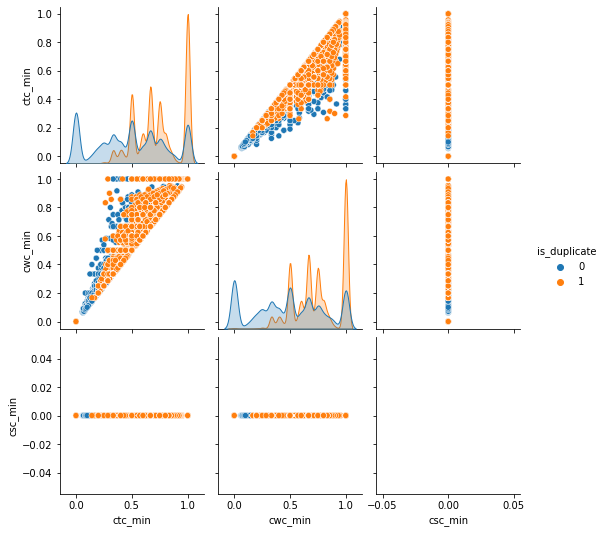

In [ ]:
sns.pairplot(df[['ctc_min', 'cwc_min', 'csc_min', 'is_duplicate']],hue='is_duplicate')

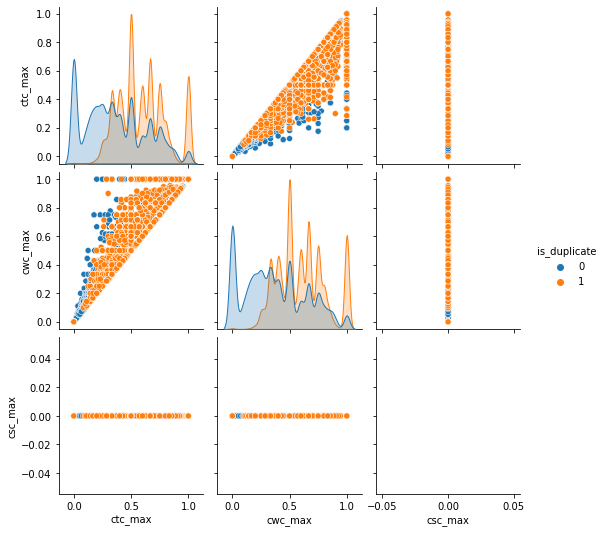

In [ ]:
sns.pairplot(df[['ctc_max', 'cwc_max', 'csc_max', 'is_duplicate']],hue='is_duplicate')

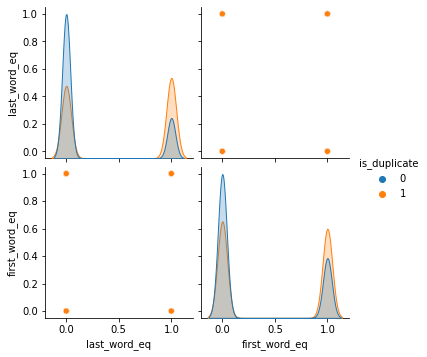

In [ ]:
sns.pairplot(df[['last_word_eq', 'first_word_eq', 'is_duplicate']],hue='is_duplicate')

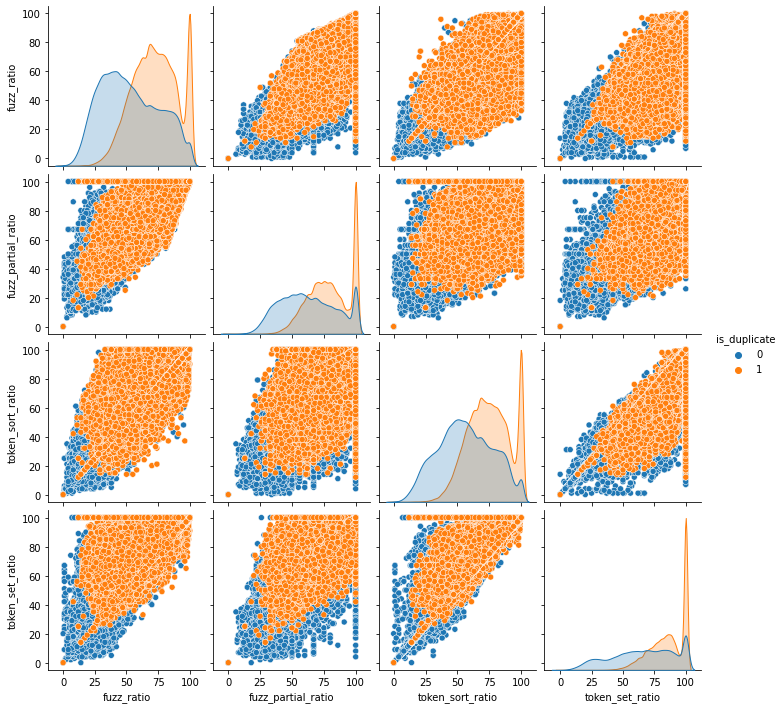

In [ ]:
sns.pairplot(df[['fuzz_ratio', 'fuzz_partial_ratio','token_sort_ratio','token_set_ratio', 'is_duplicate']],hue='is_duplicate')

In [ ]:
### Saving the file with these changes as new file
df.to_csv("df_feature_extraction.csv", index=False)

In [ ]:
df =pd.read_csv("df_feature_extraction.csv")
df

,id,qid1,qid2,question1,question2,is_duplicate,freq_qid1,freq_qid2,q1len,q2len,...,csc_min,csc_max,ctc_min,ctc_max,last_word_eq,first_word_eq,fuzz_ratio,fuzz_partial_ratio,token_sort_ratio,token_set_ratio
0,194169,294286,294287,like stacie jaxxx,whether disproving null hypothesis important q...,0,1,1,17.0,68.0,...,0.0,0.0,0.000000,0.000000,0.0,0.0,19.0,42.0,21.0,21.0
1,233887,344240,274630,front end web developer india always wanted wo...,front end developer use linux instead windows ...,0,2,5,87.0,77.0,...,0.0,0.0,0.230767,0.199999,0.0,1.0,33.0,46.0,43.0,54.0
2,210098,176829,314554,record whatsapp call,video calling whatsapp started,0,1,1,20.0,30.0,...,0.0,0.0,0.333322,0.249994,0.0,0.0,52.0,55.0,68.0,68.0
3,165182,256546,256547,working human resources 9 years total 13 years...,best country pursue ms mis completed b tech al...,0,1,1,94.0,72.0,...,0.0,0.0,0.230767,0.199999,0.0,0.0,20.0,33.0,42.0,44.0
4,190813,289989,289990,friend keeps starting businesses sell products...,things keep mind starting product based busine...,0,3,3,92.0,66.0,...,0.0,0.0,0.333330,0.230767,0.0,0.0,47.0,50.0,58.0,66.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21750,86403,145737,145738,find iphone,find iphone help find iphone,0,2,2,11.0,28.0,...,0.0,0.0,0.999950,0.399992,1.0,1.0,56.0,100.0,56.0,100.0
21751,301814,424775,424776,longterm effects sleep deprivation caused amph...,minimum amount alcohol needed consumed one not...,0,2,2,71.0,74.0,...,0.0,0.0,0.222220,0.199998,0.0,0.0,36.0,46.0,47.0,54.0
21752,88139,65646,9791,white people nationalistic cultures,people giving trump chance,0,7,4,35.0,26.0,...,0.0,0.0,0.249994,0.249994,0.0,0.0,39.0,46.0,43.0,38.0
21753,276616,395599,395600,could make cat gassy,causes pale yellow discharge coming vigina,0,3,3,20.0,42.0,...,0.0,0.0,0.000000,0.000000,0.0,0.0,26.0,30.0,35.0,35.0


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21755 entries, 0 to 21754
Data columns (total 41 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   id                  21755 non-null  int64  
 1   qid1                21755 non-null  int64  
 2   qid2                21755 non-null  int64  
 3   question1           21753 non-null  object 
 4   question2           21751 non-null  object 
 5   is_duplicate        21755 non-null  int64  
 6   freq_qid1           21755 non-null  int64  
 7   freq_qid2           21755 non-null  int64  
 8   q1len               21753 non-null  float64
 9   q2len               21751 non-null  float64
 10  q1_n_words          21755 non-null  int64  
 11  q2_n_words          21755 non-null  int64  
 12  word_Common         21755 non-null  float64
 13  word_Total          21755 non-null  float64
 14  word_share          21755 non-null  float64
 15  freq_q1+q2          21755 non-null  int64  
 16  freq

##**Creating the word cloud**
1. Install the word cloud package using `!pip install wordcloud`
2. Import wordcloud from wordcloud
3. To be able to draw the wordcloud, we have to input the string to the wordcloud function.

Word cloud is a visualization tool to get insights into what words are repeatedly used with their frequency. The size of the word in a wordcloud is proportional to its occurance.

In [ ]:
df.isnull().sum()

id                     0
qid1                   0
qid2                   0
question1             32
question2             47
is_duplicate           0
freq_qid1              0
freq_qid2              0
q1len                 32
q2len                 47
q1_n_words             0
q2_n_words             0
word_Common            0
word_Total             0
word_share             0
freq_q1+q2             0
freq_q1-q2             0
ques1_token            0
ques1_stem            32
ques1_stem_len         0
ques1_lemm            32
ques1_lemm_len         0
ques1_pos              0
ques2_token            0
ques2_stem            47
ques2_stem_len         0
ques2_lemm            47
ques2_lemm_len         0
ques2_pos              0
cwc_min                0
cwc_max                0
csc_min                0
csc_max                0
ctc_min                0
ctc_max                0
last_word_eq           0
first_word_eq          0
fuzz_ratio             0
fuzz_partial_ratio     0
token_sort_ratio       0


In [ ]:
df = df.dropna()
df

,id,qid1,qid2,question1,question2,is_duplicate,freq_qid1,freq_qid2,q1len,q2len,...,csc_min,csc_max,ctc_min,ctc_max,last_word_eq,first_word_eq,fuzz_ratio,fuzz_partial_ratio,token_sort_ratio,token_set_ratio
0,194169,294286,294287,like stacie jaxxx,whether disproving null hypothesis important q...,0,1,1,17.0,68.0,...,0.0,0.0,0.000000,0.000000,0,0,19,42,21,21
1,233887,344240,274630,front end web developer india always wanted wo...,front end developer use linux instead windows ...,0,2,5,87.0,77.0,...,0.0,0.0,0.230767,0.199999,0,1,33,46,43,54
2,210098,176829,314554,record whatsapp call,video calling whatsapp started,0,1,1,20.0,30.0,...,0.0,0.0,0.333322,0.249994,0,0,52,55,68,68
3,165182,256546,256547,working human resources 9 years total 13 years...,best country pursue ms mis completed b tech al...,0,1,1,94.0,72.0,...,0.0,0.0,0.230767,0.199999,0,0,20,33,42,44
4,190813,289989,289990,friend keeps starting businesses sell products...,things keep mind starting product based busine...,0,3,3,92.0,66.0,...,0.0,0.0,0.333330,0.230767,0,0,47,50,58,66
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
298521,404280,537922,537923,outfit ideas wear frat party,outfit ideas wear frat themed party,1,1,1,28.0,35.0,...,0.0,0.0,0.999980,0.833319,1,1,89,86,89,100
298522,404281,99131,81495,manaphy childish pokémon ranger temple sea,manaphy annoying pokemon ranger temple sea,1,5,3,42.0,42.0,...,0.0,0.0,0.666656,0.666656,1,1,82,81,82,82
298523,404282,1931,16773,long distance relationship work,long distance relationships maintained,1,26,14,31.0,38.0,...,0.0,0.0,0.499988,0.499988,0,1,78,87,75,75
298524,404284,537926,537927,jainism say homosexuality,jainism say gays homosexuality,1,1,1,25.0,30.0,...,0.0,0.0,0.999967,0.749981,1,1,91,80,91,100


In [ ]:
# data frame with duplicate questions2
dup_df = df.loc[df['is_duplicate'] == 1]
# let us conver the ques1_lemm column into a single list to create the word cloud
dup_df_lis = dup_df['ques1_lemm'].tolist()
# to be able to draw the word cloud for the duplicate question 1 we have to pass the string as input for wordcloud function
dup_df_lis = (' '.join(dup_df_lis))

In [ ]:
dup_df_lis

'astrology capricorn sun cap moon cap rising say good geologist read find youtube comment make physic easy learn first sexual experience like would trump presidency mean current international master student f1 visa manipulation mean many quora user posting question readily answered google rocket look white prepare ca final law special care someone nose get stuffy night game throne villain would likely give mercy prepare upsc example product make crude oil make friend career launcher good rbi grade b preparation blu ray play regular dvd player best memorable thing ever eaten suddenly logged gmail remember gmail password realized recovery email longer alive new harry potter book harry potter cursed child java programming learn java programming language best book ever made ever store energy produced lightning narcissistic personality disorder speak english fluently helpful quickbooks auto data recovery support phone number recover corrupted data file richest gambler time reach level purpo

In [ ]:
#Creating the WordCloud for duplicate question in quesiton1
!pip install wordcloud

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from wordcloud import WordCloud

In [ ]:
duplicate_wordcloud = WordCloud(stopwords=stopwords.words("english"),
                      background_color='black',
                      width=1600,
                      height=800
                     ).generate(dup_df_lis)

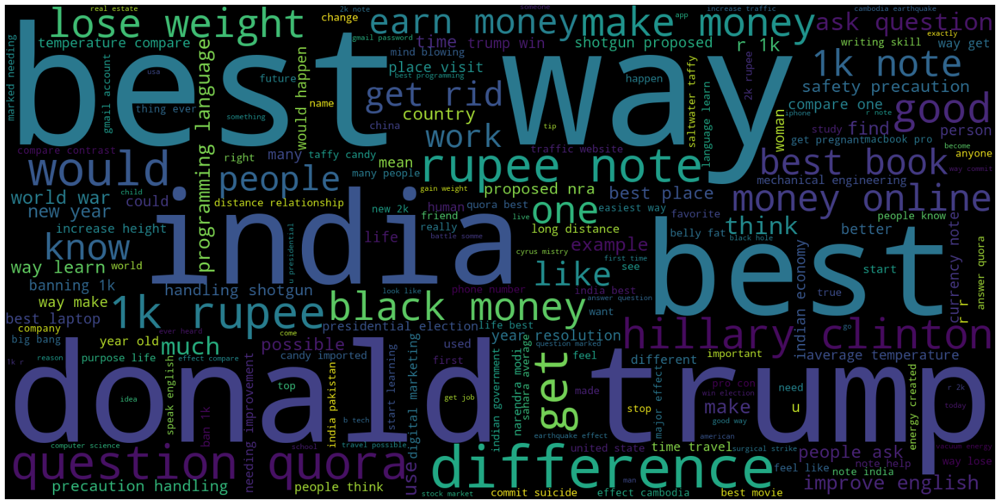

In [ ]:
# plot the WordCloud image                      
import matplotlib.pyplot as plt
plt.figure(figsize = (20, 20), facecolor = None)
plt.imshow(duplicate_wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
 
plt.show()

In [ ]:
# data frame with not duplicate questions2
not_dup_df = df.loc[df['is_duplicate'] == 0]
# let us conver the ques1_lemm column into a single list to create the word cloud
not_dup_df_lis = not_dup_df['ques1_lemm'].tolist()
# to be able to draw the word cloud for the not duplicate question 1 we have to pass the string as input for wordcloud function
not_dup_df_lis = (' '.join(not_dup_df_lis))

In [ ]:
not_dup_df_lis

'like stacie jaxxx front end web developer india always wanted work u front end developer great coder go record whatsapp call working human resource 9 year total 13 year valid education best way migrate country urgent friend keep starting business sell product seem get one going create successful business temperature airliner cargo hold add family member la fitness membership quebec bilingual province canada someone list mcq book per subject pg medical entrance best asian snack buy amazon yadong mean korean review itm navi mumbai good title romantic story longest roller coaster united kingdom compare longest roller coaster denmark classy rich trashy poor salary novozymes india offer sale account manager 5 7 year experience bangalore get level hide instagram follower exercise raise lower blood pressure various form write b c whole cube special dish food home country family incorporated traditional american thanksgiving meal safest website watch free movie reset gmail password remember r

In [ ]:
not_duplicate_wordcloud = WordCloud(stopwords=stopwords.words("english"),
                      background_color='black',
                      width=1600,
                      height=800
                     ).generate(not_dup_df_lis)

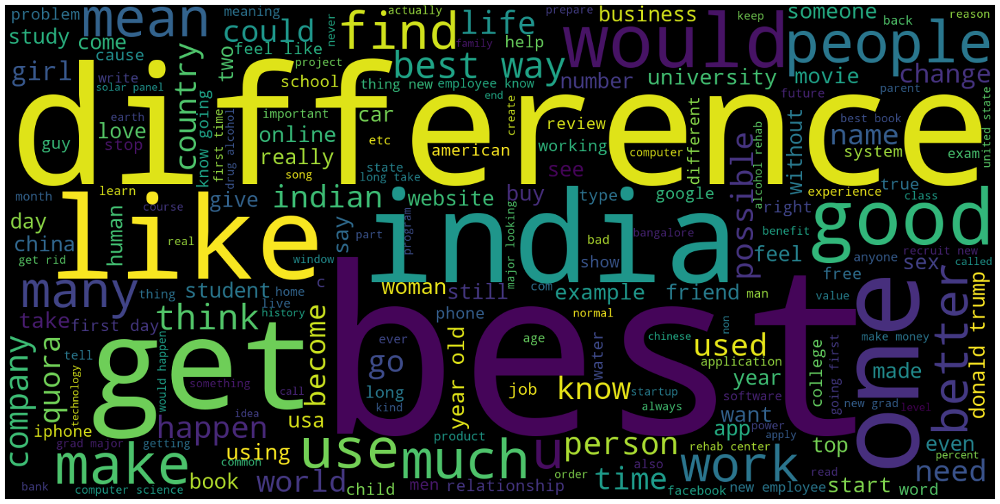

In [ ]:
# plot the WordCloud image                      
import matplotlib.pyplot as plt
plt.figure(figsize = (20, 20), facecolor = None)
plt.imshow(not_duplicate_wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
 
plt.show()

#Text to Numerical Vector Conversion

##**1. Bag of Words Approach**

We call vectorization the general process of turning a collection of text documents into numerical feature vectors. This specific strategy (tokenization, counting and normalization) is called the Bag of Words or "Bag of n-grams" representation. Documents are described by word occurrences while completely ignoring the relative position information of the words in the document.

We will use `CountVectorizer` to **convert text into a matrix of token count.**

**We are going to perform below mentioned steps to understand the entire process:**

a. Converting text to numerical vectors with the help of `CountVectorizer`

b. Understand `fit` and `transform`

c. Looking at `vocabulary_`

d. Converting sparse matrix to dense matrix using `toarray()`

e. Understanding `n_gram`

##**Advantages**
1. It is simple to understand and implement like OneHotEncoding.
2. We have a fixed length encoding for any sequence of arbitrary length.
3. Documents with same words/vocabulary will have similar representation. So if two documents have a similar vocabulary, they’ll be closer to each other in the vector space and vice versa.


##**Disadvantages**
1. The size of vector increases with the size of the vocabulary. Thus, sparsity continues to be a problem. One way to control it is by limiting the vocabulary to n number of the most frequent words.
2. It does not capture the similarity between different words that mean the same thing. i.e. Semantic Meaning is not captured.

  a. "walk", "walked", and "walking". BoW vectors of all three tokens will be equally apart.

  b. "search" and "explore" are synonyms. BoW won't capture the semantic similarity of these words.

3. This representation does not have any way to handle out of vocabulary (OOV) words (i.e., new words that were not seen in the corpus that was used to build the vectorizer).
4. As the name indicates, it is a “bag” of words. Word order information is lost in this representation. One way to control it is by using n-grams.
5. It suffers from **curse of high dimensionality.**

In [ ]:
df =pd.read_csv("/content/drive/MyDrive/Internship-project/df_feature_extraction.csv")
df

,id,qid1,qid2,question1,question2,is_duplicate,freq_qid1,freq_qid2,q1len,q2len,...,csc_min,csc_max,ctc_min,ctc_max,last_word_eq,first_word_eq,fuzz_ratio,fuzz_partial_ratio,token_sort_ratio,token_set_ratio
0,194169,294286,294287,like stacie jaxxx,whether disproving null hypothesis important q...,0,1,1,17.0,68.0,...,0.0,0.0,0.000000,0.000000,0,0,19,42,21,21
1,233887,344240,274630,front end web developer india always wanted wo...,front end developer use linux instead windows ...,0,2,5,87.0,77.0,...,0.0,0.0,0.230767,0.199999,0,1,33,46,43,54
2,210098,176829,314554,record whatsapp call,video calling whatsapp started,0,1,1,20.0,30.0,...,0.0,0.0,0.333322,0.249994,0,0,52,55,68,68
3,165182,256546,256547,working human resources 9 years total 13 years...,best country pursue ms mis completed b tech al...,0,1,1,94.0,72.0,...,0.0,0.0,0.230767,0.199999,0,0,20,33,42,44
4,190813,289989,289990,friend keeps starting businesses sell products...,things keep mind starting product based busine...,0,3,3,92.0,66.0,...,0.0,0.0,0.333330,0.230767,0,0,47,50,58,66
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
298521,404280,537922,537923,outfit ideas wear frat party,outfit ideas wear frat themed party,1,1,1,28.0,35.0,...,0.0,0.0,0.999980,0.833319,1,1,89,86,89,100
298522,404281,99131,81495,manaphy childish pokémon ranger temple sea,manaphy annoying pokemon ranger temple sea,1,5,3,42.0,42.0,...,0.0,0.0,0.666656,0.666656,1,1,82,81,82,82
298523,404282,1931,16773,long distance relationship work,long distance relationships maintained,1,26,14,31.0,38.0,...,0.0,0.0,0.499988,0.499988,0,1,78,87,75,75
298524,404284,537926,537927,jainism say homosexuality,jainism say gays homosexuality,1,1,1,25.0,30.0,...,0.0,0.0,0.999967,0.749981,1,1,91,80,91,100


In [ ]:
df.replace([np.inf, -np.inf], np.nan, inplace=True)

In [ ]:
df = df.dropna()
df

,id,qid1,qid2,question1,question2,is_duplicate,freq_qid1,freq_qid2,q1len,q2len,...,csc_min,csc_max,ctc_min,ctc_max,last_word_eq,first_word_eq,fuzz_ratio,fuzz_partial_ratio,token_sort_ratio,token_set_ratio
0,194169,294286,294287,like stacie jaxxx,whether disproving null hypothesis important q...,0,1,1,17.0,68.0,...,0.0,0.0,0.000000,0.000000,0,0,19,42,21,21
1,233887,344240,274630,front end web developer india always wanted wo...,front end developer use linux instead windows ...,0,2,5,87.0,77.0,...,0.0,0.0,0.230767,0.199999,0,1,33,46,43,54
2,210098,176829,314554,record whatsapp call,video calling whatsapp started,0,1,1,20.0,30.0,...,0.0,0.0,0.333322,0.249994,0,0,52,55,68,68
3,165182,256546,256547,working human resources 9 years total 13 years...,best country pursue ms mis completed b tech al...,0,1,1,94.0,72.0,...,0.0,0.0,0.230767,0.199999,0,0,20,33,42,44
4,190813,289989,289990,friend keeps starting businesses sell products...,things keep mind starting product based busine...,0,3,3,92.0,66.0,...,0.0,0.0,0.333330,0.230767,0,0,47,50,58,66
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
298521,404280,537922,537923,outfit ideas wear frat party,outfit ideas wear frat themed party,1,1,1,28.0,35.0,...,0.0,0.0,0.999980,0.833319,1,1,89,86,89,100
298522,404281,99131,81495,manaphy childish pokémon ranger temple sea,manaphy annoying pokemon ranger temple sea,1,5,3,42.0,42.0,...,0.0,0.0,0.666656,0.666656,1,1,82,81,82,82
298523,404282,1931,16773,long distance relationship work,long distance relationships maintained,1,26,14,31.0,38.0,...,0.0,0.0,0.499988,0.499988,0,1,78,87,75,75
298524,404284,537926,537927,jainism say homosexuality,jainism say gays homosexuality,1,1,1,25.0,30.0,...,0.0,0.0,0.999967,0.749981,1,1,91,80,91,100


In [ ]:
ques_df = df[['ques1_lemm','ques2_lemm']]
ques_df.head()

,ques1_lemm,ques2_lemm
0,like stacie jaxxx,whether disproving null hypothesis important q...
1,front end web developer india always wanted wo...,front end developer use linux instead window 1...
2,record whatsapp call,video calling whatsapp started
3,working human resource 9 year total 13 year va...,best country pursue m mi completed b tech also...
4,friend keep starting business sell product see...,thing keep mind starting product based busines...


In [ ]:
features_bow = df.drop(columns=['id','qid1','qid2','question1','question2'])
print(features_bow.shape)
features_bow.head()

(298462, 36)


,is_duplicate,freq_qid1,freq_qid2,q1len,q2len,q1_n_words,q2_n_words,word_Common,word_Total,word_share,...,csc_min,csc_max,ctc_min,ctc_max,last_word_eq,first_word_eq,fuzz_ratio,fuzz_partial_ratio,token_sort_ratio,token_set_ratio
0,0,1,1,17.0,68.0,3,7,0.0,10.0,0.000000,...,0.0,0.0,0.000000,0.000000,0,0,19,42,21,21
1,0,2,5,87.0,77.0,15,13,3.0,25.0,0.120000,...,0.0,0.0,0.230767,0.199999,0,1,33,46,43,54
2,0,1,1,20.0,30.0,3,4,1.0,7.0,0.142857,...,0.0,0.0,0.333322,0.249994,0,0,52,55,68,68
3,0,1,1,94.0,72.0,15,13,3.0,27.0,0.111111,...,0.0,0.0,0.230767,0.199999,0,0,20,33,42,44
4,0,3,3,92.0,66.0,13,9,3.0,22.0,0.136364,...,0.0,0.0,0.333330,0.230767,0,0,47,50,58,66


In [ ]:
from sklearn.feature_extraction.text import CountVectorizer

In [ ]:
#Using countvectorizer to form counts of repeated words and ngrams of 2 to 6
counts_vector = CountVectorizer(analyzer = "char", ngram_range = (1,6))
counts_vector.fit(ques_df);

In [ ]:
counts_vector.get_feature_names

<bound method CountVectorizer.get_feature_names of CountVectorizer(analyzer='char', ngram_range=(1, 6))>

In [ ]:
char_q1_train = counts_vector.transform(ques_df['ques1_lemm'])
char_q2_train = counts_vector.transform(ques_df['ques2_lemm'])

In [ ]:
char_q1_train

<298462x63 sparse matrix of type '<class 'numpy.int64'>'
	with 1350721 stored elements in Compressed Sparse Row format>

In [ ]:
char_q2_train

<298462x63 sparse matrix of type '<class 'numpy.int64'>'
	with 1345537 stored elements in Compressed Sparse Row format>

In [ ]:
temp_df1 = pd.DataFrame(char_q1_train.toarray(), index= ques_df.index)
temp_df2 = pd.DataFrame(char_q2_train.toarray(), index= ques_df.index)
temp_df = pd.concat([temp_df1, temp_df2], axis=1)
temp_df.shape

(298462, 126)

In [ ]:
features_bow = pd.concat([features_bow, temp_df], axis=1)
print(features_bow.shape)
features_bow.head()

(298462, 162)


,is_duplicate,freq_qid1,freq_qid2,q1len,q2len,q1_n_words,q2_n_words,word_Common,word_Total,word_share,...,53,54,55,56,57,58,59,60,61,62
0,0,1,1,17.0,68.0,3,7,0.0,10.0,0.000000,...,0,2,0,0,0,0,0,0,0,0
1,0,2,5,87.0,77.0,15,13,3.0,25.0,0.120000,...,0,4,0,0,0,0,0,0,0,0
2,0,1,1,20.0,30.0,3,4,1.0,7.0,0.142857,...,0,0,0,0,0,0,0,0,0,0
3,0,1,1,94.0,72.0,15,13,3.0,27.0,0.111111,...,0,3,1,0,0,0,0,0,0,0
4,0,3,3,92.0,66.0,13,9,3.0,22.0,0.136364,...,0,4,0,0,0,0,0,0,0,0


In [ ]:
### Saving the file with these changes as new file
features_bow.to_csv("/content/drive/MyDrive/Internship-project/df_vectorization_bow.csv", index=False)

In [ ]:
features_bow =pd.read_csv("/content/drive/MyDrive/Internship-project/df_vectorization_bow.csv")
features_bow.head()

,is_duplicate,freq_qid1,freq_qid2,q1len,q2len,q1_n_words,q2_n_words,word_Common,word_Total,word_share,...,53.1,54.1,55.1,56.1,57.1,58.1,59.1,60.1,61.1,62.1
0,0,1,1,17.0,68.0,3,7,0.0,10.0,0.000000,...,0,2,0,0,0,0,0,0,0,0
1,0,2,5,87.0,77.0,15,13,3.0,25.0,0.120000,...,0,4,0,0,0,0,0,0,0,0
2,0,1,1,20.0,30.0,3,4,1.0,7.0,0.142857,...,0,0,0,0,0,0,0,0,0,0
3,0,1,1,94.0,72.0,15,13,3.0,27.0,0.111111,...,0,3,1,0,0,0,0,0,0,0
4,0,3,3,92.0,66.0,13,9,3.0,22.0,0.136364,...,0,4,0,0,0,0,0,0,0,0


#Data Preprocessing
Splitted data into train and test with 75% and 25%.

In [ ]:
numeric_data = features_bow.select_dtypes(include=[np.number])
numeric_data

,is_duplicate,freq_qid1,freq_qid2,q1len,q2len,q1_n_words,q2_n_words,word_Common,word_Total,word_share,...,53.1,54.1,55.1,56.1,57.1,58.1,59.1,60.1,61.1,62.1
0,0,1,1,17.0,68.0,3,7,0.0,10.0,0.000000,...,0,2,0,0,0,0,0,0,0,0
1,0,2,5,87.0,77.0,15,13,3.0,25.0,0.120000,...,0,4,0,0,0,0,0,0,0,0
2,0,1,1,20.0,30.0,3,4,1.0,7.0,0.142857,...,0,0,0,0,0,0,0,0,0,0
3,0,1,1,94.0,72.0,15,13,3.0,27.0,0.111111,...,0,3,1,0,0,0,0,0,0,0
4,0,3,3,92.0,66.0,13,9,3.0,22.0,0.136364,...,0,4,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
298457,1,1,1,28.0,35.0,5,6,5.0,11.0,0.454545,...,0,1,0,0,0,0,0,0,0,0
298458,1,5,3,42.0,42.0,6,6,4.0,12.0,0.333333,...,0,0,0,0,0,0,0,0,0,0
298459,1,26,14,31.0,38.0,4,4,2.0,8.0,0.250000,...,0,0,0,0,0,0,0,0,0,0
298460,1,1,1,25.0,30.0,3,4,3.0,7.0,0.428571,...,0,1,0,0,0,0,0,0,0,0


In [ ]:
numeric_data.replace([np.inf, -np.inf], np.nan, inplace=True)

In [ ]:
np.isnan(numeric_data).sum()

is_duplicate    0
freq_qid1       0
freq_qid2       0
q1len           0
q2len           0
               ..
58.1            0
59.1            0
60.1            0
61.1            0
62.1            0
Length: 154, dtype: int64

In [ ]:
numeric_data = numeric_data.dropna()
numeric_data

,is_duplicate,freq_qid1,freq_qid2,q1len,q2len,q1_n_words,q2_n_words,word_Common,word_Total,word_share,...,53.1,54.1,55.1,56.1,57.1,58.1,59.1,60.1,61.1,62.1
0,0,1,1,17.0,68.0,3,7,0.0,10.0,0.000000,...,0,2,0,0,0,0,0,0,0,0
1,0,2,5,87.0,77.0,15,13,3.0,25.0,0.120000,...,0,4,0,0,0,0,0,0,0,0
2,0,1,1,20.0,30.0,3,4,1.0,7.0,0.142857,...,0,0,0,0,0,0,0,0,0,0
3,0,1,1,94.0,72.0,15,13,3.0,27.0,0.111111,...,0,3,1,0,0,0,0,0,0,0
4,0,3,3,92.0,66.0,13,9,3.0,22.0,0.136364,...,0,4,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
298457,1,1,1,28.0,35.0,5,6,5.0,11.0,0.454545,...,0,1,0,0,0,0,0,0,0,0
298458,1,5,3,42.0,42.0,6,6,4.0,12.0,0.333333,...,0,0,0,0,0,0,0,0,0,0
298459,1,26,14,31.0,38.0,4,4,2.0,8.0,0.250000,...,0,0,0,0,0,0,0,0,0,0
298460,1,1,1,25.0,30.0,3,4,3.0,7.0,0.428571,...,0,1,0,0,0,0,0,0,0,0


In [ ]:
# defining input and output for the model

inputs = numeric_data.drop(['is_duplicate'], axis = 1)
output = numeric_data['is_duplicate']
print('the shape of the data is', numeric_data.shape)
print('the shape of inputs is', inputs.shape)
print('the shape of outputs is', output.shape)

the shape of the data is (298462, 154)
the shape of inputs is (298462, 153)
the shape of outputs is (298462,)


In [ ]:
from sklearn.model_selection import train_test_split
seed = 37187892
X_train,X_test,y_train,y_test = train_test_split(inputs,output,test_size=0.25,random_state = seed)

#Training Models


In [ ]:
X_train

,freq_qid1,freq_qid2,q1len,q2len,q1_n_words,q2_n_words,word_Common,word_Total,word_share,freq_q1+q2,...,53.1,54.1,55.1,56.1,57.1,58.1,59.1,60.1,61.1,62.1
15106,1,1,45.0,61.0,5,8,3.0,13.0,0.230769,2,...,0,0,0,0,0,0,0,0,0,0
26511,1,1,38.0,19.0,5,4,1.0,9.0,0.111111,2,...,0,0,0,0,0,0,0,0,0,0
219149,1,1,12.0,12.0,2,2,2.0,4.0,0.500000,2,...,0,0,0,0,0,0,0,0,0,0
57550,1,2,15.0,10.0,3,2,2.0,5.0,0.400000,3,...,0,0,0,0,0,0,0,0,0,0
268998,1,1,8.0,29.0,2,5,2.0,7.0,0.285714,2,...,0,1,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
210999,1,1,31.0,31.0,5,5,5.0,10.0,0.500000,2,...,0,0,0,0,0,0,0,0,0,0
294857,14,9,61.0,49.0,9,9,5.0,18.0,0.277778,23,...,0,0,0,0,0,0,0,0,0,0
20316,2,1,28.0,31.0,5,5,3.0,10.0,0.300000,3,...,0,1,0,0,0,0,0,0,0,0
238710,2,4,25.0,28.0,5,5,4.0,10.0,0.400000,6,...,0,1,0,0,0,0,0,0,0,0


In [ ]:
X_test

,freq_qid1,freq_qid2,q1len,q2len,q1_n_words,q2_n_words,word_Common,word_Total,word_share,freq_q1+q2,...,53.1,54.1,55.1,56.1,57.1,58.1,59.1,60.1,61.1,62.1
6077,1,2,18.0,21.0,4,3,0.0,7.0,0.000000,3,...,0,0,0,0,0,0,0,0,0,0
174868,21,19,20.0,25.0,3,4,3.0,7.0,0.428571,40,...,0,0,0,0,0,0,0,0,0,0
159889,9,5,62.0,54.0,7,7,4.0,14.0,0.285714,14,...,0,0,0,0,0,0,0,0,0,0
161335,1,1,39.0,57.0,4,7,2.0,11.0,0.181818,2,...,0,1,0,0,0,0,0,0,0,0
123396,3,1,54.0,58.0,10,9,2.0,17.0,0.117647,4,...,0,2,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44295,1,1,38.0,50.0,5,7,4.0,9.0,0.444444,2,...,0,0,0,0,0,0,0,0,0,0
59361,2,1,14.0,48.0,2,8,0.0,10.0,0.000000,3,...,0,0,0,0,0,0,0,0,0,0
243959,2,2,25.0,25.0,3,3,2.0,6.0,0.333333,4,...,0,1,0,0,0,0,0,0,0,0
211815,1,1,17.0,17.0,3,3,2.0,6.0,0.333333,2,...,0,1,0,0,0,0,0,0,0,0


In [ ]:
y_train

15106     0
26511     0
219149    1
57550     0
268998    1
         ..
210999    1
294857    1
20316     0
238710    1
215915    1
Name: is_duplicate, Length: 223846, dtype: int64

In [ ]:
y_test

6077      0
174868    1
159889    1
161335    1
123396    0
         ..
44295     0
59361     0
243959    1
211815    1
126892    0
Name: is_duplicate, Length: 74616, dtype: int64

#Random Forest :-

In [ ]:
from sklearn.ensemble import RandomForestClassifier

from sklearn import preprocessing

from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

from matplotlib import pyplot as plt

import seaborn as sns

In [ ]:
bow_rf = RandomForestClassifier()

# training the model
bow_rf.fit(X_train, y_train)

# testing the model
y_pred_bow = bow_rf.predict(X_test)

In [ ]:
train_acc = bow_rf.score(X_train, y_train)
print("The Accuracy for Training Set is {}".format(train_acc*100))

The Accuracy for Training Set is 99.81773183349267


In [ ]:
test_acc = accuracy_score(y_test, y_pred_bow)
print("The Accuracy for Test Set is {}".format(test_acc*100))

The Accuracy for Test Set is 84.61992066044816


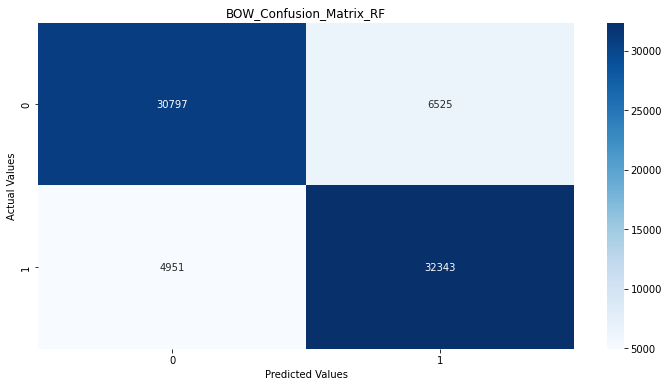

In [ ]:
cm=confusion_matrix(y_test,y_pred_bow)
plt.figure(figsize=(12,6))
plt.title("BOW_Confusion_Matrix_RF")
sns.heatmap(cm, annot=True,fmt='d', cmap='Blues')
plt.ylabel("Actual Values")
plt.xlabel("Predicted Values")
plt.savefig('/content/drive/MyDrive/Internship-project/BOW_Confusion_Matrix_RF')

In [ ]:
print(classification_report(y_test,y_pred_bow))

              precision    recall  f1-score   support

           0       0.86      0.83      0.84     37322
           1       0.83      0.87      0.85     37294

    accuracy                           0.85     74616
   macro avg       0.85      0.85      0.85     74616
weighted avg       0.85      0.85      0.85     74616



#Logistic regression :

In [ ]:
from sklearn.linear_model import LogisticRegression


In [ ]:
bow_lr = LogisticRegression()

# training the model
bow_lr.fit(X_train, y_train)

# testing the model
y_pred_bow = bow_lr.predict(X_test)

In [ ]:
train_acc = bow_lr.score(X_train, y_train)
print("The Accuracy for Training Set is {}".format(train_acc*100))

The Accuracy for Training Set is 73.15431144626217


In [ ]:
test_acc = accuracy_score(y_test, y_pred_bow)
print("The Accuracy for Test Set is {}".format(test_acc*100))


The Accuracy for Test Set is 73.04733569207677


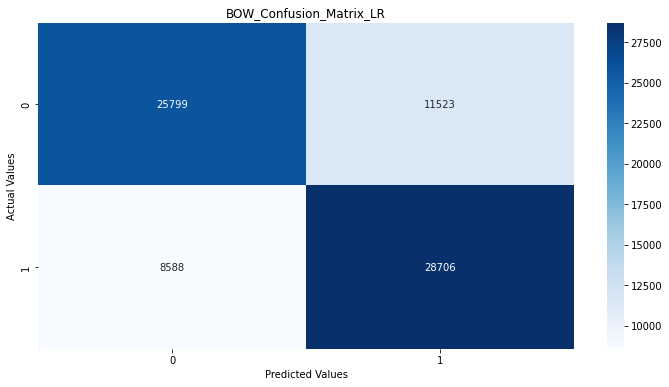

In [ ]:
cm=confusion_matrix(y_test,y_pred_bow)
plt.figure(figsize=(12,6))
plt.title("BOW_Confusion_Matrix_LR")
sns.heatmap(cm, annot=True,fmt='d', cmap='Blues')
plt.ylabel("Actual Values")
plt.xlabel("Predicted Values")
plt.savefig('/content/drive/MyDrive/Internship-project/BOW_Confusion_Matrix_LR')

In [ ]:
print(classification_report(y_test, y_pred_bow))

              precision    recall  f1-score   support

           0       0.75      0.69      0.72     37322
           1       0.71      0.77      0.74     37294

    accuracy                           0.73     74616
   macro avg       0.73      0.73      0.73     74616
weighted avg       0.73      0.73      0.73     74616



#Gaussian Naive Bayes model :

In [ ]:
# import Gaussian Naive Bayes classifier
from sklearn.naive_bayes import GaussianNB

# create a Gaussian Classifier
bow_nb = GaussianNB()

# training the model
bow_nb.fit(X_train, y_train)

# testing the model
y_pred_bow = bow_nb.predict(X_test)



In [ ]:
train_acc = bow_nb.score(X_train, y_train)
print("The Accuracy for Training Set is {}".format(train_acc*100))

The Accuracy for Training Set is 70.26929228130054


In [ ]:
test_acc = accuracy_score(y_test, y_pred_bow)
print("The Accuracy for Test Set is {}".format(test_acc*100))

The Accuracy for Test Set is 70.16189557199527


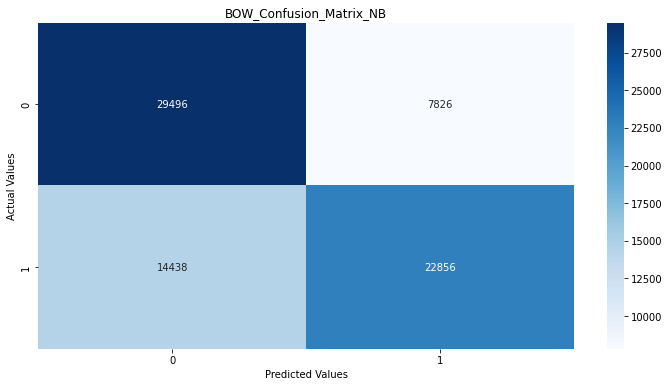

In [ ]:
cm=confusion_matrix(y_test,y_pred_bow)
plt.figure(figsize=(12,6))
plt.title("BOW_Confusion_Matrix_NB")
sns.heatmap(cm, annot=True,fmt='d', cmap='Blues')
plt.ylabel("Actual Values")
plt.xlabel("Predicted Values")
plt.savefig('/content/drive/MyDrive/Internship-project/BOW_Confusion_Matrix_NB')



In [ ]:
# importing classification report
from sklearn.metrics import classification_report

# printing the report
print(classification_report(y_test, y_pred_bow))

              precision    recall  f1-score   support

           0       0.67      0.79      0.73     37322
           1       0.74      0.61      0.67     37294

    accuracy                           0.70     74616
   macro avg       0.71      0.70      0.70     74616
weighted avg       0.71      0.70      0.70     74616



# Xgboost model :

In [ ]:
pip install xgboost

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import xgboost as xgb

In [ ]:
from xgboost import XGBClassifier
bow_xgb = XGBClassifier()

# training the model
bow_xgb.fit(X_train, y_train)

# testing the model
y_pred_bow = bow_xgb.predict(X_test)



In [ ]:
train_acc = bow_xgb.score(X_train, y_train)
print("The Accuracy for Training Set is {}".format(train_acc*100))

The Accuracy for Training Set is 79.7950376598197


In [ ]:
test_acc = accuracy_score(y_test, y_pred_bow)
print("The Accuracy for Test Set is {}".format(test_acc*100))

The Accuracy for Test Set is 79.55800364533076


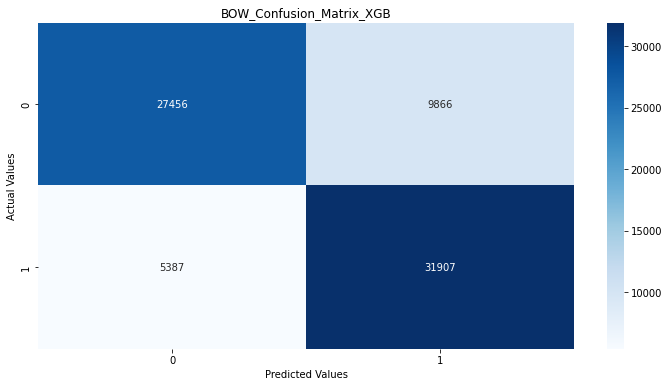

In [ ]:
cm=confusion_matrix(y_test,y_pred_bow)
plt.figure(figsize=(12,6))
plt.title("BOW_Confusion_Matrix_XGB")
sns.heatmap(cm, annot=True,fmt='d', cmap='Blues')
plt.ylabel("Actual Values")
plt.xlabel("Predicted Values")
plt.savefig('/content/drive/MyDrive/Internship-project/BOW_Confusion_Matrix_XGB')

In [ ]:
print(classification_report(y_test,y_pred_bow))

              precision    recall  f1-score   support

           0       0.84      0.74      0.78     37322
           1       0.76      0.86      0.81     37294

    accuracy                           0.80     74616
   macro avg       0.80      0.80      0.79     74616
weighted avg       0.80      0.80      0.79     74616



##**2. Term Frequency Inverse Document Frequency**

In BOW approach all the words in the text are treated as equally important i.e. there's no notion of some words in the document being more important than others. TF-IDF, or term frequency-inverse document frequency, addresses this issue. It aims to quantify the importance of a given word relative to other words in the document and in the corpus.

Let's now try to understand:

1. Term Frequency
2.Inverse Document Frequency

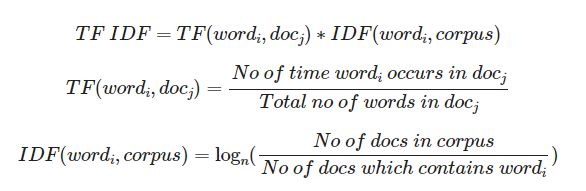

##**Advantages**
1. If the word is rare in the corpus, it will be given more importance. (i.e. IDF)
2. If the word is more frequent in a document, it will be given more importance. (i.e. TF)


##**Disadvantages**
1. The size of vector increases with the size of the vocabulary. Thus, sparsity continues to be a problem. One way to control it is by limiting the vocabulary to n number of the most frequent words.
2. It does not capture the similarity between different words that mean the same thing. i.e. Semantic Meaning is not captured.

  a. "walk", "walked", and "walking". BoW vectors of all three tokens will be equally apart.

  b. "search" and "explore" are synonyms. BoW won't capture the semantic similarity of these words.

3. This representation does not have any way to handle out of vocabulary (OOV) words (i.e., new words that were not seen in the corpus that was used to build the vectorizer).
4. As the name indicates, it is a “bag” of words. Word order information is lost in this representation. One way to control it is by using n-grams.
5. It suffers from **curse of high dimensionality.**

In [ ]:
df =pd.read_csv("/content/drive/MyDrive/Internship-project/df_feature_extraction.csv")
df

,id,qid1,qid2,question1,question2,is_duplicate,freq_qid1,freq_qid2,q1len,q2len,...,csc_min,csc_max,ctc_min,ctc_max,last_word_eq,first_word_eq,fuzz_ratio,fuzz_partial_ratio,token_sort_ratio,token_set_ratio
0,194169,294286,294287,like stacie jaxxx,whether disproving null hypothesis important q...,0,1,1,17.0,68.0,...,0.0,0.0,0.000000,0.000000,0,0,19,42,21,21
1,233887,344240,274630,front end web developer india always wanted wo...,front end developer use linux instead windows ...,0,2,5,87.0,77.0,...,0.0,0.0,0.230767,0.199999,0,1,33,46,43,54
2,210098,176829,314554,record whatsapp call,video calling whatsapp started,0,1,1,20.0,30.0,...,0.0,0.0,0.333322,0.249994,0,0,52,55,68,68
3,165182,256546,256547,working human resources 9 years total 13 years...,best country pursue ms mis completed b tech al...,0,1,1,94.0,72.0,...,0.0,0.0,0.230767,0.199999,0,0,20,33,42,44
4,190813,289989,289990,friend keeps starting businesses sell products...,things keep mind starting product based busine...,0,3,3,92.0,66.0,...,0.0,0.0,0.333330,0.230767,0,0,47,50,58,66
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
298521,404280,537922,537923,outfit ideas wear frat party,outfit ideas wear frat themed party,1,1,1,28.0,35.0,...,0.0,0.0,0.999980,0.833319,1,1,89,86,89,100
298522,404281,99131,81495,manaphy childish pokémon ranger temple sea,manaphy annoying pokemon ranger temple sea,1,5,3,42.0,42.0,...,0.0,0.0,0.666656,0.666656,1,1,82,81,82,82
298523,404282,1931,16773,long distance relationship work,long distance relationships maintained,1,26,14,31.0,38.0,...,0.0,0.0,0.499988,0.499988,0,1,78,87,75,75
298524,404284,537926,537927,jainism say homosexuality,jainism say gays homosexuality,1,1,1,25.0,30.0,...,0.0,0.0,0.999967,0.749981,1,1,91,80,91,100


In [ ]:
df.isnull().sum()

id                     0
qid1                   0
qid2                   0
question1             32
question2             47
is_duplicate           0
freq_qid1              0
freq_qid2              0
q1len                 32
q2len                 47
q1_n_words             0
q2_n_words             0
word_Common            0
word_Total             0
word_share             0
freq_q1+q2             0
freq_q1-q2             0
ques1_token            0
ques1_stem            32
ques1_stem_len         0
ques1_lemm            32
ques1_lemm_len         0
ques1_pos              0
ques2_token            0
ques2_stem            47
ques2_stem_len         0
ques2_lemm            47
ques2_lemm_len         0
ques2_pos              0
cwc_min                0
cwc_max                0
csc_min                0
csc_max                0
ctc_min                0
ctc_max                0
last_word_eq           0
first_word_eq          0
fuzz_ratio             0
fuzz_partial_ratio     0
token_sort_ratio       0


In [ ]:
df = df.dropna()
df

,id,qid1,qid2,question1,question2,is_duplicate,freq_qid1,freq_qid2,q1len,q2len,...,csc_min,csc_max,ctc_min,ctc_max,last_word_eq,first_word_eq,fuzz_ratio,fuzz_partial_ratio,token_sort_ratio,token_set_ratio
0,194169,294286,294287,like stacie jaxxx,whether disproving null hypothesis important q...,0,1,1,17.0,68.0,...,0.0,0.0,0.000000,0.000000,0,0,19,42,21,21
1,233887,344240,274630,front end web developer india always wanted wo...,front end developer use linux instead windows ...,0,2,5,87.0,77.0,...,0.0,0.0,0.230767,0.199999,0,1,33,46,43,54
2,210098,176829,314554,record whatsapp call,video calling whatsapp started,0,1,1,20.0,30.0,...,0.0,0.0,0.333322,0.249994,0,0,52,55,68,68
3,165182,256546,256547,working human resources 9 years total 13 years...,best country pursue ms mis completed b tech al...,0,1,1,94.0,72.0,...,0.0,0.0,0.230767,0.199999,0,0,20,33,42,44
4,190813,289989,289990,friend keeps starting businesses sell products...,things keep mind starting product based busine...,0,3,3,92.0,66.0,...,0.0,0.0,0.333330,0.230767,0,0,47,50,58,66
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
298521,404280,537922,537923,outfit ideas wear frat party,outfit ideas wear frat themed party,1,1,1,28.0,35.0,...,0.0,0.0,0.999980,0.833319,1,1,89,86,89,100
298522,404281,99131,81495,manaphy childish pokémon ranger temple sea,manaphy annoying pokemon ranger temple sea,1,5,3,42.0,42.0,...,0.0,0.0,0.666656,0.666656,1,1,82,81,82,82
298523,404282,1931,16773,long distance relationship work,long distance relationships maintained,1,26,14,31.0,38.0,...,0.0,0.0,0.499988,0.499988,0,1,78,87,75,75
298524,404284,537926,537927,jainism say homosexuality,jainism say gays homosexuality,1,1,1,25.0,30.0,...,0.0,0.0,0.999967,0.749981,1,1,91,80,91,100


In [ ]:
ques_df = df[['ques1_lemm','ques2_lemm']]
ques_df.head()

,ques1_lemm,ques2_lemm
0,like stacie jaxxx,whether disproving null hypothesis important q...
1,front end web developer india always wanted wo...,front end developer use linux instead window 1...
2,record whatsapp call,video calling whatsapp started
3,working human resource 9 year total 13 year va...,best country pursue m mi completed b tech also...
4,friend keep starting business sell product see...,thing keep mind starting product based busines...


In [ ]:
features_tfidf = df.drop(columns=['id','qid1','qid2','question1','question2'])
print(features_tfidf.shape)
features_tfidf.head()

(298462, 36)


,is_duplicate,freq_qid1,freq_qid2,q1len,q2len,q1_n_words,q2_n_words,word_Common,word_Total,word_share,...,csc_min,csc_max,ctc_min,ctc_max,last_word_eq,first_word_eq,fuzz_ratio,fuzz_partial_ratio,token_sort_ratio,token_set_ratio
0,0,1,1,17.0,68.0,3,7,0.0,10.0,0.000000,...,0.0,0.0,0.000000,0.000000,0,0,19,42,21,21
1,0,2,5,87.0,77.0,15,13,3.0,25.0,0.120000,...,0.0,0.0,0.230767,0.199999,0,1,33,46,43,54
2,0,1,1,20.0,30.0,3,4,1.0,7.0,0.142857,...,0.0,0.0,0.333322,0.249994,0,0,52,55,68,68
3,0,1,1,94.0,72.0,15,13,3.0,27.0,0.111111,...,0.0,0.0,0.230767,0.199999,0,0,20,33,42,44
4,0,3,3,92.0,66.0,13,9,3.0,22.0,0.136364,...,0.0,0.0,0.333330,0.230767,0,0,47,50,58,66


In [ ]:
# TF-IDF

from sklearn.feature_extraction.text import TfidfVectorizer

In [ ]:
#Using countvectorizer to form counts of repeated words and ngrams of 2 to 6
tfidf = TfidfVectorizer(analyzer = "char", ngram_range = (1,6))
tfidf.fit(ques_df);

In [ ]:
tfidf.get_feature_names

<bound method CountVectorizer.get_feature_names of TfidfVectorizer(analyzer='char', ngram_range=(1, 6))>

In [ ]:
char_q1_train = tfidf.transform(ques_df['ques1_lemm'])
char_q2_train = tfidf.transform(ques_df['ques2_lemm'])

In [ ]:
char_q1_train

<298462x63 sparse matrix of type '<class 'numpy.float64'>'
	with 1350721 stored elements in Compressed Sparse Row format>

In [ ]:
char_q2_train

<298462x63 sparse matrix of type '<class 'numpy.float64'>'
	with 1345537 stored elements in Compressed Sparse Row format>

In [ ]:
temp_df1 = pd.DataFrame(char_q1_train.toarray(), index= ques_df.index)
temp_df2 = pd.DataFrame(char_q2_train.toarray(), index= ques_df.index)
temp_df = pd.concat([temp_df1, temp_df2], axis=1)
temp_df.shape

(298462, 126)

In [ ]:
tfidf.vocabulary_

{'q': 35,
 'u': 54,
 'e': 17,
 's': 43,
 '1': 0,
 '_': 12,
 'l': 29,
 'm': 33,
 'qu': 36,
 'ue': 55,
 'es': 20,
 's1': 44,
 '1_': 1,
 '_l': 13,
 'le': 30,
 'em': 18,
 'mm': 34,
 'que': 37,
 'ues': 56,
 'es1': 21,
 's1_': 45,
 '1_l': 2,
 '_le': 14,
 'lem': 31,
 'emm': 19,
 'ques': 38,
 'ues1': 57,
 'es1_': 22,
 's1_l': 46,
 '1_le': 3,
 '_lem': 15,
 'lemm': 32,
 'ques1': 39,
 'ues1_': 58,
 'es1_l': 23,
 's1_le': 47,
 '1_lem': 4,
 '_lemm': 16,
 'ques1_': 40,
 'ues1_l': 59,
 'es1_le': 24,
 's1_lem': 48,
 '1_lemm': 5,
 '2': 6,
 's2': 49,
 '2_': 7,
 'es2': 25,
 's2_': 50,
 '2_l': 8,
 'ues2': 60,
 'es2_': 26,
 's2_l': 51,
 '2_le': 9,
 'ques2': 41,
 'ues2_': 61,
 'es2_l': 27,
 's2_le': 52,
 '2_lem': 10,
 'ques2_': 42,
 'ues2_l': 62,
 'es2_le': 28,
 's2_lem': 53,
 '2_lemm': 11}

In [ ]:
features_tfidf = pd.concat([features_tfidf, temp_df], axis=1)
print(features_tfidf.shape)
features_tfidf.head()

(298462, 162)


,is_duplicate,freq_qid1,freq_qid2,q1len,q2len,q1_n_words,q2_n_words,word_Common,word_Total,word_share,...,53,54,55,56,57,58,59,60,61,62
0,0,1,1,17.0,68.0,3,7,0.0,10.0,0.000000,...,0.0,0.216930,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0,2,5,87.0,77.0,15,13,3.0,25.0,0.120000,...,0.0,0.344297,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0,1,1,20.0,30.0,3,4,1.0,7.0,0.142857,...,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0,1,1,94.0,72.0,15,13,3.0,27.0,0.111111,...,0.0,0.257271,0.085757,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0,3,3,92.0,66.0,13,9,3.0,22.0,0.136364,...,0.0,0.379663,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
### Saving the file with these changes as new file
features_tfidf.to_csv("/content/drive/MyDrive/Internship-project/df_vectorization_tfidf.csv", index=False)

In [ ]:
features_tfidf =pd.read_csv("/content/drive/MyDrive/Internship-project/df_vectorization_tfidf.csv")
features_tfidf.head()

,is_duplicate,freq_qid1,freq_qid2,q1len,q2len,q1_n_words,q2_n_words,word_Common,word_Total,word_share,...,53.1,54.1,55.1,56.1,57.1,58.1,59.1,60.1,61.1,62.1
0,0,1,1,17.0,68.0,3,7,0.0,10.0,0.000000,...,0,2,0,0,0,0,0,0,0,0
1,0,2,5,87.0,77.0,15,13,3.0,25.0,0.120000,...,0,4,0,0,0,0,0,0,0,0
2,0,1,1,20.0,30.0,3,4,1.0,7.0,0.142857,...,0,0,0,0,0,0,0,0,0,0
3,0,1,1,94.0,72.0,15,13,3.0,27.0,0.111111,...,0,3,1,0,0,0,0,0,0,0
4,0,3,3,92.0,66.0,13,9,3.0,22.0,0.136364,...,0,4,0,0,0,0,0,0,0,0


#Data Preprocessing
Splitted data into train and test with 75% and 25%.

In [ ]:
numeric_data = features_tfidf.select_dtypes(include=[np.number])
numeric_data

,is_duplicate,freq_qid1,freq_qid2,q1len,q2len,q1_n_words,q2_n_words,word_Common,word_Total,word_share,...,53,54,55,56,57,58,59,60,61,62
0,0,1,1,17.0,68.0,3,7,0.0,10.0,0.000000,...,0.0,0.216930,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0,2,5,87.0,77.0,15,13,3.0,25.0,0.120000,...,0.0,0.344297,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0,1,1,20.0,30.0,3,4,1.0,7.0,0.142857,...,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0,1,1,94.0,72.0,15,13,3.0,27.0,0.111111,...,0.0,0.257271,0.085757,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0,3,3,92.0,66.0,13,9,3.0,22.0,0.136364,...,0.0,0.379663,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
298521,1,1,1,28.0,35.0,5,6,5.0,11.0,0.454545,...,0.0,0.229416,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
298522,1,5,3,42.0,42.0,6,6,4.0,12.0,0.333333,...,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
298523,1,26,14,31.0,38.0,4,4,2.0,8.0,0.250000,...,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
298524,1,1,1,25.0,30.0,3,4,3.0,7.0,0.428571,...,0.0,0.250000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
numeric_data.replace([np.inf, -np.inf], np.nan, inplace=True)

In [ ]:
np.isnan(numeric_data).sum()

is_duplicate    0
freq_qid1       0
freq_qid2       0
q1len           0
q2len           0
               ..
58              0
59              0
60              0
61              0
62              0
Length: 154, dtype: int64

In [ ]:
numeric_data = numeric_data.dropna()
numeric_data

,is_duplicate,freq_qid1,freq_qid2,q1len,q2len,q1_n_words,q2_n_words,word_Common,word_Total,word_share,...,53,54,55,56,57,58,59,60,61,62
0,0,1,1,17.0,68.0,3,7,0.0,10.0,0.000000,...,0.0,0.216930,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0,2,5,87.0,77.0,15,13,3.0,25.0,0.120000,...,0.0,0.344297,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0,1,1,20.0,30.0,3,4,1.0,7.0,0.142857,...,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0,1,1,94.0,72.0,15,13,3.0,27.0,0.111111,...,0.0,0.257271,0.085757,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0,3,3,92.0,66.0,13,9,3.0,22.0,0.136364,...,0.0,0.379663,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
298521,1,1,1,28.0,35.0,5,6,5.0,11.0,0.454545,...,0.0,0.229416,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
298522,1,5,3,42.0,42.0,6,6,4.0,12.0,0.333333,...,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
298523,1,26,14,31.0,38.0,4,4,2.0,8.0,0.250000,...,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
298524,1,1,1,25.0,30.0,3,4,3.0,7.0,0.428571,...,0.0,0.250000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
# defining input and output for the model

inputs = numeric_data.drop(['is_duplicate'], axis = 1)
output = numeric_data['is_duplicate']
print('the shape of the data is', numeric_data.shape)
print('the shape of inputs is', inputs.shape)
print('the shape of outputs is', output.shape)

the shape of the data is (298462, 154)
the shape of inputs is (298462, 153)
the shape of outputs is (298462,)


In [ ]:
from sklearn.model_selection import train_test_split
seed = 37187892
X_train,X_test,y_train,y_test = train_test_split(inputs,output,test_size=0.25,random_state = seed)

#Training Models


In [51]:
X_train

,freq_qid1,freq_qid2,q1len,q2len,q1_n_words,q2_n_words,word_Common,word_Total,word_share,freq_q1+q2,...,53.1,54.1,55.1,56.1,57.1,58.1,59.1,60.1,61.1,62.1
15106,1,1,45.0,61.0,5,8,3.0,13.0,0.230769,2,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
26511,1,1,38.0,19.0,5,4,1.0,9.0,0.111111,2,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
219149,1,1,12.0,12.0,2,2,2.0,4.0,0.500000,2,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
57550,1,2,15.0,10.0,3,2,2.0,5.0,0.400000,3,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
268998,1,1,8.0,29.0,2,5,2.0,7.0,0.285714,2,...,0.0,0.250000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
210999,1,1,31.0,31.0,5,5,5.0,10.0,0.500000,2,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
294857,14,9,61.0,49.0,9,9,5.0,18.0,0.277778,23,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
20316,2,1,28.0,31.0,5,5,3.0,10.0,0.300000,3,...,0.0,0.316228,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
238710,2,4,25.0,28.0,5,5,4.0,10.0,0.400000,6,...,0.0,0.267497,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [52]:
X_test

,freq_qid1,freq_qid2,q1len,q2len,q1_n_words,q2_n_words,word_Common,word_Total,word_share,freq_q1+q2,...,53.1,54.1,55.1,56.1,57.1,58.1,59.1,60.1,61.1,62.1
6077,1,2,18.0,21.0,4,3,0.0,7.0,0.000000,3,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
174868,21,19,20.0,25.0,3,4,3.0,7.0,0.428571,40,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
159889,9,5,62.0,54.0,7,7,4.0,14.0,0.285714,14,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
161335,1,1,39.0,57.0,4,7,2.0,11.0,0.181818,2,...,0.0,0.132453,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
123396,3,1,54.0,58.0,10,9,2.0,17.0,0.117647,4,...,0.0,0.244339,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44295,1,1,38.0,50.0,5,7,4.0,9.0,0.444444,2,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
59361,2,1,14.0,48.0,2,8,0.0,10.0,0.000000,3,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
243959,2,2,25.0,25.0,3,3,2.0,6.0,0.333333,4,...,0.0,0.277350,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
211815,1,1,17.0,17.0,3,3,2.0,6.0,0.333333,2,...,0.0,0.258199,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [53]:
y_train

15106     0
26511     0
219149    1
57550     0
268998    1
         ..
210999    1
294857    1
20316     0
238710    1
215915    1
Name: is_duplicate, Length: 223846, dtype: int64

In [54]:
y_test

6077      0
174868    1
159889    1
161335    1
123396    0
         ..
44295     0
59361     0
243959    1
211815    1
126892    0
Name: is_duplicate, Length: 74616, dtype: int64

In [55]:
from sklearn.preprocessing import StandardScaler
std = StandardScaler()
X_train = std.fit_transform(X_train)
X_test = std.transform(X_test)

#Random Forest :-

In [56]:
from sklearn.ensemble import RandomForestClassifier

from sklearn import preprocessing

from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

from matplotlib import pyplot as plt

import seaborn as sns

In [57]:
tfidf_rf = RandomForestClassifier()

# training the model
tfidf_rf.fit(X_train, y_train)

# testing the model
y_pred_tfidf = tfidf_rf.predict(X_test)

In [58]:
train_acc = tfidf_rf.score(X_train, y_train)
print("The Accuracy for Training Set is {}".format(train_acc*100))

The Accuracy for Training Set is 99.80254281961706


In [59]:
test_acc = accuracy_score(y_test, y_pred_tfidf)
print("The Accuracy for Test Set is {}".format(test_acc*100))

The Accuracy for Test Set is 84.83435188163396


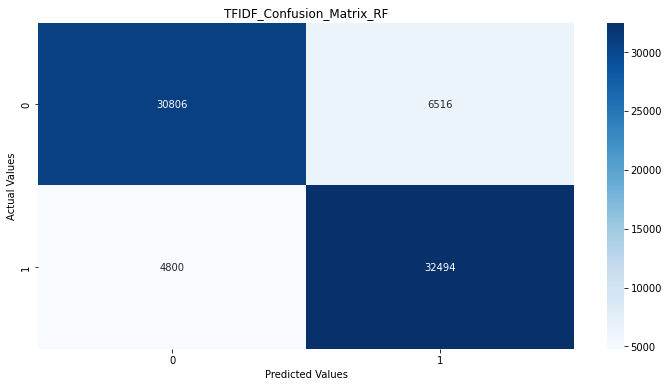

In [60]:
cm=confusion_matrix(y_test,y_pred_tfidf)
plt.figure(figsize=(12,6))
plt.title("TFIDF_Confusion_Matrix_RF")
sns.heatmap(cm, annot=True,fmt='d', cmap='Blues')
plt.ylabel("Actual Values")
plt.xlabel("Predicted Values")
plt.savefig('/content/drive/MyDrive/Internship-project/TFIDF_Confusion_Matrix_RF')

In [61]:
print(classification_report(y_test,y_pred_tfidf))

              precision    recall  f1-score   support

           0       0.87      0.83      0.84     37322
           1       0.83      0.87      0.85     37294

    accuracy                           0.85     74616
   macro avg       0.85      0.85      0.85     74616
weighted avg       0.85      0.85      0.85     74616



#Logistic regression :

In [62]:
from sklearn.linear_model import LogisticRegression


In [63]:
tfidf_lr = LogisticRegression()

# training the model
tfidf_lr.fit(X_train, y_train)

# testing the model
y_pred_tfidf = tfidf_lr.predict(X_test)

In [64]:
train_acc = tfidf_lr.score(X_train, y_train)
print("The Accuracy for Training Set is {}".format(train_acc*100))

The Accuracy for Training Set is 74.21843588895938


In [65]:
test_acc = accuracy_score(y_test, y_pred_tfidf)
print("The Accuracy for Test Set is {}".format(test_acc*100))


The Accuracy for Test Set is 74.29103677495443


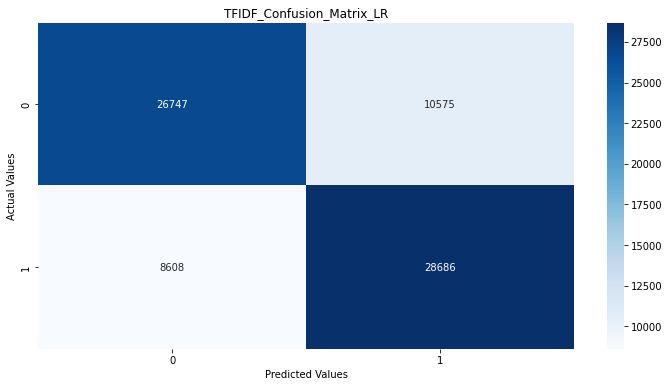

In [66]:
cm=confusion_matrix(y_test,y_pred_tfidf)
plt.figure(figsize=(12,6))
plt.title("TFIDF_Confusion_Matrix_LR")
sns.heatmap(cm, annot=True,fmt='d', cmap='Blues')
plt.ylabel("Actual Values")
plt.xlabel("Predicted Values")
plt.savefig('/content/drive/MyDrive/Internship-project/TFIDF_Confusion_Matrix_LR')

In [67]:
print(classification_report(y_test, y_pred_bow))

              precision    recall  f1-score   support

           0       0.86      0.83      0.84     37322
           1       0.83      0.87      0.85     37294

    accuracy                           0.85     74616
   macro avg       0.85      0.85      0.85     74616
weighted avg       0.85      0.85      0.85     74616



#Gaussian Naive Bayes model :

In [68]:
# import Gaussian Naive Bayes classifier
from sklearn.naive_bayes import GaussianNB

# create a Gaussian Classifier
tfidf_nb = GaussianNB()

# training the model
tfidf_nb.fit(X_train, y_train)

# testing the model
y_pred_tfidf = tfidf_nb.predict(X_test)



In [69]:
train_acc = tfidf_nb.score(X_train, y_train)
print("The Accuracy for Training Set is {}".format(train_acc*100))

The Accuracy for Training Set is 54.89354288216005


In [70]:
test_acc = accuracy_score(y_test, y_pred_tfidf)
print("The Accuracy for Test Set is {}".format(test_acc*100))

The Accuracy for Test Set is 54.92923769700868


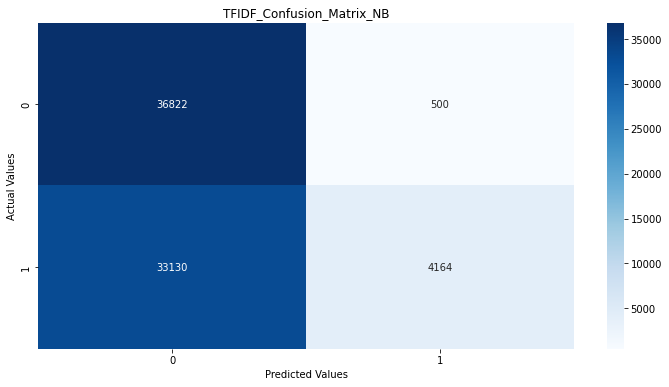

In [71]:
cm=confusion_matrix(y_test,y_pred_tfidf)
plt.figure(figsize=(12,6))
plt.title("TFIDF_Confusion_Matrix_NB")
sns.heatmap(cm, annot=True,fmt='d', cmap='Blues')
plt.ylabel("Actual Values")
plt.xlabel("Predicted Values")
plt.savefig('/content/drive/MyDrive/Internship-project/TFIDF_Confusion_Matrix_NB')



In [72]:
# importing classification report
from sklearn.metrics import classification_report

# printing the report
print(classification_report(y_test, y_pred_tfidf))

              precision    recall  f1-score   support

           0       0.53      0.99      0.69     37322
           1       0.89      0.11      0.20     37294

    accuracy                           0.55     74616
   macro avg       0.71      0.55      0.44     74616
weighted avg       0.71      0.55      0.44     74616



# Xgboost model :

In [73]:
pip install xgboost

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [74]:
import xgboost as xgb

In [75]:
from xgboost import XGBClassifier
tfidf_xgb = XGBClassifier()

# training the model
tfidf_xgb.fit(X_train, y_train)

# testing the model
y_pred_tfidf = tfidf_xgb.predict(X_test)



In [76]:
train_acc = tfidf_xgb.score(X_train, y_train)
print("The Accuracy for Training Set is {}".format(train_acc*100))

The Accuracy for Training Set is 79.8812576503489


In [77]:
test_acc = accuracy_score(y_test, y_pred_tfidf)
print("The Accuracy for Test Set is {}".format(test_acc*100))

The Accuracy for Test Set is 79.67058003645332


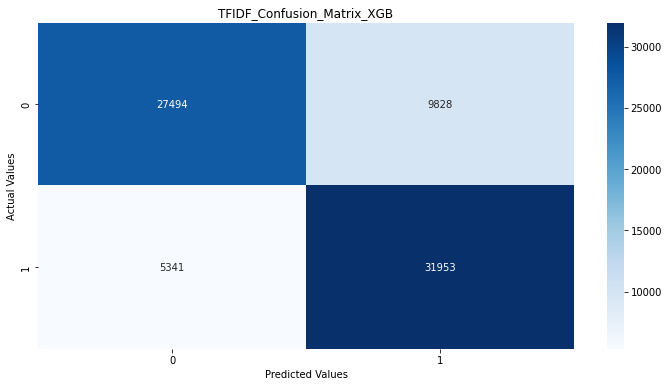

In [78]:
cm=confusion_matrix(y_test,y_pred_tfidf)
plt.figure(figsize=(12,6))
plt.title("TFIDF_Confusion_Matrix_XGB")
sns.heatmap(cm, annot=True,fmt='d', cmap='Blues')
plt.ylabel("Actual Values")
plt.xlabel("Predicted Values")
plt.savefig('/content/drive/MyDrive/Internship-project/TFIDF_Confusion_Matrix_XGB')

In [79]:
print(classification_report(y_test,y_pred_tfidf))

              precision    recall  f1-score   support

           0       0.84      0.74      0.78     37322
           1       0.76      0.86      0.81     37294

    accuracy                           0.80     74616
   macro avg       0.80      0.80      0.80     74616
weighted avg       0.80      0.80      0.80     74616



#3. Word2Vec

In [ ]:
### Saving the file with these changes as new file
df.to_csv("/content/drive/MyDrive/Internship-project/df_feature_extraction.csv", index=False)

In [ ]:
df =pd.read_csv("/content/drive/MyDrive/Internship-project/df_feature_extraction.csv")
df

,id,qid1,qid2,question1,question2,is_duplicate,freq_qid1,freq_qid2,q1len,q2len,...,csc_min,csc_max,ctc_min,ctc_max,last_word_eq,first_word_eq,fuzz_ratio,fuzz_partial_ratio,token_sort_ratio,token_set_ratio
0,194169,294286,294287,like stacie jaxxx,whether disproving null hypothesis important q...,0,1,1,17.0,68.0,...,0.0,0.0,0.000000,0.000000,0,0,19,42,21,21
1,233887,344240,274630,front end web developer india always wanted wo...,front end developer use linux instead windows ...,0,2,5,87.0,77.0,...,0.0,0.0,0.230767,0.199999,0,1,33,46,43,54
2,210098,176829,314554,record whatsapp call,video calling whatsapp started,0,1,1,20.0,30.0,...,0.0,0.0,0.333322,0.249994,0,0,52,55,68,68
3,165182,256546,256547,working human resources 9 years total 13 years...,best country pursue ms mis completed b tech al...,0,1,1,94.0,72.0,...,0.0,0.0,0.230767,0.199999,0,0,20,33,42,44
4,190813,289989,289990,friend keeps starting businesses sell products...,things keep mind starting product based busine...,0,3,3,92.0,66.0,...,0.0,0.0,0.333330,0.230767,0,0,47,50,58,66
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
298521,404280,537922,537923,outfit ideas wear frat party,outfit ideas wear frat themed party,1,1,1,28.0,35.0,...,0.0,0.0,0.999980,0.833319,1,1,89,86,89,100
298522,404281,99131,81495,manaphy childish pokémon ranger temple sea,manaphy annoying pokemon ranger temple sea,1,5,3,42.0,42.0,...,0.0,0.0,0.666656,0.666656,1,1,82,81,82,82
298523,404282,1931,16773,long distance relationship work,long distance relationships maintained,1,26,14,31.0,38.0,...,0.0,0.0,0.499988,0.499988,0,1,78,87,75,75
298524,404284,537926,537927,jainism say homosexuality,jainism say gays homosexuality,1,1,1,25.0,30.0,...,0.0,0.0,0.999967,0.749981,1,1,91,80,91,100


In [ ]:
!pip install --upgrade gensim

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 24.1 MB 1.3 MB/s 
  Attempting uninstall: gensim
    Found existing installation: gensim 3.6.0
    Uninstalling gensim-3.6.0:
      Successfully uninstalled gensim-3.6.0


In [ ]:
import gensim

print(gensim.__version__)

4.2.0


In [ ]:
ques_df = df[['ques1_token','ques2_token']]
ques_df.head()

,ques1_token,ques2_token
0,"['like', 'stacie', 'jaxxx']","['whether', 'disproving', 'null', 'hypothesis'..."
1,"['front', 'end', 'web', 'developer', 'india', ...","['front', 'end', 'developer', 'use', 'linux', ..."
2,"['record', 'whatsapp', 'call']","['video', 'calling', 'whatsapp', 'started']"
3,"['working', 'human', 'resources', '9', 'years'...","['best', 'country', 'pursue', 'ms', 'mis', 'co..."
4,"['friend', 'keeps', 'starting', 'businesses', ...","['things', 'keep', 'mind', 'starting', 'produc..."


In [ ]:
ques_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 298526 entries, 0 to 298525
Data columns (total 2 columns):
 #   Column       Non-Null Count   Dtype 
---  ------       --------------   ----- 
 0   ques1_token  298526 non-null  object
 1   ques2_token  298526 non-null  object
dtypes: object(2)
memory usage: 4.6+ MB


In [ ]:
features_w2v = df.drop(columns=['id','qid1','qid2','question1','question2', 'ques1_token', 'ques1_stem', 'ques1_lemm','ques2_token', 'ques1_pos', 'ques2_stem', 'ques2_lemm','ques2_pos'])
print(features_w2v.shape)
features_w2v.head()

(298526, 28)


,is_duplicate,freq_qid1,freq_qid2,q1len,q2len,q1_n_words,q2_n_words,word_Common,word_Total,word_share,...,csc_min,csc_max,ctc_min,ctc_max,last_word_eq,first_word_eq,fuzz_ratio,fuzz_partial_ratio,token_sort_ratio,token_set_ratio
0,0,1,1,17.0,68.0,3,7,0.0,10.0,0.000000,...,0.0,0.0,0.000000,0.000000,0,0,19,42,21,21
1,0,2,5,87.0,77.0,15,13,3.0,25.0,0.120000,...,0.0,0.0,0.230767,0.199999,0,1,33,46,43,54
2,0,1,1,20.0,30.0,3,4,1.0,7.0,0.142857,...,0.0,0.0,0.333322,0.249994,0,0,52,55,68,68
3,0,1,1,94.0,72.0,15,13,3.0,27.0,0.111111,...,0.0,0.0,0.230767,0.199999,0,0,20,33,42,44
4,0,3,3,92.0,66.0,13,9,3.0,22.0,0.136364,...,0.0,0.0,0.333330,0.230767,0,0,47,50,58,66


In [ ]:
# Word2Vec

from gensim.models import Word2Vec
# merge texts
questions = list(ques_df['ques1_token']) + list(ques_df['ques2_token'])

w2v = Word2Vec(questions,vector_size=300, min_count=1)

In [ ]:
# Total Documents
w2v.corpus_count

597052

In [ ]:
# Looking at the vocabulary

print(w2v.wv.key_to_index)

print(w2v.wv.index_to_key)

{"'": 0, ',': 1, ' ': 2, 'e': 3, 'a': 4, 'i': 5, 'n': 6, 't': 7, 's': 8, 'o': 9, 'r': 10, 'l': 11, 'c': 12, 'd': 13, ']': 14, '[': 15, 'p': 16, 'm': 17, 'g': 18, 'u': 19, 'h': 20, 'b': 21, 'y': 22, 'f': 23, 'w': 24, 'k': 25, 'v': 26, 'x': 27, '0': 28, 'q': 29, '1': 30, 'j': 31, '2': 32, '5': 33, 'z': 34, '6': 35, '3': 36, '4': 37, '7': 38, '9': 39, '8': 40, 'é': 41, '_': 42, 'í': 43, 'ã': 44, 'ö': 45, 'र': 46, 'ا': 47, 'त': 48, 'á': 49, 'म': 50, 'π': 51, 'い': 52, 'प': 53, 'ü': 54, 'ह': 55, 'ي': 56, 'द': 57, 'à': 58, 'क': 59, '不': 60, 'ç': 61, 'स': 62, 'è': 63, '²': 64, 'ز': 65, 'ن': 66, 'न': 67, 'ä': 68, 'μ': 69, 'य': 70, 'н': 71, 'ل': 72, 'م': 73, '人': 74, 'ñ': 75, 'व': 76, 'च': 77, 'श': 78, 'ع': 79, 'ग': 80, 'ú': 81, 'し': 82, '好': 83, '一': 84, 'ま': 85, 'ज': 86, 'е': 87, 'ɖ': 88, 'ó': 89, 'ë': 90, 'ø': 91, 'ཡ': 92, 'ƕ': 93, '意': 94, '思': 95, 'ɐ': 96, 'な': 97, 'ŧ': 98, 'ƫ': 99, 'ҿ': 100, 'ϟ': 101, 'ɮ': 102, 'ɽ': 103, 'φ': 104, 'ʉ': 105, 'ʛ': 106, 'ष': 107, 'و': 108, 'の': 109, 'س': 110,

In [ ]:
print(w2v.wv.__getitem__(w2v.wv.index_to_key).shape)

(713, 300)


In [ ]:
def document_vector(doc, keyed_vectors):
    """Remove out-of-vocabulary words. Create document vectors by averaging word vectors."""
    vocab_tokens = [word for word in doc if word in keyed_vectors.index_to_key]
    return np.mean(keyed_vectors.__getitem__(vocab_tokens), axis=0)

In [ ]:
q1_w2v = ques_df.ques1_token.apply(lambda x : document_vector(x, w2v.wv)) 
q2_w2v = ques_df.ques2_token.apply(lambda x : document_vector(x, w2v.wv))

In [ ]:
q1_w2v

0         [-0.51795954, 0.15307385, 0.05983192, 0.033131...
1         [-0.36730132, 0.24197946, 0.09644269, 0.046454...
2         [-0.49864924, 0.30677205, 0.11966126, 0.040187...
3         [-0.3624525, 0.22030342, 0.10353482, 0.0392342...
4         [-0.36913353, 0.20875664, 0.08211932, 0.017410...
                                ...                        
298521    [-0.48879072, 0.26843357, 0.12485618, 0.027251...
298522    [-0.4081311, 0.29065984, 0.08478533, 0.0137946...
298523    [-0.38798562, 0.26530445, 0.095963664, 0.03064...
298524    [-0.45344442, 0.27134752, 0.092841044, 0.02535...
298525    [-0.49631038, 0.29415733, 0.07574742, -0.01493...
Name: ques1_token, Length: 298526, dtype: object

In [ ]:
q2_w2v

0         [-0.3690056, 0.22859482, 0.07777954, 0.0210548...
1         [-0.37778184, 0.21177289, 0.076489165, 0.04616...
2         [-0.44143686, 0.26605797, 0.09525912, 0.039897...
3         [-0.40960115, 0.23995845, 0.11846547, 0.025383...
4         [-0.38261384, 0.23496455, 0.09247707, 0.029654...
                                ...                        
298521    [-0.46663406, 0.2508863, 0.10926154, 0.0173269...
298522    [-0.37099048, 0.2846298, 0.06809436, 0.0406536...
298523    [-0.38633507, 0.24240719, 0.03428023, 0.006790...
298524    [-0.43751243, 0.2818342, 0.097674415, 0.034951...
298525    [-0.50198036, 0.27703553, 0.09496208, 0.005156...
Name: ques2_token, Length: 298526, dtype: object

In [ ]:
features_w2v = pd.concat([features_w2v, q1_w2v,q2_w2v], axis=1)
print(features_w2v.shape)
features_w2v.head()

(298526, 30)


,is_duplicate,freq_qid1,freq_qid2,q1len,q2len,q1_n_words,q2_n_words,word_Common,word_Total,word_share,...,ctc_min,ctc_max,last_word_eq,first_word_eq,fuzz_ratio,fuzz_partial_ratio,token_sort_ratio,token_set_ratio,ques1_token,ques2_token
0,0,1,1,17.0,68.0,3,7,0.0,10.0,0.000000,...,0.000000,0.000000,0,0,19,42,21,21,"[-0.51795954, 0.15307385, 0.05983192, 0.033131...","[-0.3690056, 0.22859482, 0.07777954, 0.0210548..."
1,0,2,5,87.0,77.0,15,13,3.0,25.0,0.120000,...,0.230767,0.199999,0,1,33,46,43,54,"[-0.36730132, 0.24197946, 0.09644269, 0.046454...","[-0.37778184, 0.21177289, 0.076489165, 0.04616..."
2,0,1,1,20.0,30.0,3,4,1.0,7.0,0.142857,...,0.333322,0.249994,0,0,52,55,68,68,"[-0.49864924, 0.30677205, 0.11966126, 0.040187...","[-0.44143686, 0.26605797, 0.09525912, 0.039897..."
3,0,1,1,94.0,72.0,15,13,3.0,27.0,0.111111,...,0.230767,0.199999,0,0,20,33,42,44,"[-0.3624525, 0.22030342, 0.10353482, 0.0392342...","[-0.40960115, 0.23995845, 0.11846547, 0.025383..."
4,0,3,3,92.0,66.0,13,9,3.0,22.0,0.136364,...,0.333330,0.230767,0,0,47,50,58,66,"[-0.36913353, 0.20875664, 0.08211932, 0.017410...","[-0.38261384, 0.23496455, 0.09247707, 0.029654..."


In [ ]:
### Saving the file with these changes as new file
features_w2v.to_csv("/content/drive/MyDrive/Internship-project/df_vectorization_w2v.csv", index=False)

In [80]:
features_w2v =pd.read_csv("/content/drive/MyDrive/Internship-project/df_vectorization_w2v.csv")
features_w2v.head()

,is_duplicate,freq_qid1,freq_qid2,q1len,q2len,q1_n_words,q2_n_words,word_Common,word_Total,word_share,...,ctc_min,ctc_max,last_word_eq,first_word_eq,fuzz_ratio,fuzz_partial_ratio,token_sort_ratio,token_set_ratio,ques1_token,ques2_token
0,0,1,1,17.0,68.0,3,7,0.0,10.0,0.000000,...,0.000000,0.000000,0,0,19,42,21,21,[-5.17959535e-01 1.53073847e-01 5.98319210e-...,[-3.69005591e-01 2.28594825e-01 7.77795389e-...
1,0,2,5,87.0,77.0,15,13,3.0,25.0,0.120000,...,0.230767,0.199999,0,1,33,46,43,54,[-3.67301315e-01 2.41979465e-01 9.64426920e-...,[-0.37778184 0.21177289 0.07648917 0.046163...
2,0,1,1,20.0,30.0,3,4,1.0,7.0,0.142857,...,0.333322,0.249994,0,0,52,55,68,68,[-4.98649240e-01 3.06772053e-01 1.19661257e-...,[-4.41436857e-01 2.66057968e-01 9.52591226e-...
3,0,1,1,94.0,72.0,15,13,3.0,27.0,0.111111,...,0.230767,0.199999,0,0,20,33,42,44,[-0.3624525 0.22030342 0.10353482 0.039234...,[-0.40960115 0.23995845 0.11846547 0.025383...
4,0,3,3,92.0,66.0,13,9,3.0,22.0,0.136364,...,0.333330,0.230767,0,0,47,50,58,66,[-3.69133532e-01 2.08756641e-01 8.21193233e-...,[-0.38261384 0.23496455 0.09247707 0.029654...


##Data Preprocessing
Splitted data into train and test with 75% and 25%.

In [81]:
numeric_data = features_w2v.select_dtypes(include=[np.number])
numeric_data

,is_duplicate,freq_qid1,freq_qid2,q1len,q2len,q1_n_words,q2_n_words,word_Common,word_Total,word_share,...,csc_min,csc_max,ctc_min,ctc_max,last_word_eq,first_word_eq,fuzz_ratio,fuzz_partial_ratio,token_sort_ratio,token_set_ratio
0,0,1,1,17.0,68.0,3,7,0.0,10.0,0.000000,...,0.0,0.0,0.000000,0.000000,0,0,19,42,21,21
1,0,2,5,87.0,77.0,15,13,3.0,25.0,0.120000,...,0.0,0.0,0.230767,0.199999,0,1,33,46,43,54
2,0,1,1,20.0,30.0,3,4,1.0,7.0,0.142857,...,0.0,0.0,0.333322,0.249994,0,0,52,55,68,68
3,0,1,1,94.0,72.0,15,13,3.0,27.0,0.111111,...,0.0,0.0,0.230767,0.199999,0,0,20,33,42,44
4,0,3,3,92.0,66.0,13,9,3.0,22.0,0.136364,...,0.0,0.0,0.333330,0.230767,0,0,47,50,58,66
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
298521,1,1,1,28.0,35.0,5,6,5.0,11.0,0.454545,...,0.0,0.0,0.999980,0.833319,1,1,89,86,89,100
298522,1,5,3,42.0,42.0,6,6,4.0,12.0,0.333333,...,0.0,0.0,0.666656,0.666656,1,1,82,81,82,82
298523,1,26,14,31.0,38.0,4,4,2.0,8.0,0.250000,...,0.0,0.0,0.499988,0.499988,0,1,78,87,75,75
298524,1,1,1,25.0,30.0,3,4,3.0,7.0,0.428571,...,0.0,0.0,0.999967,0.749981,1,1,91,80,91,100


In [82]:
numeric_data.replace([np.inf, -np.inf], np.nan, inplace=True)

In [83]:
np.isnan(numeric_data).sum()

is_duplicate           0
freq_qid1              0
freq_qid2              0
q1len                 32
q2len                 47
q1_n_words             0
q2_n_words             0
word_Common            0
word_Total             0
word_share             0
freq_q1+q2             0
freq_q1-q2             0
ques1_stem_len         0
ques1_lemm_len         0
ques2_stem_len         0
ques2_lemm_len         0
cwc_min                0
cwc_max                0
csc_min                0
csc_max                0
ctc_min                0
ctc_max                0
last_word_eq           0
first_word_eq          0
fuzz_ratio             0
fuzz_partial_ratio     0
token_sort_ratio       0
token_set_ratio        0
dtype: int64

In [84]:
numeric_data = numeric_data.dropna()
numeric_data

,is_duplicate,freq_qid1,freq_qid2,q1len,q2len,q1_n_words,q2_n_words,word_Common,word_Total,word_share,...,csc_min,csc_max,ctc_min,ctc_max,last_word_eq,first_word_eq,fuzz_ratio,fuzz_partial_ratio,token_sort_ratio,token_set_ratio
0,0,1,1,17.0,68.0,3,7,0.0,10.0,0.000000,...,0.0,0.0,0.000000,0.000000,0,0,19,42,21,21
1,0,2,5,87.0,77.0,15,13,3.0,25.0,0.120000,...,0.0,0.0,0.230767,0.199999,0,1,33,46,43,54
2,0,1,1,20.0,30.0,3,4,1.0,7.0,0.142857,...,0.0,0.0,0.333322,0.249994,0,0,52,55,68,68
3,0,1,1,94.0,72.0,15,13,3.0,27.0,0.111111,...,0.0,0.0,0.230767,0.199999,0,0,20,33,42,44
4,0,3,3,92.0,66.0,13,9,3.0,22.0,0.136364,...,0.0,0.0,0.333330,0.230767,0,0,47,50,58,66
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
298521,1,1,1,28.0,35.0,5,6,5.0,11.0,0.454545,...,0.0,0.0,0.999980,0.833319,1,1,89,86,89,100
298522,1,5,3,42.0,42.0,6,6,4.0,12.0,0.333333,...,0.0,0.0,0.666656,0.666656,1,1,82,81,82,82
298523,1,26,14,31.0,38.0,4,4,2.0,8.0,0.250000,...,0.0,0.0,0.499988,0.499988,0,1,78,87,75,75
298524,1,1,1,25.0,30.0,3,4,3.0,7.0,0.428571,...,0.0,0.0,0.999967,0.749981,1,1,91,80,91,100


In [85]:
# defining input and output for the model

inputs = numeric_data.drop(['is_duplicate'], axis = 1)
output = numeric_data['is_duplicate']
print('the shape of the data is', numeric_data.shape)
print('the shape of inputs is', inputs.shape)
print('the shape of outputs is', output.shape)

the shape of the data is (298462, 28)
the shape of inputs is (298462, 27)
the shape of outputs is (298462,)


In [86]:
from sklearn.model_selection import train_test_split
seed = 37187892
X_train,X_test,y_train,y_test = train_test_split(inputs,output,test_size=0.25,random_state = seed)

In [87]:
X_train

,freq_qid1,freq_qid2,q1len,q2len,q1_n_words,q2_n_words,word_Common,word_Total,word_share,freq_q1+q2,...,csc_min,csc_max,ctc_min,ctc_max,last_word_eq,first_word_eq,fuzz_ratio,fuzz_partial_ratio,token_sort_ratio,token_set_ratio
15109,1,1,45.0,61.0,5,8,3.0,13.0,0.230769,2,...,0.0,0.0,0.599988,0.374995,0,0,47,57,60,71
26518,1,1,38.0,19.0,5,4,1.0,9.0,0.111111,2,...,0.0,0.0,0.249994,0.199996,1,0,39,53,46,46
219211,1,1,12.0,12.0,2,2,2.0,4.0,0.500000,2,...,0.0,0.0,0.999950,0.999950,1,1,100,100,100,100
57569,1,2,15.0,10.0,3,2,2.0,5.0,0.400000,3,...,0.0,0.0,0.999950,0.666644,1,1,80,70,80,100
269061,1,1,8.0,29.0,2,5,2.0,7.0,0.285714,2,...,0.0,0.0,0.999950,0.399992,0,1,43,75,43,100
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
211060,1,1,31.0,31.0,5,5,5.0,10.0,0.500000,2,...,0.0,0.0,0.999980,0.999980,1,0,84,84,100,100
294921,14,9,61.0,49.0,9,9,5.0,18.0,0.277778,23,...,0.0,0.0,0.555549,0.555549,0,0,64,61,64,69
20320,2,1,28.0,31.0,5,5,3.0,10.0,0.300000,3,...,0.0,0.0,0.599988,0.599988,1,1,75,68,78,78
238772,2,4,25.0,28.0,5,5,4.0,10.0,0.400000,6,...,0.0,0.0,0.799984,0.799984,1,1,94,88,94,94


In [88]:
X_test

,freq_qid1,freq_qid2,q1len,q2len,q1_n_words,q2_n_words,word_Common,word_Total,word_share,freq_q1+q2,...,csc_min,csc_max,ctc_min,ctc_max,last_word_eq,first_word_eq,fuzz_ratio,fuzz_partial_ratio,token_sort_ratio,token_set_ratio
6079,1,2,18.0,21.0,4,3,0.0,7.0,0.000000,3,...,0.0,0.0,0.000000,0.000000,0,0,46,64,56,56
174928,21,19,20.0,25.0,3,4,3.0,7.0,0.428571,40,...,0.0,0.0,0.999967,0.749981,0,0,62,78,89,100
159949,9,5,62.0,54.0,7,7,4.0,14.0,0.285714,14,...,0.0,0.0,0.571420,0.571420,0,0,69,70,64,76
161395,1,1,39.0,57.0,4,7,2.0,11.0,0.181818,2,...,0.0,0.0,0.499988,0.285710,0,0,52,64,56,72
123447,3,1,54.0,58.0,10,9,2.0,17.0,0.117647,4,...,0.0,0.0,0.222220,0.199998,0,0,36,39,57,52
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44309,1,1,38.0,50.0,5,7,4.0,9.0,0.444444,2,...,0.0,0.0,0.799984,0.571420,1,1,86,79,86,100
59380,2,1,14.0,48.0,2,8,0.0,10.0,0.000000,3,...,0.0,0.0,0.000000,0.000000,0,0,39,74,35,35
244021,2,2,25.0,25.0,3,3,2.0,6.0,0.333333,4,...,0.0,0.0,0.666644,0.666644,1,0,80,80,76,86
211876,1,1,17.0,17.0,3,3,2.0,6.0,0.333333,2,...,0.0,0.0,0.666644,0.666644,1,0,76,76,76,83


In [89]:
y_train

15109     0
26518     0
219211    1
57569     0
269061    1
         ..
211060    1
294921    1
20320     0
238772    1
215976    1
Name: is_duplicate, Length: 223846, dtype: int64

In [90]:
y_test

6079      0
174928    1
159949    1
161395    1
123447    0
         ..
44309     0
59380     0
244021    1
211876    1
126944    0
Name: is_duplicate, Length: 74616, dtype: int64

In [91]:
from sklearn.preprocessing import StandardScaler
std = StandardScaler()
X_train = std.fit_transform(X_train)
X_test = std.transform(X_test)

#Training Models

#Random Forest :-

In [92]:
from sklearn.ensemble import RandomForestClassifier

from sklearn import preprocessing

from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

from matplotlib import pyplot as plt

import seaborn as sns

In [93]:
w2v_rf = RandomForestClassifier()

# training the model
w2v_rf.fit(X_train, y_train)

# testing the model
y_pred_w2v = w2v_rf.predict(X_test)

In [94]:
train_acc = w2v_rf.score(X_train, y_train)
print("The Accuracy for Training Set is {}".format(train_acc*100))

The Accuracy for Training Set is 98.36896795118072


In [95]:
test_acc = accuracy_score(y_test, y_pred_w2v)
print("The Accuracy for Test Set is {}".format(test_acc*100))

The Accuracy for Test Set is 83.28374611343412


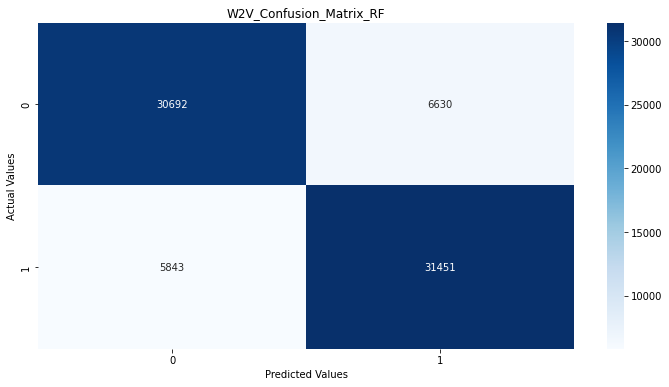

In [96]:
cm=confusion_matrix(y_test,y_pred_w2v)
plt.figure(figsize=(12,6))
plt.title("W2V_Confusion_Matrix_RF")
sns.heatmap(cm, annot=True,fmt='d', cmap='Blues')
plt.ylabel("Actual Values")
plt.xlabel("Predicted Values")
plt.savefig('/content/drive/MyDrive/Internship-project/W2V_Confusion_Matrix_RF')

In [97]:
print(classification_report(y_test,y_pred_w2v))

              precision    recall  f1-score   support

           0       0.84      0.82      0.83     37322
           1       0.83      0.84      0.83     37294

    accuracy                           0.83     74616
   macro avg       0.83      0.83      0.83     74616
weighted avg       0.83      0.83      0.83     74616



#Logistic regression :

In [98]:
from sklearn.linear_model import LogisticRegression


In [99]:
w2v_lr = LogisticRegression()

# training the model
w2v_lr.fit(X_train, y_train)

# testing the model
y_pred_w2v = w2v_lr.predict(X_test)

In [100]:
train_acc = w2v_lr.score(X_train, y_train)
print("The Accuracy for Training Set is {}".format(train_acc*100))

The Accuracy for Training Set is 74.0710131072255


In [101]:
test_acc = accuracy_score(y_test, y_pred_w2v)
print("The Accuracy for Test Set is {}".format(test_acc*100))


The Accuracy for Test Set is 74.11413101747615


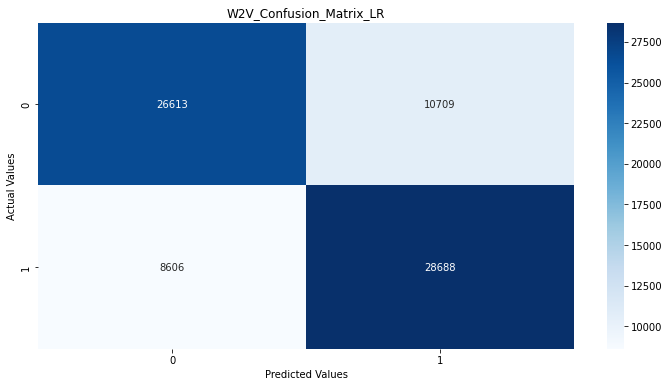

In [102]:
cm=confusion_matrix(y_test,y_pred_w2v)
plt.figure(figsize=(12,6))
plt.title("W2V_Confusion_Matrix_LR")
sns.heatmap(cm, annot=True,fmt='d', cmap='Blues')
plt.ylabel("Actual Values")
plt.xlabel("Predicted Values")
plt.savefig('/content/drive/MyDrive/Internship-project/W2V_Confusion_Matrix_LR')

In [103]:
print(classification_report(y_test, y_pred_w2v))

              precision    recall  f1-score   support

           0       0.76      0.71      0.73     37322
           1       0.73      0.77      0.75     37294

    accuracy                           0.74     74616
   macro avg       0.74      0.74      0.74     74616
weighted avg       0.74      0.74      0.74     74616



#Gaussian Naive Bayes model :

In [104]:
# import Gaussian Naive Bayes classifier
from sklearn.naive_bayes import GaussianNB

# create a Gaussian Classifier
w2v_nb = GaussianNB()

# training the model
w2v_nb.fit(X_train, y_train)

# testing the model
y_pred_w2v = w2v_nb.predict(X_test)



In [105]:
train_acc = w2v_nb.score(X_train, y_train)
print("The Accuracy for Training Set is {}".format(train_acc*100))

The Accuracy for Training Set is 73.35087515524066


In [106]:
test_acc = accuracy_score(y_test, y_pred_w2v)
print("The Accuracy for Test Set is {}".format(test_acc*100))

The Accuracy for Test Set is 73.29795218183767


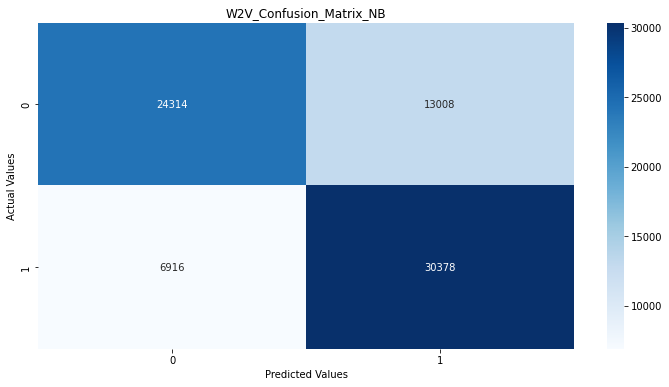

In [107]:
cm=confusion_matrix(y_test,y_pred_w2v)
plt.figure(figsize=(12,6))
plt.title("W2V_Confusion_Matrix_NB")
sns.heatmap(cm, annot=True,fmt='d', cmap='Blues')
plt.ylabel("Actual Values")
plt.xlabel("Predicted Values")
plt.savefig('/content/drive/MyDrive/Internship-project/W2V_Confusion_Matrix_NB')



In [108]:
# importing classification report
from sklearn.metrics import classification_report

# printing the report
print(classification_report(y_test, y_pred_w2v))

              precision    recall  f1-score   support

           0       0.78      0.65      0.71     37322
           1       0.70      0.81      0.75     37294

    accuracy                           0.73     74616
   macro avg       0.74      0.73      0.73     74616
weighted avg       0.74      0.73      0.73     74616



# Xgboost model :

In [ ]:
pip install xgboost

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [109]:
import xgboost as xgb

In [110]:
from xgboost import XGBClassifier
w2v_xgb = XGBClassifier()

# training the model
w2v_xgb.fit(X_train, y_train)

# testing the model
y_pred_w2v = w2v_xgb.predict(X_test)



In [111]:
train_acc = w2v_xgb.score(X_train, y_train)
print("The Accuracy for Training Set is {}".format(train_acc*100))

The Accuracy for Training Set is 79.75438471091732


In [112]:
test_acc = accuracy_score(y_test, y_pred_w2v)
print("The Accuracy for Test Set is {}".format(test_acc*100))

The Accuracy for Test Set is 79.64243593867268


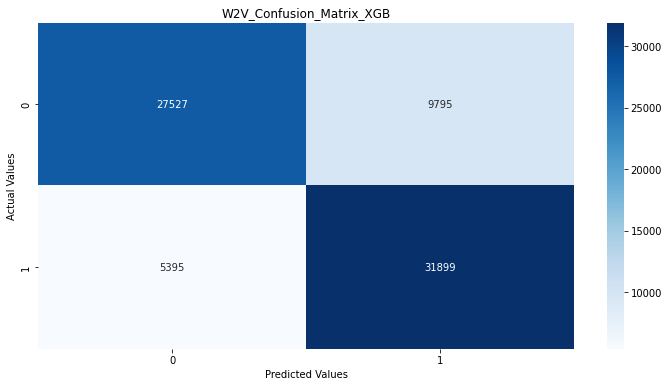

In [113]:
cm=confusion_matrix(y_test,y_pred_w2v)
plt.figure(figsize=(12,6))
plt.title("W2V_Confusion_Matrix_XGB")
sns.heatmap(cm, annot=True,fmt='d', cmap='Blues')
plt.ylabel("Actual Values")
plt.xlabel("Predicted Values")
plt.savefig('/content/drive/MyDrive/Internship-project/W2V_Confusion_Matrix_XGB')

In [114]:
print(classification_report(y_test,y_pred_w2v))

              precision    recall  f1-score   support

           0       0.84      0.74      0.78     37322
           1       0.77      0.86      0.81     37294

    accuracy                           0.80     74616
   macro avg       0.80      0.80      0.80     74616
weighted avg       0.80      0.80      0.80     74616



##4. Pretrained GloVe for Sentence Vector

In [ ]:
! pip install --upgrade gensim

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 24.1 MB 1.6 MB/s 
  Attempting uninstall: gensim
    Found existing installation: gensim 3.6.0
    Uninstalling gensim-3.6.0:
      Successfully uninstalled gensim-3.6.0


In [ ]:
import gensim
import gensim.downloader as api

print(gensim.__version__)

print(list(gensim.downloader.info()['models'].keys()))

4.2.0
['fasttext-wiki-news-subwords-300', 'conceptnet-numberbatch-17-06-300', 'word2vec-ruscorpora-300', 'word2vec-google-news-300', 'glove-wiki-gigaword-50', 'glove-wiki-gigaword-100', 'glove-wiki-gigaword-200', 'glove-wiki-gigaword-300', 'glove-twitter-25', 'glove-twitter-50', 'glove-twitter-100', 'glove-twitter-200', '__testing_word2vec-matrix-synopsis']


In [ ]:
wv = api.load('glove-twitter-100')

# # Approax 200MB Size
# # Save Embeddings
# wv.save('embeddings/50d_glove_vec.kv')

# Load Embeddings
# from gensim.models import KeyedVectors
# wv = KeyedVectors.load('embeddings/50d_glove_vec.kv')

[==================================================] 100.0% 387.1/387.1MB downloaded


In [ ]:
# Total number of vocabulary words in pretrained model

len(wv.index_to_key)

1193514

In [ ]:
ques_df = df[['ques1_token','ques2_token']]
ques_df.head()

,ques1_token,ques2_token
0,"['like', 'stacie', 'jaxxx']","['whether', 'disproving', 'null', 'hypothesis'..."
1,"['front', 'end', 'web', 'developer', 'india', ...","['front', 'end', 'developer', 'use', 'linux', ..."
2,"['record', 'whatsapp', 'call']","['video', 'calling', 'whatsapp', 'started']"
3,"['working', 'human', 'resources', '9', 'years'...","['best', 'country', 'pursue', 'ms', 'mis', 'co..."
4,"['friend', 'keeps', 'starting', 'businesses', ...","['things', 'keep', 'mind', 'starting', 'produc..."


In [146]:
features_glove = df.drop(columns=['id','qid1','qid2','question1','question2'])
print(features_glove.shape)
features_glove.head()

(298462, 36)


,is_duplicate,freq_qid1,freq_qid2,q1len,q2len,q1_n_words,q2_n_words,word_Common,word_Total,word_share,...,csc_min,csc_max,ctc_min,ctc_max,last_word_eq,first_word_eq,fuzz_ratio,fuzz_partial_ratio,token_sort_ratio,token_set_ratio
0,0,1,1,17.0,68.0,3,7,0.0,10.0,0.000000,...,0.0,0.0,0.000000,0.000000,0,0,19,42,21,21
1,0,2,5,87.0,77.0,15,13,3.0,25.0,0.120000,...,0.0,0.0,0.230767,0.199999,0,1,33,46,43,54
2,0,1,1,20.0,30.0,3,4,1.0,7.0,0.142857,...,0.0,0.0,0.333322,0.249994,0,0,52,55,68,68
3,0,1,1,94.0,72.0,15,13,3.0,27.0,0.111111,...,0.0,0.0,0.230767,0.199999,0,0,20,33,42,44
4,0,3,3,92.0,66.0,13,9,3.0,22.0,0.136364,...,0.0,0.0,0.333330,0.230767,0,0,47,50,58,66


In [ ]:
def document_vector(doc, keyed_vectors):
    """Remove out-of-vocabulary words. Create document vectors by averaging word vectors."""
    vocab_tokens = [word for word in doc if word in keyed_vectors.index_to_key]
    return np.mean(keyed_vectors.__getitem__(vocab_tokens), axis=0)

In [ ]:
from tqdm import tqdm, tqdm_notebook
# Register `pandas.progress_apply` and `pandas.Series.map_apply` with `tqdm`
tqdm.pandas()

In [ ]:
q1_pretrained_glove = ques_df.ques1_token.progress_apply(lambda x : document_vector(x, wv))

100%|██████████| 100000/100000 [3:13:52<00:00,  8.60it/s]


In [ ]:
q2_pretrained_glove = ques_df.ques2_token.progress_apply(lambda x : document_vector(x, wv))

100%|██████████| 100000/100000 [2:18:08<00:00, 12.06it/s]


In [138]:
temp_df = pd.concat([q1_pretrained_glove, q2_pretrained_glove], axis=1)
temp_df.shape

(298462, 2)

In [145]:
temp_df

,q1_pretrained_glove,q2_pretrained_glove
0,[ 0.13639946 -0.00471256 -0.05873113 0.189657...,[ 0.23574956 0.05262862 -0.06369721 0.117690...
1,[ 0.13837957 0.03600549 -0.03543817 0.206676...,[ 0.13611178 0.04516251 -0.03067124 0.234655...
2,[ 0.2533965 0.03528539 -0.139026 0.123262...,[ 2.25540370e-01 1.02175355e-01 -9.20353681e-...
3,[ 0.1838551 0.05738882 -0.09859391 0.254421...,[ 1.6517183e-01 -2.2244001e-02 -1.0007415e-01 ...
4,[ 1.66681275e-01 -4.05533724e-02 -6.96034729e-...,[ 1.78415671e-01 5.02586477e-02 -1.08449072e-...
...,...,...
298457,[ 0.17411712 0.11971605 -0.11079396 0.213277...,[ 0.17031604 0.09595283 -0.09606119 0.202491...
298458,[ 0.22482714 -0.04484395 -0.07833598 0.174533...,[ 2.15984434e-01 -6.46939725e-02 -4.08987775e-...
298459,[ 2.05687940e-01 3.50325741e-02 -8.81998762e-...,[ 2.18515515e-01 3.24821137e-02 -4.22484316e-...
298460,[ 2.4371156e-01 2.8490154e-02 -1.3673024e-01 ...,[ 0.23815373 0.03858852 -0.16047788 0.199782...


In [147]:
features_glove = pd.concat([features_glove, temp_df], axis=1)
print(features_glove.shape)
features_glove.head()

(298526, 38)


,is_duplicate,freq_qid1,freq_qid2,q1len,q2len,q1_n_words,q2_n_words,word_Common,word_Total,word_share,...,ctc_min,ctc_max,last_word_eq,first_word_eq,fuzz_ratio,fuzz_partial_ratio,token_sort_ratio,token_set_ratio,q1_pretrained_glove,q2_pretrained_glove
0,0.0,1.0,1.0,17.0,68.0,3.0,7.0,0.0,10.0,0.000000,...,0.000000,0.000000,0.0,0.0,19.0,42.0,21.0,21.0,[ 0.13639946 -0.00471256 -0.05873113 0.189657...,[ 0.23574956 0.05262862 -0.06369721 0.117690...
1,0.0,2.0,5.0,87.0,77.0,15.0,13.0,3.0,25.0,0.120000,...,0.230767,0.199999,0.0,1.0,33.0,46.0,43.0,54.0,[ 0.13837957 0.03600549 -0.03543817 0.206676...,[ 0.13611178 0.04516251 -0.03067124 0.234655...
2,0.0,1.0,1.0,20.0,30.0,3.0,4.0,1.0,7.0,0.142857,...,0.333322,0.249994,0.0,0.0,52.0,55.0,68.0,68.0,[ 0.2533965 0.03528539 -0.139026 0.123262...,[ 2.25540370e-01 1.02175355e-01 -9.20353681e-...
3,0.0,1.0,1.0,94.0,72.0,15.0,13.0,3.0,27.0,0.111111,...,0.230767,0.199999,0.0,0.0,20.0,33.0,42.0,44.0,[ 0.1838551 0.05738882 -0.09859391 0.254421...,[ 1.6517183e-01 -2.2244001e-02 -1.0007415e-01 ...
4,0.0,3.0,3.0,92.0,66.0,13.0,9.0,3.0,22.0,0.136364,...,0.333330,0.230767,0.0,0.0,47.0,50.0,58.0,66.0,[ 1.66681275e-01 -4.05533724e-02 -6.96034729e-...,[ 1.78415671e-01 5.02586477e-02 -1.08449072e-...


In [148]:
### Saving the file with these changes as new file
features_glove.to_csv("/content/drive/MyDrive/Internship-project/df_vectorization_glove.csv", index=False)

In [149]:
features_glove =pd.read_csv("/content/drive/MyDrive/Internship-project/df_vectorization_glove.csv")
features_glove.head()

,is_duplicate,freq_qid1,freq_qid2,q1len,q2len,q1_n_words,q2_n_words,word_Common,word_Total,word_share,...,ctc_min,ctc_max,last_word_eq,first_word_eq,fuzz_ratio,fuzz_partial_ratio,token_sort_ratio,token_set_ratio,q1_pretrained_glove,q2_pretrained_glove
0,0.0,1.0,1.0,17.0,68.0,3.0,7.0,0.0,10.0,0.000000,...,0.000000,0.000000,0.0,0.0,19.0,42.0,21.0,21.0,[ 0.13639946 -0.00471256 -0.05873113 0.189657...,[ 0.23574956 0.05262862 -0.06369721 0.117690...
1,0.0,2.0,5.0,87.0,77.0,15.0,13.0,3.0,25.0,0.120000,...,0.230767,0.199999,0.0,1.0,33.0,46.0,43.0,54.0,[ 0.13837957 0.03600549 -0.03543817 0.206676...,[ 0.13611178 0.04516251 -0.03067124 0.234655...
2,0.0,1.0,1.0,20.0,30.0,3.0,4.0,1.0,7.0,0.142857,...,0.333322,0.249994,0.0,0.0,52.0,55.0,68.0,68.0,[ 0.2533965 0.03528539 -0.139026 0.123262...,[ 2.25540370e-01 1.02175355e-01 -9.20353681e-...
3,0.0,1.0,1.0,94.0,72.0,15.0,13.0,3.0,27.0,0.111111,...,0.230767,0.199999,0.0,0.0,20.0,33.0,42.0,44.0,[ 0.1838551 0.05738882 -0.09859391 0.254421...,[ 1.6517183e-01 -2.2244001e-02 -1.0007415e-01 ...
4,0.0,3.0,3.0,92.0,66.0,13.0,9.0,3.0,22.0,0.136364,...,0.333330,0.230767,0.0,0.0,47.0,50.0,58.0,66.0,[ 1.66681275e-01 -4.05533724e-02 -6.96034729e-...,[ 1.78415671e-01 5.02586477e-02 -1.08449072e-...


##Data Preprocessing
Splitted data into train and test with 75% and 25%.

In [150]:
numeric_data = features_glove .select_dtypes(include=[np.number])
numeric_data

,is_duplicate,freq_qid1,freq_qid2,q1len,q2len,q1_n_words,q2_n_words,word_Common,word_Total,word_share,...,csc_min,csc_max,ctc_min,ctc_max,last_word_eq,first_word_eq,fuzz_ratio,fuzz_partial_ratio,token_sort_ratio,token_set_ratio
0,0.0,1.0,1.0,17.0,68.0,3.0,7.0,0.0,10.0,0.000000,...,0.0,0.0,0.000000,0.000000,0.0,0.0,19.0,42.0,21.0,21.0
1,0.0,2.0,5.0,87.0,77.0,15.0,13.0,3.0,25.0,0.120000,...,0.0,0.0,0.230767,0.199999,0.0,1.0,33.0,46.0,43.0,54.0
2,0.0,1.0,1.0,20.0,30.0,3.0,4.0,1.0,7.0,0.142857,...,0.0,0.0,0.333322,0.249994,0.0,0.0,52.0,55.0,68.0,68.0
3,0.0,1.0,1.0,94.0,72.0,15.0,13.0,3.0,27.0,0.111111,...,0.0,0.0,0.230767,0.199999,0.0,0.0,20.0,33.0,42.0,44.0
4,0.0,3.0,3.0,92.0,66.0,13.0,9.0,3.0,22.0,0.136364,...,0.0,0.0,0.333330,0.230767,0.0,0.0,47.0,50.0,58.0,66.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
298521,1.0,1.0,1.0,28.0,35.0,5.0,6.0,5.0,11.0,0.454545,...,0.0,0.0,0.999980,0.833319,1.0,1.0,89.0,86.0,89.0,100.0
298522,1.0,5.0,3.0,42.0,42.0,6.0,6.0,4.0,12.0,0.333333,...,0.0,0.0,0.666656,0.666656,1.0,1.0,82.0,81.0,82.0,82.0
298523,1.0,26.0,14.0,31.0,38.0,4.0,4.0,2.0,8.0,0.250000,...,0.0,0.0,0.499988,0.499988,0.0,1.0,78.0,87.0,75.0,75.0
298524,1.0,1.0,1.0,25.0,30.0,3.0,4.0,3.0,7.0,0.428571,...,0.0,0.0,0.999967,0.749981,1.0,1.0,91.0,80.0,91.0,100.0


In [151]:
numeric_data.replace([np.inf, -np.inf], np.nan, inplace=True)

In [152]:
np.isnan(numeric_data).sum()

is_duplicate          64
freq_qid1             64
freq_qid2             64
q1len                 64
q2len                 64
q1_n_words            64
q2_n_words            64
word_Common           64
word_Total            64
word_share            64
freq_q1+q2            64
freq_q1-q2            64
ques1_stem_len        64
ques1_lemm_len        64
ques2_stem_len        64
ques2_lemm_len        64
cwc_min               64
cwc_max               64
csc_min               64
csc_max               64
ctc_min               64
ctc_max               64
last_word_eq          64
first_word_eq         64
fuzz_ratio            64
fuzz_partial_ratio    64
token_sort_ratio      64
token_set_ratio       64
dtype: int64

In [153]:
numeric_data = numeric_data.dropna()
numeric_data

,is_duplicate,freq_qid1,freq_qid2,q1len,q2len,q1_n_words,q2_n_words,word_Common,word_Total,word_share,...,csc_min,csc_max,ctc_min,ctc_max,last_word_eq,first_word_eq,fuzz_ratio,fuzz_partial_ratio,token_sort_ratio,token_set_ratio
0,0.0,1.0,1.0,17.0,68.0,3.0,7.0,0.0,10.0,0.000000,...,0.0,0.0,0.000000,0.000000,0.0,0.0,19.0,42.0,21.0,21.0
1,0.0,2.0,5.0,87.0,77.0,15.0,13.0,3.0,25.0,0.120000,...,0.0,0.0,0.230767,0.199999,0.0,1.0,33.0,46.0,43.0,54.0
2,0.0,1.0,1.0,20.0,30.0,3.0,4.0,1.0,7.0,0.142857,...,0.0,0.0,0.333322,0.249994,0.0,0.0,52.0,55.0,68.0,68.0
3,0.0,1.0,1.0,94.0,72.0,15.0,13.0,3.0,27.0,0.111111,...,0.0,0.0,0.230767,0.199999,0.0,0.0,20.0,33.0,42.0,44.0
4,0.0,3.0,3.0,92.0,66.0,13.0,9.0,3.0,22.0,0.136364,...,0.0,0.0,0.333330,0.230767,0.0,0.0,47.0,50.0,58.0,66.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
298521,1.0,1.0,1.0,28.0,35.0,5.0,6.0,5.0,11.0,0.454545,...,0.0,0.0,0.999980,0.833319,1.0,1.0,89.0,86.0,89.0,100.0
298522,1.0,5.0,3.0,42.0,42.0,6.0,6.0,4.0,12.0,0.333333,...,0.0,0.0,0.666656,0.666656,1.0,1.0,82.0,81.0,82.0,82.0
298523,1.0,26.0,14.0,31.0,38.0,4.0,4.0,2.0,8.0,0.250000,...,0.0,0.0,0.499988,0.499988,0.0,1.0,78.0,87.0,75.0,75.0
298524,1.0,1.0,1.0,25.0,30.0,3.0,4.0,3.0,7.0,0.428571,...,0.0,0.0,0.999967,0.749981,1.0,1.0,91.0,80.0,91.0,100.0


In [154]:
# defining input and output for the model

inputs = numeric_data.drop(['is_duplicate'], axis = 1)
output = numeric_data['is_duplicate']
print('the shape of the data is', numeric_data.shape)
print('the shape of inputs is', inputs.shape)
print('the shape of outputs is', output.shape)

the shape of the data is (298462, 28)
the shape of inputs is (298462, 27)
the shape of outputs is (298462,)


In [155]:
from sklearn.model_selection import train_test_split
seed = 37187892
X_train,X_test,y_train,y_test = train_test_split(inputs,output,test_size=0.25,random_state = seed)

In [156]:
X_train

,freq_qid1,freq_qid2,q1len,q2len,q1_n_words,q2_n_words,word_Common,word_Total,word_share,freq_q1+q2,...,csc_min,csc_max,ctc_min,ctc_max,last_word_eq,first_word_eq,fuzz_ratio,fuzz_partial_ratio,token_sort_ratio,token_set_ratio
15109,1.0,1.0,45.0,61.0,5.0,8.0,3.0,13.0,0.230769,2.0,...,0.0,0.0,0.599988,0.374995,0.0,0.0,47.0,57.0,60.0,71.0
26518,1.0,1.0,38.0,19.0,5.0,4.0,1.0,9.0,0.111111,2.0,...,0.0,0.0,0.249994,0.199996,1.0,0.0,39.0,53.0,46.0,46.0
219211,1.0,1.0,12.0,12.0,2.0,2.0,2.0,4.0,0.500000,2.0,...,0.0,0.0,0.999950,0.999950,1.0,1.0,100.0,100.0,100.0,100.0
57569,1.0,2.0,15.0,10.0,3.0,2.0,2.0,5.0,0.400000,3.0,...,0.0,0.0,0.999950,0.666644,1.0,1.0,80.0,70.0,80.0,100.0
269061,1.0,1.0,8.0,29.0,2.0,5.0,2.0,7.0,0.285714,2.0,...,0.0,0.0,0.999950,0.399992,0.0,1.0,43.0,75.0,43.0,100.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
211060,1.0,1.0,31.0,31.0,5.0,5.0,5.0,10.0,0.500000,2.0,...,0.0,0.0,0.999980,0.999980,1.0,0.0,84.0,84.0,100.0,100.0
294921,14.0,9.0,61.0,49.0,9.0,9.0,5.0,18.0,0.277778,23.0,...,0.0,0.0,0.555549,0.555549,0.0,0.0,64.0,61.0,64.0,69.0
20320,2.0,1.0,28.0,31.0,5.0,5.0,3.0,10.0,0.300000,3.0,...,0.0,0.0,0.599988,0.599988,1.0,1.0,75.0,68.0,78.0,78.0
238772,2.0,4.0,25.0,28.0,5.0,5.0,4.0,10.0,0.400000,6.0,...,0.0,0.0,0.799984,0.799984,1.0,1.0,94.0,88.0,94.0,94.0


In [157]:
X_test

,freq_qid1,freq_qid2,q1len,q2len,q1_n_words,q2_n_words,word_Common,word_Total,word_share,freq_q1+q2,...,csc_min,csc_max,ctc_min,ctc_max,last_word_eq,first_word_eq,fuzz_ratio,fuzz_partial_ratio,token_sort_ratio,token_set_ratio
6079,1.0,2.0,18.0,21.0,4.0,3.0,0.0,7.0,0.000000,3.0,...,0.0,0.0,0.000000,0.000000,0.0,0.0,46.0,64.0,56.0,56.0
174928,21.0,19.0,20.0,25.0,3.0,4.0,3.0,7.0,0.428571,40.0,...,0.0,0.0,0.999967,0.749981,0.0,0.0,62.0,78.0,89.0,100.0
159949,9.0,5.0,62.0,54.0,7.0,7.0,4.0,14.0,0.285714,14.0,...,0.0,0.0,0.571420,0.571420,0.0,0.0,69.0,70.0,64.0,76.0
161395,1.0,1.0,39.0,57.0,4.0,7.0,2.0,11.0,0.181818,2.0,...,0.0,0.0,0.499988,0.285710,0.0,0.0,52.0,64.0,56.0,72.0
123447,3.0,1.0,54.0,58.0,10.0,9.0,2.0,17.0,0.117647,4.0,...,0.0,0.0,0.222220,0.199998,0.0,0.0,36.0,39.0,57.0,52.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44309,1.0,1.0,38.0,50.0,5.0,7.0,4.0,9.0,0.444444,2.0,...,0.0,0.0,0.799984,0.571420,1.0,1.0,86.0,79.0,86.0,100.0
59380,2.0,1.0,14.0,48.0,2.0,8.0,0.0,10.0,0.000000,3.0,...,0.0,0.0,0.000000,0.000000,0.0,0.0,39.0,74.0,35.0,35.0
244021,2.0,2.0,25.0,25.0,3.0,3.0,2.0,6.0,0.333333,4.0,...,0.0,0.0,0.666644,0.666644,1.0,0.0,80.0,80.0,76.0,86.0
211876,1.0,1.0,17.0,17.0,3.0,3.0,2.0,6.0,0.333333,2.0,...,0.0,0.0,0.666644,0.666644,1.0,0.0,76.0,76.0,76.0,83.0


In [158]:
y_train

15109     0.0
26518     0.0
219211    1.0
57569     0.0
269061    1.0
         ... 
211060    1.0
294921    1.0
20320     0.0
238772    1.0
215976    1.0
Name: is_duplicate, Length: 223846, dtype: float64

In [159]:
y_test

6079      0.0
174928    1.0
159949    1.0
161395    1.0
123447    0.0
         ... 
44309     0.0
59380     0.0
244021    1.0
211876    1.0
126944    0.0
Name: is_duplicate, Length: 74616, dtype: float64

In [160]:
from sklearn.preprocessing import StandardScaler
std = StandardScaler()
X_train = std.fit_transform(X_train)
X_test = std.transform(X_test)

#Training Models

#Random Forest :-

In [161]:
from sklearn.ensemble import RandomForestClassifier

from sklearn import preprocessing

from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

from matplotlib import pyplot as plt

import seaborn as sns

In [162]:
glove_rf = RandomForestClassifier()

# training the model
glove_rf.fit(X_train, y_train)

# testing the model
y_pred_glove = glove_rf.predict(X_test)

In [163]:
train_acc = glove_rf.score(X_train, y_train)
print("The Accuracy for Training Set is {}".format(train_acc*100))

The Accuracy for Training Set is 98.36941468688295


In [164]:
test_acc = accuracy_score(y_test, y_pred_glove)
print("The Accuracy for Test Set is {}".format(test_acc*100))

The Accuracy for Test Set is 83.36147743111397


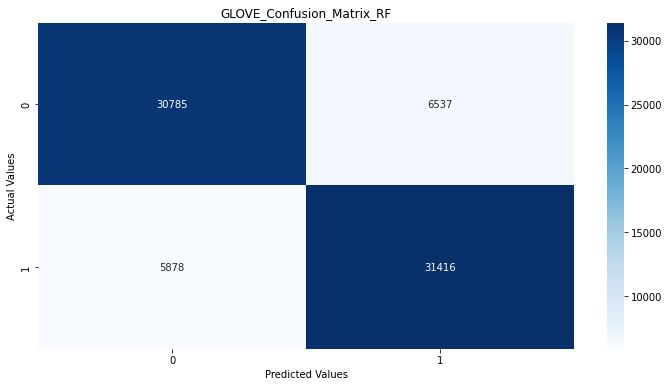

In [165]:
cm=confusion_matrix(y_test,y_pred_glove)
plt.figure(figsize=(12,6))
plt.title("GLOVE_Confusion_Matrix_RF")
sns.heatmap(cm, annot=True,fmt='d', cmap='Blues')
plt.ylabel("Actual Values")
plt.xlabel("Predicted Values")
plt.savefig('/content/drive/MyDrive/Internship-project/GLOVE_Confusion_Matrix_RF')

In [166]:
print(classification_report(y_test,y_pred_glove))

              precision    recall  f1-score   support

         0.0       0.84      0.82      0.83     37322
         1.0       0.83      0.84      0.84     37294

    accuracy                           0.83     74616
   macro avg       0.83      0.83      0.83     74616
weighted avg       0.83      0.83      0.83     74616



#Logistic regression :

In [167]:
from sklearn.linear_model import LogisticRegression


In [168]:
glove_lr = LogisticRegression()

# training the model
glove_lr.fit(X_train, y_train)

# testing the model
y_pred_glove = glove_lr.predict(X_test)

In [169]:
train_acc = glove_lr.score(X_train, y_train)
print("The Accuracy for Training Set is {}".format(train_acc*100))

The Accuracy for Training Set is 74.0710131072255


In [170]:
test_acc = accuracy_score(y_test, y_pred_glove)
print("The Accuracy for Test Set is {}".format(test_acc*100))


The Accuracy for Test Set is 74.11413101747615


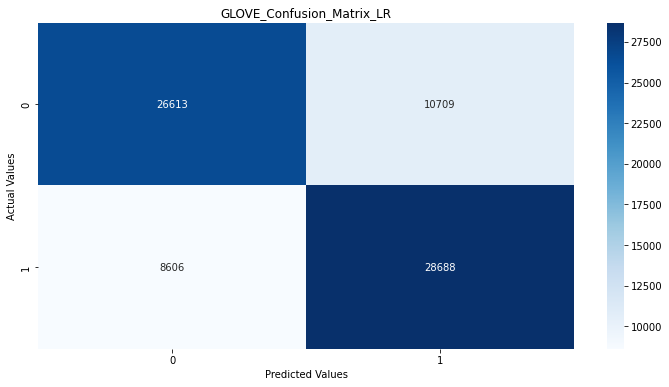

In [171]:
cm=confusion_matrix(y_test,y_pred_glove)
plt.figure(figsize=(12,6))
plt.title("GLOVE_Confusion_Matrix_LR")
sns.heatmap(cm, annot=True,fmt='d', cmap='Blues')
plt.ylabel("Actual Values")
plt.xlabel("Predicted Values")
plt.savefig('/content/drive/MyDrive/Internship-project/GLOVE_Confusion_Matrix_LR')

In [172]:
print(classification_report(y_test, y_pred_glove))

              precision    recall  f1-score   support

         0.0       0.76      0.71      0.73     37322
         1.0       0.73      0.77      0.75     37294

    accuracy                           0.74     74616
   macro avg       0.74      0.74      0.74     74616
weighted avg       0.74      0.74      0.74     74616



#Gaussian Naive Bayes model :

In [173]:
# import Gaussian Naive Bayes classifier
from sklearn.naive_bayes import GaussianNB

# create a Gaussian Classifier
glove_nb = GaussianNB()

# training the model
glove_nb.fit(X_train, y_train)

# testing the model
y_pred_glove = glove_nb.predict(X_test)



In [174]:
train_acc = glove_nb.score(X_train, y_train)
print("The Accuracy for Training Set is {}".format(train_acc*100))

The Accuracy for Training Set is 73.35087515524066


In [175]:
test_acc = accuracy_score(y_test, y_pred_glove)
print("The Accuracy for Test Set is {}".format(test_acc*100))

The Accuracy for Test Set is 73.29795218183767


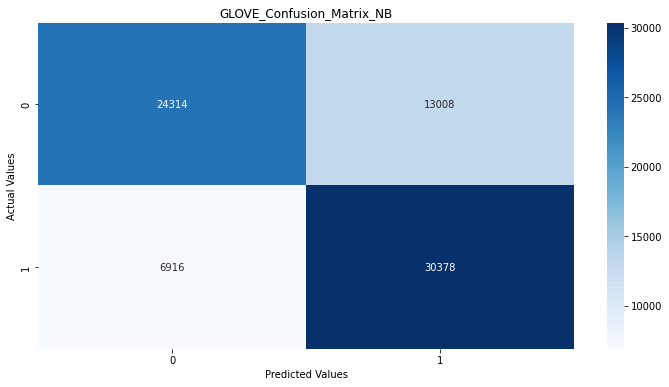

In [176]:
cm=confusion_matrix(y_test,y_pred_glove)
plt.figure(figsize=(12,6))
plt.title("GLOVE_Confusion_Matrix_NB")
sns.heatmap(cm, annot=True,fmt='d', cmap='Blues')
plt.ylabel("Actual Values")
plt.xlabel("Predicted Values")
plt.savefig('/content/drive/MyDrive/Internship-project/GLOVE_Confusion_Matrix_NB')



In [177]:
# importing classification report
from sklearn.metrics import classification_report

# printing the report
print(classification_report(y_test, y_pred_glove))

              precision    recall  f1-score   support

         0.0       0.78      0.65      0.71     37322
         1.0       0.70      0.81      0.75     37294

    accuracy                           0.73     74616
   macro avg       0.74      0.73      0.73     74616
weighted avg       0.74      0.73      0.73     74616



# Xgboost model :

In [ ]:
pip install xgboost

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [178]:
import xgboost as xgb

In [179]:
from xgboost import XGBClassifier
glove_xgb = XGBClassifier()

# training the model
glove_xgb.fit(X_train, y_train)

# testing the model
y_pred_glove = glove_xgb.predict(X_test)



In [180]:
train_acc = glove_xgb.score(X_train, y_train)
print("The Accuracy for Training Set is {}".format(train_acc*100))

The Accuracy for Training Set is 79.75438471091732


In [181]:
test_acc = accuracy_score(y_test, y_pred_glove)
print("The Accuracy for Test Set is {}".format(test_acc*100))

The Accuracy for Test Set is 79.64243593867268


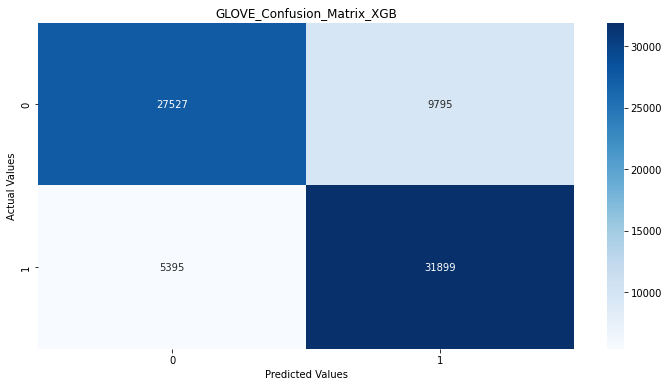

In [183]:
cm=confusion_matrix(y_test,y_pred_glove)
plt.figure(figsize=(12,6))
plt.title("GLOVE_Confusion_Matrix_XGB")
sns.heatmap(cm, annot=True,fmt='d', cmap='Blues')
plt.ylabel("Actual Values")
plt.xlabel("Predicted Values")
plt.savefig('/content/drive/MyDrive/Internship-project/GLOVE_Confusion_Matrix_XGB')

In [184]:
print(classification_report(y_test,y_pred_w2v))

              precision    recall  f1-score   support

         0.0       0.84      0.74      0.78     37322
         1.0       0.77      0.86      0.81     37294

    accuracy                           0.80     74616
   macro avg       0.80      0.80      0.80     74616
weighted avg       0.80      0.80      0.80     74616



#5. Pretrained BERT for Sentence **Vectors**

In [ ]:
### Saving the file with these changes as new file
df.to_csv("/content/drive/MyDrive/Internship-project/df_feature_extraction.csv", index=False)

In [5]:
df =pd.read_csv("/content/drive/MyDrive/Internship-project/df_feature_extraction.csv")
df

,id,qid1,qid2,question1,question2,is_duplicate,freq_qid1,freq_qid2,q1len,q2len,...,csc_min,csc_max,ctc_min,ctc_max,last_word_eq,first_word_eq,fuzz_ratio,fuzz_partial_ratio,token_sort_ratio,token_set_ratio
0,194169,294286,294287,like stacie jaxxx,whether disproving null hypothesis important q...,0,1,1,17.0,68.0,...,0.0,0.0,0.000000,0.000000,0,0,19,42,21,21
1,233887,344240,274630,front end web developer india always wanted wo...,front end developer use linux instead windows ...,0,2,5,87.0,77.0,...,0.0,0.0,0.230767,0.199999,0,1,33,46,43,54
2,210098,176829,314554,record whatsapp call,video calling whatsapp started,0,1,1,20.0,30.0,...,0.0,0.0,0.333322,0.249994,0,0,52,55,68,68
3,165182,256546,256547,working human resources 9 years total 13 years...,best country pursue ms mis completed b tech al...,0,1,1,94.0,72.0,...,0.0,0.0,0.230767,0.199999,0,0,20,33,42,44
4,190813,289989,289990,friend keeps starting businesses sell products...,things keep mind starting product based busine...,0,3,3,92.0,66.0,...,0.0,0.0,0.333330,0.230767,0,0,47,50,58,66
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
298521,404280,537922,537923,outfit ideas wear frat party,outfit ideas wear frat themed party,1,1,1,28.0,35.0,...,0.0,0.0,0.999980,0.833319,1,1,89,86,89,100
298522,404281,99131,81495,manaphy childish pokémon ranger temple sea,manaphy annoying pokemon ranger temple sea,1,5,3,42.0,42.0,...,0.0,0.0,0.666656,0.666656,1,1,82,81,82,82
298523,404282,1931,16773,long distance relationship work,long distance relationships maintained,1,26,14,31.0,38.0,...,0.0,0.0,0.499988,0.499988,0,1,78,87,75,75
298524,404284,537926,537927,jainism say homosexuality,jainism say gays homosexuality,1,1,1,25.0,30.0,...,0.0,0.0,0.999967,0.749981,1,1,91,80,91,100


In [ ]:
!pip install -U sentence-transformers

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 85 kB 3.3 MB/s 
     |████████████████████████████████| 5.3 MB 46.4 MB/s 
     |████████████████████████████████| 1.3 MB 42.9 MB/s 
     |████████████████████████████████| 163 kB 44.2 MB/s 
     |████████████████████████████████| 7.6 MB 43.3 MB/s 
  Created wheel for sentence-transformers: filename=sentence_transformers-2.2.2-py3-none-any.whl size=125938 sha256=93d61ac196bdab871367d19392768c9721c9cfbd68edae3dda1d468323edf06b
  Stored in directory: /root/.cache/pip/wheels/bf/06/fb/d59c1e5bd1dac7f6cf61ec0036cc3a10ab8fecaa6b2c3d3ee9
Successfully built sentence-transformers


In [ ]:
from sentence_transformers import SentenceTransformer, util

bert = SentenceTransformer('all-MiniLM-L6-v2')

Downloading:   0%|          | 0.00/1.18k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/190 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/10.6k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/612 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/116 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/39.3k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/112 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/466k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/350 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/13.2k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/232k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/349 [00:00<?, ?B/s]

In [ ]:
ques_df = df[['ques1_lemm','ques2_lemm']]
ques_df.head()

,ques1_lemm,ques2_lemm
0,like stacie jaxxx,whether disproving null hypothesis important q...
1,front end web developer india always wanted wo...,front end developer use linux instead window 1...
2,record whatsapp call,video calling whatsapp started
3,working human resource 9 year total 13 year va...,best country pursue m mi completed b tech also...
4,friend keep starting business sell product see...,thing keep mind starting product based busines...


In [ ]:
features_bert = df.drop(columns=['id','qid1','qid2','question1','question2', 'ques1_token', 'ques1_stem', 'ques1_lemm','ques2_token', 'ques1_pos', 'ques2_stem', 'ques2_lemm','ques2_pos'])
print(features_bert.shape)
features_bert.head()

(298526, 28)


,is_duplicate,freq_qid1,freq_qid2,q1len,q2len,q1_n_words,q2_n_words,word_Common,word_Total,word_share,...,csc_min,csc_max,ctc_min,ctc_max,last_word_eq,first_word_eq,fuzz_ratio,fuzz_partial_ratio,token_sort_ratio,token_set_ratio
0,0,1,1,17.0,68.0,3,7,0.0,10.0,0.000000,...,0.0,0.0,0.000000,0.000000,0,0,19,42,21,21
1,0,2,5,87.0,77.0,15,13,3.0,25.0,0.120000,...,0.0,0.0,0.230767,0.199999,0,1,33,46,43,54
2,0,1,1,20.0,30.0,3,4,1.0,7.0,0.142857,...,0.0,0.0,0.333322,0.249994,0,0,52,55,68,68
3,0,1,1,94.0,72.0,15,13,3.0,27.0,0.111111,...,0.0,0.0,0.230767,0.199999,0,0,20,33,42,44
4,0,3,3,92.0,66.0,13,9,3.0,22.0,0.136364,...,0.0,0.0,0.333330,0.230767,0,0,47,50,58,66


In [ ]:
q1_pretrained_bert = ques_df.ques1_lemm.apply(bert.encode)
q2_pretrained_bert = ques_df.ques2_lemm.apply(bert.encode)

In [ ]:
features_bert = pd.concat([features_bert, q1_pretrained_bert,q2_pretrained_bert], axis=1)
print(features_bert.shape)
features_bert.head()

,is_duplicate,freq_qid1,freq_qid2,q1len,q2len,q1_n_words,q2_n_words,word_Common,word_Total,word_share,...,ctc_min,ctc_max,last_word_eq,first_word_eq,fuzz_ratio,fuzz_partial_ratio,token_sort_ratio,token_set_ratio,ques1_lemm,ques2_lemm
0,0,1,1,17.0,68.0,3,7,0.0,10.0,0.000000,...,0.000000,0.000000,0,0,19,42,21,21,[-3.50450203e-02 -1.65433716e-02 -1.02663532e-...,[ 5.29430583e-02 1.33403063e-01 -1.04429852e-...
1,0,2,5,87.0,77.0,15,13,3.0,25.0,0.120000,...,0.230767,0.199999,0,1,33,46,43,54,[-8.16369876e-02 -5.72566055e-02 -3.90162505e-...,[-2.96411361e-03 2.35236287e-02 -2.32988000e-...
2,0,1,1,20.0,30.0,3,4,1.0,7.0,0.142857,...,0.333322,0.249994,0,0,52,55,68,68,[-7.02036321e-02 4.86113094e-02 -8.78780056e-...,[-1.68852173e-02 -1.89235695e-02 3.11119501e-...
3,0,1,1,94.0,72.0,15,13,3.0,27.0,0.111111,...,0.230767,0.199999,0,0,20,33,42,44,[ 3.86326038e-03 1.60866901e-02 -3.07909995e-...,[ 2.92416848e-02 -7.50746429e-02 6.76211417e-...
4,0,3,3,92.0,66.0,13,9,3.0,22.0,0.136364,...,0.333330,0.230767,0,0,47,50,58,66,[-8.99362471e-03 -1.12616830e-02 1.26624499e-...,[ 2.97680660e-03 -5.93840890e-02 -2.77760867e-...


In [ ]:
### Saving the file with these changes as new file
features_bert.to_csv("/content/drive/MyDrive/Internship-project/df_vectorization_bert.csv", index=False)

In [6]:
features_bert =pd.read_csv("/content/drive/MyDrive/Internship-project/df_vectorization_bert.csv")
features_bert.head()

,is_duplicate,freq_qid1,freq_qid2,q1len,q2len,q1_n_words,q2_n_words,word_Common,word_Total,word_share,...,ctc_min,ctc_max,last_word_eq,first_word_eq,fuzz_ratio,fuzz_partial_ratio,token_sort_ratio,token_set_ratio,q1_pretrained_bert,q2_pretrained_bert
0,0,1,1,17.0,68.0,3,7,0.0,10.0,0.000000,...,0.000000,0.000000,0,0,19,42,21,21,[-3.50450203e-02 -1.65433716e-02 -1.02663532e-...,[ 5.29430583e-02 1.33403063e-01 -1.04429852e-...
1,0,2,5,87.0,77.0,15,13,3.0,25.0,0.120000,...,0.230767,0.199999,0,1,33,46,43,54,[-8.16369876e-02 -5.72566055e-02 -3.90162505e-...,[-2.96411361e-03 2.35236287e-02 -2.32988000e-...
2,0,1,1,20.0,30.0,3,4,1.0,7.0,0.142857,...,0.333322,0.249994,0,0,52,55,68,68,[-7.02036321e-02 4.86113094e-02 -8.78780056e-...,[-1.68852173e-02 -1.89235695e-02 3.11119501e-...
3,0,1,1,94.0,72.0,15,13,3.0,27.0,0.111111,...,0.230767,0.199999,0,0,20,33,42,44,[ 3.86326038e-03 1.60866901e-02 -3.07909995e-...,[ 2.92416848e-02 -7.50746429e-02 6.76211417e-...
4,0,3,3,92.0,66.0,13,9,3.0,22.0,0.136364,...,0.333330,0.230767,0,0,47,50,58,66,[-8.99362471e-03 -1.12616830e-02 1.26624499e-...,[ 2.97680660e-03 -5.93840890e-02 -2.77760867e-...


##Data Preprocessing
Splitted data into train and test with 75% and 25%.

In [8]:
numeric_data = features_bert.select_dtypes(include=[np.number])
numeric_data

,is_duplicate,freq_qid1,freq_qid2,q1len,q2len,q1_n_words,q2_n_words,word_Common,word_Total,word_share,...,csc_min,csc_max,ctc_min,ctc_max,last_word_eq,first_word_eq,fuzz_ratio,fuzz_partial_ratio,token_sort_ratio,token_set_ratio
0,0,1,1,17.0,68.0,3,7,0.0,10.0,0.000000,...,0.0,0.0,0.000000,0.000000,0,0,19,42,21,21
1,0,2,5,87.0,77.0,15,13,3.0,25.0,0.120000,...,0.0,0.0,0.230767,0.199999,0,1,33,46,43,54
2,0,1,1,20.0,30.0,3,4,1.0,7.0,0.142857,...,0.0,0.0,0.333322,0.249994,0,0,52,55,68,68
3,0,1,1,94.0,72.0,15,13,3.0,27.0,0.111111,...,0.0,0.0,0.230767,0.199999,0,0,20,33,42,44
4,0,3,3,92.0,66.0,13,9,3.0,22.0,0.136364,...,0.0,0.0,0.333330,0.230767,0,0,47,50,58,66
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
298521,1,1,1,28.0,35.0,5,6,5.0,11.0,0.454545,...,0.0,0.0,0.999980,0.833319,1,1,89,86,89,100
298522,1,5,3,42.0,42.0,6,6,4.0,12.0,0.333333,...,0.0,0.0,0.666656,0.666656,1,1,82,81,82,82
298523,1,26,14,31.0,38.0,4,4,2.0,8.0,0.250000,...,0.0,0.0,0.499988,0.499988,0,1,78,87,75,75
298524,1,1,1,25.0,30.0,3,4,3.0,7.0,0.428571,...,0.0,0.0,0.999967,0.749981,1,1,91,80,91,100


In [9]:
numeric_data.replace([np.inf, -np.inf], np.nan, inplace=True)

In [10]:
np.isnan(numeric_data).sum()

is_duplicate           0
freq_qid1              0
freq_qid2              0
q1len                 32
q2len                 47
q1_n_words             0
q2_n_words             0
word_Common            0
word_Total             0
word_share             0
freq_q1+q2             0
freq_q1-q2             0
ques1_stem_len         0
ques1_lemm_len         0
ques2_stem_len         0
ques2_lemm_len         0
cwc_min                0
cwc_max                0
csc_min                0
csc_max                0
ctc_min                0
ctc_max                0
last_word_eq           0
first_word_eq          0
fuzz_ratio             0
fuzz_partial_ratio     0
token_sort_ratio       0
token_set_ratio        0
dtype: int64

In [11]:
numeric_data = numeric_data.dropna()
numeric_data

,is_duplicate,freq_qid1,freq_qid2,q1len,q2len,q1_n_words,q2_n_words,word_Common,word_Total,word_share,...,csc_min,csc_max,ctc_min,ctc_max,last_word_eq,first_word_eq,fuzz_ratio,fuzz_partial_ratio,token_sort_ratio,token_set_ratio
0,0,1,1,17.0,68.0,3,7,0.0,10.0,0.000000,...,0.0,0.0,0.000000,0.000000,0,0,19,42,21,21
1,0,2,5,87.0,77.0,15,13,3.0,25.0,0.120000,...,0.0,0.0,0.230767,0.199999,0,1,33,46,43,54
2,0,1,1,20.0,30.0,3,4,1.0,7.0,0.142857,...,0.0,0.0,0.333322,0.249994,0,0,52,55,68,68
3,0,1,1,94.0,72.0,15,13,3.0,27.0,0.111111,...,0.0,0.0,0.230767,0.199999,0,0,20,33,42,44
4,0,3,3,92.0,66.0,13,9,3.0,22.0,0.136364,...,0.0,0.0,0.333330,0.230767,0,0,47,50,58,66
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
298521,1,1,1,28.0,35.0,5,6,5.0,11.0,0.454545,...,0.0,0.0,0.999980,0.833319,1,1,89,86,89,100
298522,1,5,3,42.0,42.0,6,6,4.0,12.0,0.333333,...,0.0,0.0,0.666656,0.666656,1,1,82,81,82,82
298523,1,26,14,31.0,38.0,4,4,2.0,8.0,0.250000,...,0.0,0.0,0.499988,0.499988,0,1,78,87,75,75
298524,1,1,1,25.0,30.0,3,4,3.0,7.0,0.428571,...,0.0,0.0,0.999967,0.749981,1,1,91,80,91,100


In [12]:
# defining input and output for the model

inputs = numeric_data.drop(['is_duplicate'], axis = 1)
output = numeric_data['is_duplicate']
print('the shape of the data is', numeric_data.shape)
print('the shape of inputs is', inputs.shape)
print('the shape of outputs is', output.shape)

the shape of the data is (298462, 28)
the shape of inputs is (298462, 27)
the shape of outputs is (298462,)


In [13]:
from sklearn.model_selection import train_test_split
seed = 37187892
X_train,X_test,y_train,y_test = train_test_split(inputs,output,test_size=0.25,random_state = seed)

In [14]:
X_train

,freq_qid1,freq_qid2,q1len,q2len,q1_n_words,q2_n_words,word_Common,word_Total,word_share,freq_q1+q2,...,csc_min,csc_max,ctc_min,ctc_max,last_word_eq,first_word_eq,fuzz_ratio,fuzz_partial_ratio,token_sort_ratio,token_set_ratio
15109,1,1,45.0,61.0,5,8,3.0,13.0,0.230769,2,...,0.0,0.0,0.599988,0.374995,0,0,47,57,60,71
26518,1,1,38.0,19.0,5,4,1.0,9.0,0.111111,2,...,0.0,0.0,0.249994,0.199996,1,0,39,53,46,46
219211,1,1,12.0,12.0,2,2,2.0,4.0,0.500000,2,...,0.0,0.0,0.999950,0.999950,1,1,100,100,100,100
57569,1,2,15.0,10.0,3,2,2.0,5.0,0.400000,3,...,0.0,0.0,0.999950,0.666644,1,1,80,70,80,100
269061,1,1,8.0,29.0,2,5,2.0,7.0,0.285714,2,...,0.0,0.0,0.999950,0.399992,0,1,43,75,43,100
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
211060,1,1,31.0,31.0,5,5,5.0,10.0,0.500000,2,...,0.0,0.0,0.999980,0.999980,1,0,84,84,100,100
294921,14,9,61.0,49.0,9,9,5.0,18.0,0.277778,23,...,0.0,0.0,0.555549,0.555549,0,0,64,61,64,69
20320,2,1,28.0,31.0,5,5,3.0,10.0,0.300000,3,...,0.0,0.0,0.599988,0.599988,1,1,75,68,78,78
238772,2,4,25.0,28.0,5,5,4.0,10.0,0.400000,6,...,0.0,0.0,0.799984,0.799984,1,1,94,88,94,94


In [15]:
X_test

,freq_qid1,freq_qid2,q1len,q2len,q1_n_words,q2_n_words,word_Common,word_Total,word_share,freq_q1+q2,...,csc_min,csc_max,ctc_min,ctc_max,last_word_eq,first_word_eq,fuzz_ratio,fuzz_partial_ratio,token_sort_ratio,token_set_ratio
6079,1,2,18.0,21.0,4,3,0.0,7.0,0.000000,3,...,0.0,0.0,0.000000,0.000000,0,0,46,64,56,56
174928,21,19,20.0,25.0,3,4,3.0,7.0,0.428571,40,...,0.0,0.0,0.999967,0.749981,0,0,62,78,89,100
159949,9,5,62.0,54.0,7,7,4.0,14.0,0.285714,14,...,0.0,0.0,0.571420,0.571420,0,0,69,70,64,76
161395,1,1,39.0,57.0,4,7,2.0,11.0,0.181818,2,...,0.0,0.0,0.499988,0.285710,0,0,52,64,56,72
123447,3,1,54.0,58.0,10,9,2.0,17.0,0.117647,4,...,0.0,0.0,0.222220,0.199998,0,0,36,39,57,52
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44309,1,1,38.0,50.0,5,7,4.0,9.0,0.444444,2,...,0.0,0.0,0.799984,0.571420,1,1,86,79,86,100
59380,2,1,14.0,48.0,2,8,0.0,10.0,0.000000,3,...,0.0,0.0,0.000000,0.000000,0,0,39,74,35,35
244021,2,2,25.0,25.0,3,3,2.0,6.0,0.333333,4,...,0.0,0.0,0.666644,0.666644,1,0,80,80,76,86
211876,1,1,17.0,17.0,3,3,2.0,6.0,0.333333,2,...,0.0,0.0,0.666644,0.666644,1,0,76,76,76,83


In [16]:
y_train

15109     0
26518     0
219211    1
57569     0
269061    1
         ..
211060    1
294921    1
20320     0
238772    1
215976    1
Name: is_duplicate, Length: 223846, dtype: int64

In [17]:
y_test

6079      0
174928    1
159949    1
161395    1
123447    0
         ..
44309     0
59380     0
244021    1
211876    1
126944    0
Name: is_duplicate, Length: 74616, dtype: int64

#Training Models

#Random Forest :-

In [18]:
from sklearn.ensemble import RandomForestClassifier

from sklearn import preprocessing

from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

from matplotlib import pyplot as plt

import seaborn as sns

In [19]:
bert_rf = RandomForestClassifier()

# training the model
bert_rf.fit(X_train, y_train)

# testing the model
y_pred_bert = bert_rf.predict(X_test)

In [20]:
train_acc = bert_rf.score(X_train, y_train)
print("The Accuracy for Training Set is {}".format(train_acc*100))

The Accuracy for Training Set is 98.37075489398963


In [21]:
test_acc = accuracy_score(y_test, y_pred_bert)
print("The Accuracy for Test Set is {}".format(test_acc*100))

The Accuracy for Test Set is 83.4378685536614


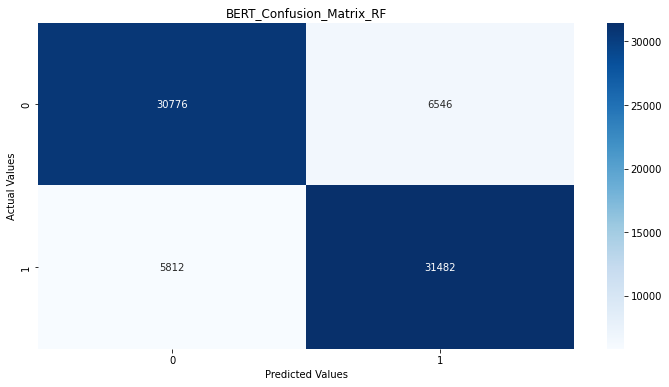

In [22]:
cm=confusion_matrix(y_test,y_pred_bert)
plt.figure(figsize=(12,6))
plt.title("BERT_Confusion_Matrix_RF")
sns.heatmap(cm, annot=True,fmt='d', cmap='Blues')
plt.ylabel("Actual Values")
plt.xlabel("Predicted Values")
plt.savefig('/content/drive/MyDrive/Internship-project/BERT_Confusion_Matrix_RF')

In [23]:
print(classification_report(y_test,y_pred_bert))

              precision    recall  f1-score   support

           0       0.84      0.82      0.83     37322
           1       0.83      0.84      0.84     37294

    accuracy                           0.83     74616
   macro avg       0.83      0.83      0.83     74616
weighted avg       0.83      0.83      0.83     74616



#Logistic regression :

In [24]:
from sklearn.linear_model import LogisticRegression


In [25]:
bert_lr = LogisticRegression()

# training the model
bert_lr.fit(X_train, y_train)

# testing the model
y_pred_bert = bert_lr.predict(X_test)

In [26]:
train_acc = bert_lr.score(X_train, y_train)
print("The Accuracy for Training Set is {}".format(train_acc*100))

The Accuracy for Training Set is 72.76029055690073


In [27]:
test_acc = accuracy_score(y_test, y_pred_bert)
print("The Accuracy for Test Set is {}".format(test_acc*100))


The Accuracy for Test Set is 72.60373110324863


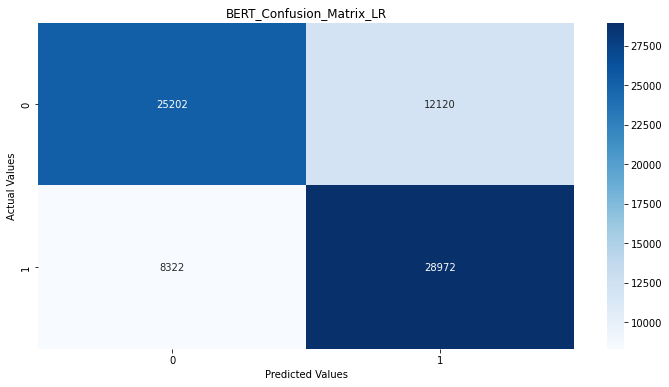

In [28]:
cm=confusion_matrix(y_test,y_pred_bert)
plt.figure(figsize=(12,6))
plt.title("BERT_Confusion_Matrix_LR")
sns.heatmap(cm, annot=True,fmt='d', cmap='Blues')
plt.ylabel("Actual Values")
plt.xlabel("Predicted Values")
plt.savefig('/content/drive/MyDrive/Internship-project/BERT_Confusion_Matrix_LR')

In [29]:
print(classification_report(y_test, y_pred_bert))

              precision    recall  f1-score   support

           0       0.75      0.68      0.71     37322
           1       0.71      0.78      0.74     37294

    accuracy                           0.73     74616
   macro avg       0.73      0.73      0.73     74616
weighted avg       0.73      0.73      0.73     74616



#Gaussian Naive Bayes model :

In [30]:
# import Gaussian Naive Bayes classifier
from sklearn.naive_bayes import GaussianNB

# create a Gaussian Classifier
bert_nb = GaussianNB()

# training the model
bert_nb.fit(X_train, y_train)

# testing the model
y_pred_bert = bert_nb.predict(X_test)



In [31]:
train_acc = bert_nb.score(X_train, y_train)
print("The Accuracy for Training Set is {}".format(train_acc*100))

The Accuracy for Training Set is 73.35087515524066


In [32]:
test_acc = accuracy_score(y_test, y_pred_bert)
print("The Accuracy for Test Set is {}".format(test_acc*100))

The Accuracy for Test Set is 73.29795218183767


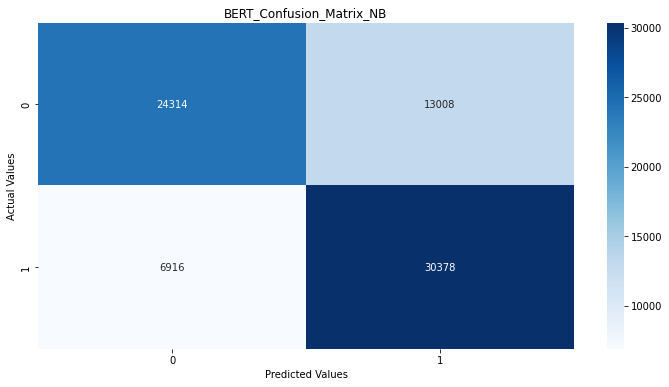

In [33]:
cm=confusion_matrix(y_test,y_pred_bert)
plt.figure(figsize=(12,6))
plt.title("BERT_Confusion_Matrix_NB")
sns.heatmap(cm, annot=True,fmt='d', cmap='Blues')
plt.ylabel("Actual Values")
plt.xlabel("Predicted Values")
plt.savefig('/content/drive/MyDrive/Internship-project/BERT_Confusion_Matrix_NB')



In [34]:
# importing classification report
from sklearn.metrics import classification_report

# printing the report
print(classification_report(y_test, y_pred_bert))

              precision    recall  f1-score   support

           0       0.78      0.65      0.71     37322
           1       0.70      0.81      0.75     37294

    accuracy                           0.73     74616
   macro avg       0.74      0.73      0.73     74616
weighted avg       0.74      0.73      0.73     74616



# Xgboost model :

In [35]:
pip install xgboost

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [36]:
import xgboost as xgb

In [37]:
from xgboost import XGBClassifier
bert_xgb = XGBClassifier()

# training the model
bert_xgb.fit(X_train, y_train)

# testing the model
y_pred_bert = bert_xgb.predict(X_test)



In [38]:
train_acc = bert_xgb.score(X_train, y_train)
print("The Accuracy for Training Set is {}".format(train_acc*100))

The Accuracy for Training Set is 79.75438471091732


In [39]:
test_acc = accuracy_score(y_test, y_pred_bert)
print("The Accuracy for Test Set is {}".format(test_acc*100))

The Accuracy for Test Set is 79.64243593867268


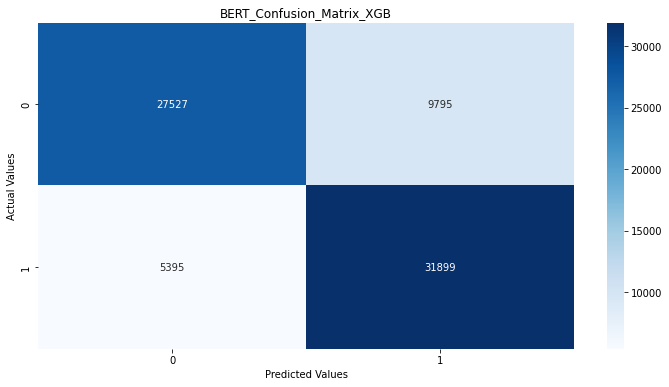

In [40]:
cm=confusion_matrix(y_test,y_pred_bert)
plt.figure(figsize=(12,6))
plt.title("BERT_Confusion_Matrix_XGB")
sns.heatmap(cm, annot=True,fmt='d', cmap='Blues')
plt.ylabel("Actual Values")
plt.xlabel("Predicted Values")
plt.savefig('/content/drive/MyDrive/Internship-project/BERT_Confusion_Matrix_XGB')

In [41]:
print(classification_report(y_test,y_pred_bert))

              precision    recall  f1-score   support

           0       0.84      0.74      0.78     37322
           1       0.77      0.86      0.81     37294

    accuracy                           0.80     74616
   macro avg       0.80      0.80      0.80     74616
weighted avg       0.80      0.80      0.80     74616



##using Grid Search for hyperparameter tuning

In [ ]:
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.metrics import classification_report,log_loss, accuracy_score

##Random Forest

In [ ]:
from sklearn.ensemble import RandomForestClassifier
tuned_parameters_rf = [{'max_depth': list(range(5, 15)), 'max_features': list(range(0,15))}]

clf_rf = GridSearchCV(
    estimator=RandomForestClassifier(), 
    param_grid=tuned_parameters_rf, 
    scoring='r2',
    cv=5,
    return_train_score=True,
    verbose=1
)
clf_rf.fit(X_train, y_train)

In [ ]:
print("Best parameters set found on train set")
print(clf_rf.best_params_)
print(clf_rf.best_estimator_)

print('Score on Test Data: ', clf_rf.score(X_test, y_test))

Best parameters set found on train set
{'max_depth': 10, 'max_features': 10}
RandomForestClassifier(max_depth=10, max_features=10)
Score on Test Data:  0.19679414013900187


In [ ]:
cv_results = pd.DataFrame(clf_rf.cv_results_)
cv_results.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,param_max_features,params,split0_test_score,split1_test_score,split2_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.343840,0.292303,0.000000,0.000000,5,0,"{'max_depth': 5, 'max_features': 0}",NaN,NaN,NaN,...,NaN,NaN,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,16.097849,1.092722,0.407459,0.010737,5,5,"{'max_depth': 5, 'max_features': 5}",0.074469,0.102861,0.084902,...,0.088248,0.009221,4,0.068150,0.104363,0.087342,0.083835,0.104430,0.089624,0.013684
2,26.614408,1.354548,0.383529,0.010890,5,10,"{'max_depth': 5, 'max_features': 10}",0.104758,0.110366,0.113494,...,0.108333,0.005942,3,0.105207,0.111488,0.113588,0.115241,0.112672,0.111639,0.003442
3,0.126830,0.001738,0.000000,0.000000,10,0,"{'max_depth': 10, 'max_features': 0}",NaN,NaN,NaN,...,NaN,NaN,6,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,26.310232,0.845025,0.704265,0.117189,10,5,"{'max_depth': 10, 'max_features': 5}",0.200983,0.199089,0.197838,...,0.196751,0.004187,2,0.217695,0.223172,0.224691,0.223842,0.220581,0.221996,0.002552


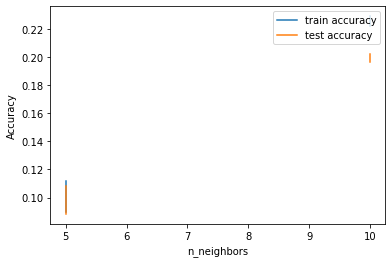

In [ ]:
plt.plot(cv_results['param_max_depth'], cv_results['mean_train_score'])
plt.plot(cv_results['param_max_depth'], cv_results['mean_test_score'])
plt.xlabel('max_depth')
plt.ylabel('Accuracy')
plt.legend(['train accuracy', 'test accuracy'], loc='upper right')

#Training XGBRegressor

In [ ]:
!pip install xgboost

In [ ]:
from xgboost import XGBClassifier

In [ ]:
X_train.values

In [ ]:
tuned_parameters_xgb = [{
        'min_child_weight': [1, 5, 10],
        'gamma': [0.5, 1, 1.5, 2, 5],
        'subsample': [0.6, 0.8, 1.0],
        'colsample_bytree': [0.6, 0.8, 1.0],
        'max_depth': [3, 4, 5]
        }]

clf_xgb = GridSearchCV(
    estimator=XGBClassifier(), 
    param_grid=tuned_parameters_xgb, 
    scoring='r2',
    cv=5,
    return_train_score=True,
    verbose=1
)
clf_xgb.fit(X_train, y_train)

Fitting 5 folds for each of 48 candidates, totalling 240 fits


GridSearchCV(cv=5, estimator=XGBClassifier(),
             param_grid=[{'colsample_bytree': [0.8, 1.0], 'gamma': [1, 1.5, 2],
                          'max_depth': [4, 5], 'min_child_weight': [5, 10],
                          'subsample': [0.8, 1.0]}],
             return_train_score=True, scoring='r2', verbose=1)

In [ ]:
print("Best parameters set found on train set")
print(clf_xgb.best_params_)
print(clf_xgb.best_estimator_)

print('Score on Test Data: ', clf_xgb.score(X_test, y_test))

Best parameters set found on train set
{'colsample_bytree': 1.0, 'gamma': 1.5, 'max_depth': 5, 'min_child_weight': 5, 'subsample': 0.8}
XGBClassifier(colsample_bytree=1.0, gamma=1.5, max_depth=5, min_child_weight=5,
              subsample=0.8)
Score on Test Data:  0.21587852151192555


In [ ]:
cv_results_xgb = pd.DataFrame(clf_xgb.cv_results_)
cv_results_xgb.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_colsample_bytree,param_gamma,param_max_depth,param_min_child_weight,param_subsample,params,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,24.615378,0.925583,0.203392,0.006248,0.8,1,4,5,0.8,"{'colsample_bytree': 0.8, 'gamma': 1, 'max_dep...",...,0.201737,0.004298,41,0.207532,0.207000,0.207268,0.208072,0.208117,0.207598,0.000439
1,24.287171,2.767422,0.212050,0.028369,0.8,1,4,5,1.0,"{'colsample_bytree': 0.8, 'gamma': 1, 'max_dep...",...,0.202273,0.003541,34,0.208381,0.211177,0.210663,0.207961,0.211870,0.210010,0.001556
2,26.213727,4.288599,0.203014,0.009192,0.8,1,4,10,0.8,"{'colsample_bytree': 0.8, 'gamma': 1, 'max_dep...",...,0.201308,0.004077,43,0.205388,0.207715,0.210909,0.207179,0.206688,0.207576,0.001837
3,22.480499,1.132395,0.207268,0.011791,0.8,1,4,10,1.0,"{'colsample_bytree': 0.8, 'gamma': 1, 'max_dep...",...,0.203845,0.004025,25,0.209855,0.210753,0.210775,0.209904,0.209256,0.210109,0.000582
4,30.147754,0.286622,0.252460,0.002855,0.8,1,5,5,0.8,"{'colsample_bytree': 0.8, 'gamma': 1, 'max_dep...",...,0.214263,0.005883,4,0.226563,0.226634,0.227081,0.223395,0.225540,0.225843,0.001324


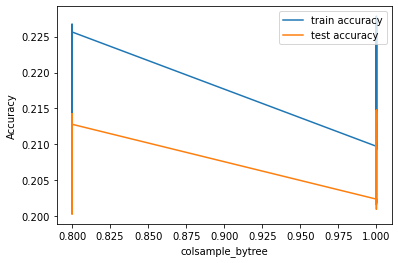

In [ ]:
plt.plot(cv_results_xgb['param_colsample_bytree'], cv_results_xgb['mean_train_score'])
plt.plot(cv_results_xgb['param_colsample_bytree'], cv_results_xgb['mean_test_score'])
plt.xlabel('colsample_bytree')
plt.ylabel('Accuracy')
plt.legend(['train accuracy', 'test accuracy'], loc='upper right')

#Training Decision Tree

In [ ]:
from sklearn.tree import DecisionTreeClassifier

In [ ]:
tuned_parameters_dt = [{'max_leaf_nodes': list(range(2, 30,2)), 'min_samples_split': [2, 3, 4]}]

clf_dt = GridSearchCV(
    estimator=DecisionTreeClassifier(), 
    param_grid=tuned_parameters_dt, 
    scoring='r2',
    cv=5,
    return_train_score=True,
    verbose=1
)
clf_dt.fit(X_train, y_train)

Fitting 5 folds for each of 42 candidates, totalling 210 fits


GridSearchCV(cv=5, estimator=DecisionTreeClassifier(),
             param_grid=[{'max_leaf_nodes': [2, 4, 6, 8, 10, 12, 14, 16, 18, 20,
                                             22, 24, 26, 28],
                          'min_samples_split': [2, 3, 4]}],
             return_train_score=True, scoring='r2', verbose=1)

In [ ]:
print("Best parameters set found on train set")
print(clf_dt.best_params_)
print(clf_dt.best_estimator_)

print('Score on Test Data: ', clf_dt.score(X_test, y_test))

Best parameters set found on train set
{'max_leaf_nodes': 28, 'min_samples_split': 2}
DecisionTreeClassifier(max_leaf_nodes=28)
Score on Test Data:  0.11595355836830268


In [ ]:
cv_results_dt = pd.DataFrame(clf_dt.cv_results_)
cv_results_dt.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_leaf_nodes,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.421923,0.035467,0.012019,0.000911,2,2,"{'max_leaf_nodes': 2, 'min_samples_split': 2}",-0.238061,-0.227725,-0.250776,...,-0.237494,0.009332,40,-0.237352,-0.239936,-0.234173,-0.240204,-0.235804,-0.237494,0.002333
1,0.419222,0.026975,0.011640,0.001066,2,3,"{'max_leaf_nodes': 2, 'min_samples_split': 3}",-0.238061,-0.227725,-0.250776,...,-0.237494,0.009332,40,-0.237352,-0.239936,-0.234173,-0.240204,-0.235804,-0.237494,0.002333
2,0.501102,0.137889,0.012285,0.000833,2,4,"{'max_leaf_nodes': 2, 'min_samples_split': 4}",-0.238061,-0.227725,-0.250776,...,-0.237494,0.009332,40,-0.237352,-0.239936,-0.234173,-0.240204,-0.235804,-0.237494,0.002333
3,0.670718,0.015271,0.013404,0.001399,4,2,"{'max_leaf_nodes': 4, 'min_samples_split': 2}",-0.045968,-0.041971,-0.046885,...,-0.049257,0.006872,37,-0.050079,-0.051079,-0.049850,-0.049247,-0.046031,-0.049257,0.001718
4,0.634533,0.028495,0.011900,0.001354,4,3,"{'max_leaf_nodes': 4, 'min_samples_split': 3}",-0.045968,-0.041971,-0.046885,...,-0.049257,0.006872,37,-0.050079,-0.051079,-0.049850,-0.049247,-0.046031,-0.049257,0.001718


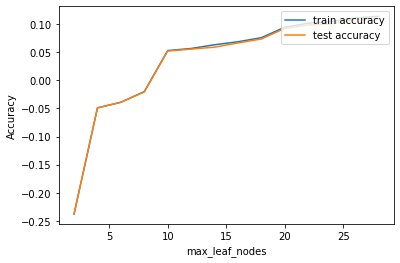

In [ ]:
plt.plot(cv_results_dt['param_max_leaf_nodes'], cv_results_dt['mean_train_score'])
plt.plot(cv_results_dt['param_max_leaf_nodes'], cv_results_dt['mean_test_score'])
plt.xlabel('max_leaf_nodes')
plt.ylabel('Accuracy')
plt.legend(['train accuracy', 'test accuracy'], loc='upper right')